In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# import libs
import pandas as pd
import plotly
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
import scipy.stats as stats
from sklearn.calibration import calibration_curve
import optuna
import optuna.visualization as ov
from optuna.samplers import TPESampler
import os
import pickle

In [3]:
gpu_test = xgb.XGBClassifier(tree_method="gpu_hist")
print("GPU is available:", gpu_test.get_params()["tree_method"] == "gpu_hist")

GPU is available: True


In [4]:
# load dataset
df = pd.read_csv("data/online_gaming_behavior_dataset_preprocessed.csv")

df.head()

,PlayerID,Age,Gender,InGamePurchases,GameDifficulty,SessionsPerWeek,AvgSessionDurationMinutes,PlayerLevel,AchievementsUnlocked,EngagementLevel,AvgPlayTimePerWeek,isAddicted,Location_Europe,Location_Other,Location_USA,Genre_RPG,Genre_Simulation,Genre_Sports,Genre_Strategy
0,9000,43,0,0,1,6,108,79,25,1,648,0,False,True,False,False,False,False,True
1,9001,29,1,0,1,5,144,11,10,1,720,0,False,False,True,False,False,False,True
2,9002,22,1,0,0,16,142,35,41,2,2272,1,False,False,True,False,False,True,False
3,9003,35,0,1,0,9,85,57,47,1,765,0,False,False,True,False,False,False,False
4,9004,33,0,0,1,2,131,95,37,1,262,0,True,False,False,False,False,False,False


In [5]:
# Split dataset

X = df.drop(columns=["EngagementLevel", "PlayerID"]) # remove target feature, PlayerID and add rest to train set
y = df["EngagementLevel"] # set target variable

# 75% train set, 25% test set, random_state=42 for reproducibility, stratify to prevent class imbalance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

print(f"Training Set: X_train = {X_train.shape}, y_train = {y_train.shape}")
print(f"Testing Set: X_test = {X_test.shape}, y_test = {y_test.shape}")

Training Set: X_train = (30025, 17), y_train = (30025,)
Testing Set: X_test = (10009, 17), y_test = (10009,)


In [6]:
# Standardize data
# Standardization is done after data splitting to prevent data-leakage
# from Exploratory Data Analysis, we saw that there aren't any outliers in the data, so we can rule out Robust scaling
# XGBoost doesn't need [0, 1] scaling so we can rule out Min-Max scaling
# However, the numerical features all have different scales, so the best option is Standard scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [7]:
def visualize_model_performance(y_true, y_pred, model_name, class_labels=None):
    if class_labels is None:
        class_labels = np.unique(y_true)

    fig, axes = plt.subplots(2, 2, figsize=(14, 12), gridspec_kw={"wspace": 0.175, "hspace": 0.25})
    fig.suptitle(f"Classification Performance - {model_name}", fontsize=16, x=0.6)
    fig.subplots_adjust(right=1.05, top=0.8)

    # Conf matrix
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(
        cm, annot=True, cmap='flare', fmt='d', linewidths=0.5, linecolor='black',
        annot_kws={"size": 10, "weight": "bold"}, cbar_kws={'shrink': 0.75}, ax=axes[0, 0]
    )
    axes[0, 0].set_title("Confusion Matrix", fontsize=14)
    axes[0, 0].set_xlabel("Predicted Label")
    axes[0, 0].set_ylabel("True Label")
    for text in axes[0, 0].texts:
        text.set_color("white")
    for _, spine in axes[0, 0].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1)

    # legend for the entire canvas containing class labels
    legend_labels = ["0 → Low", "1 → Medium", "2 → High"]
    legend_text = "Engagement Level\n\n" + "\n".join(legend_labels)
    fig.text(1, 0.925, legend_text, fontsize=12, verticalalignment="top",
             bbox=dict(facecolor="white", alpha=0.8, edgecolor="black"))

    # Bar-chart for Per-Class Accuracy
    class_acc = np.divide(cm.diagonal(), cm.sum(axis=1, where=cm.sum(axis=1) != 0), out=np.zeros_like(cm.diagonal(), dtype=float), where=cm.sum(axis=1) != 0)
    colors = plt.cm.Set3(np.linspace(0, 1, len(class_labels)))
    sns.barplot(x=class_labels, y=class_acc, palette=colors, ax=axes[0, 1])
    axes[0, 1].set_xlabel("Classes")
    axes[0, 1].set_ylabel("Accuracy")
    axes[0, 1].set_title("Per-Class Accuracy", fontsize=14)
    axes[0, 1].set_ylim(0, 1)
    for index, value in enumerate(class_acc):
        axes[0, 1].text(index, value - 0.05, f"{value:.3f}", ha="center", fontsize=10, color="black", fontstyle="italic")

    # Weighted Misclassification Heatmap
    cm_weighted = cm / cm.sum(axis=1, where=cm.sum(axis=1) != 0).reshape(-1, 1)
    sns.heatmap(cm_weighted, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=class_labels, yticklabels=class_labels, ax=axes[1, 0], linewidths=0.5, linecolor="black", cbar_kws={'shrink': 0.75})
    axes[1, 0].set_xlabel("Predicted Label")
    axes[1, 0].set_ylabel("True Label")
    axes[1, 0].set_title("Misclassification Heatmap", fontsize=14)
    for _, spine in axes[1, 0].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1)

    # Prediction Distribution
    sns.violinplot(x=y_true, y=y_pred, inner="point", palette="coolwarm", ax=axes[1, 1])
    axes[1, 1].set_xlabel("True Label")
    axes[1, 1].set_ylabel("Predicted Label")
    axes[1, 1].set_title("Prediction Distribution Per Class", fontsize=14)
    
    plt.show()

In [8]:
# Baseline Model Training

baseline_model_path = "models/baseline_xgboost_model.pkl"

# convert data to DMatrix format for XGBoost model
dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_test, label=y_test)

if os.path.exists(baseline_model_path):
    print("Loading existing Baseline Model...\n")
    with open(baseline_model_path, "rb") as file:
        baseline_model = pickle.load(file)
else:
    # Set standard default parameters for XGBoost
    baseline_params = {
        "objective": "multi:softmax",
        "num_class": len(set(y_train)),
        "eval_metric": "mlogloss",
        "tree_method": "gpu_hist",
        "learning_rate": 0.3,
        "max_depth": 6,
        "min_child_weight": 1,
        "subsample": 1.0,
        "colsample_bytree": 1.0,
        "gamma": 0,
        "lambda": 1,
        "alpha": 0,
        "n_estimators": 100,
        "enable_categorical": True
    }

    baseline_model = xgb.train(
        baseline_params,
        dtrain,
        num_boost_round=100,
        evals=[(dvalid, "eval")],
        early_stopping_rounds=10,
        verbose_eval=False
    )

    with open(baseline_model_path, "wb") as file:
        pickle.dump(baseline_model, file)
        
    print(f"Model saved to {baseline_model_path}\n")

y_pred_baseline = baseline_model.predict(dvalid) # predict using test data

# get accuracy metrics
accuracy = accuracy_score(y_test, y_pred_baseline)
f1 = f1_score(y_test, y_pred_baseline, average="weighted")

# print metrics
print(f"Baseline Model Performance:")
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print("\nClassification Report:\n", classification_report(y_test, y_pred_baseline))

Loading existing Baseline Model...

Baseline Model Performance:
Accuracy: 0.9280647417324408
F1 Score: 0.9278406866424681

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.90      0.91      2581
           1       0.93      0.96      0.94      4844
           2       0.93      0.90      0.91      2584

    accuracy                           0.93     10009
   macro avg       0.93      0.92      0.92     10009
weighted avg       0.93      0.93      0.93     10009



## Summary of Metrics showing Baseline Model Performance

#### Accuracy: *0.9280*
- The model correctly predicts *92.80%* of the test set data samples's classes

#### F1 Score: *0.9278*
- When both precision and recall across all classes are considered, the model scores *92.78%* on average.

#### Classification Report:
- **Class 0 *(low)* :**
  - **Precision *(0.93)* :** *93%* of the instances predicted as *low* by the model were actually *low* in the test set.
  - **Recall *(0.90)* :** *90%* of the actually *low* samples were correctly classified by the model.
  - **F1-score *(0.91)* :** The mean of precision and recall comes out to *91%* which is a good score.
- **Class 1 *(medium)* :**
  - **Precision *(0.93)* :** *93%* of the instances predicted as *medium* by the model were actually *medium* in the test set.
  - **Recall *(0.96)* :** *96%* of the actually *medium* samples were correctly classified by the model. The significantly high recall suggests the model performs extremely well in predicting *medium* engagement of test samples. 
  - **F1-score *(0.94)* :** The mean of precision and recall comes out to *94%* which makes it the best performing class out of all three.
- **Class 2 *(high)* :**
  - **Precision *(0.93)* :** *93%* of the instances predicted as *high* by the model were actually *high* in the test set.
  - **Recall *(0.90)* :** *90%* of the actually *high* samples were correctly classified by the model.
  - **F1-score *(0.91)* :** The mean of precision and recall comes out to *91%* which is lower than that of *medium* but still a good score.
- **Macro Avg *(0.92)* & Weighted Avg *(0.93)* :** The minimal difference between these two averages suggests that the model does not favor any one class over the others.

#### Conclusion
- Overall, the model performs very well across all engagement levels.
- There is no noticable bias across the classes.

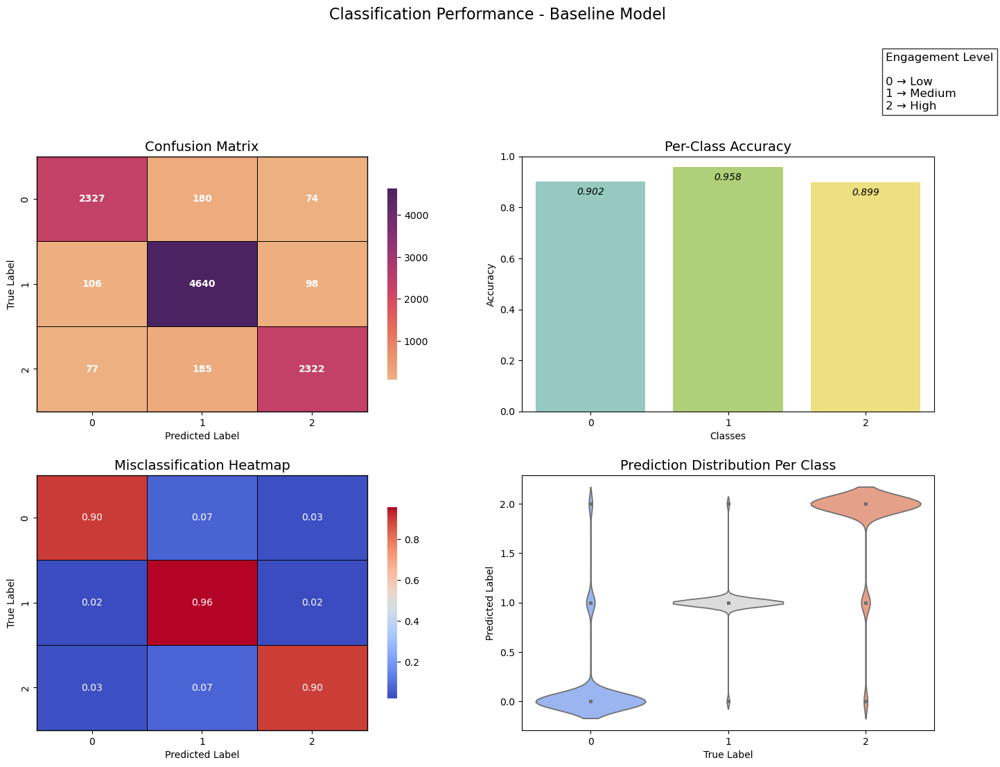

In [9]:
# Model Performance - Baseline
visualize_model_performance(y_test, y_pred_baseline, "Baseline Model")

## Summary of Plots showing Baseline Model Performance

#### Confusion Matrix:
- **Class 0 *(low)* :**
  - The model correctly classified *2327* samples out of *2581* total samples.
  - The model incorrectly predicted *180* samples as *medium* and *74* samples as *high*
- **Class 1 *(medium)* :**
  - The model correctly classified *4640* samples out of *4844* total samples.
  - The model incorrectly predicted *106* samples as *low* and *98* samples as *high*.
- **Class 2 *(high)* :**
  - The model correctly classified *2322* samples out of *2584* total samples.
  - The model incorrectly predicted *77* samples as *low* and *185* samples as *medium*.

#### Per-Class Accuracy:
- **Class 0 *(low)* : *(0.902)***
  - The model correctly classifies *90.2%* of players with *low* Engagement.
- **Class 1 *(medium)* :*(0.958)***
  - The model correctly classifies *95.8%* of players with *medium* Engagement.
- **Class 2 *(high)* :*(0.899)***
  - The model correctly classifies *89.9%* of players with *high* Engagement.
 
#### Misclassification Heatmap:
- **Class 0 *(low)* :**
  - The model correctly predicted *90%* of the samples as *low*.
  - The model incorrectly predicted *7%* of the *low* samples as *medium* and *3%* of them as *high*.
- **Class 1 *(medium)* :**
  - The model correctly predicted *96%* of the samples as *medium*.
  - The model incorrectly predicted *2%* of the *medium* samples as *low* and *2%* of them as *high*.
- **Class 2 *(high)* :**
  - The model correctly predicted *90%* of the samples as *high*.
  - The model incorrectly predicted *3%* of the *high* samples as *low* and *7%* of them as *medium*.

#### Prediction Distribution Per Class:
- **Class 0 *(low)* :**
  - Most predictions are correctly concentrated at 0.
  - However, a small proportion of class 0 samples are predicted as *medium (1)*, and a few even as *high (2)*
- **Class 1 *(medium)* :**
  - Predictions are tightly concentrated around 1 (*medium*), demonstrating strong confidence in predicting this class.
  - Very few samples can be observed at 0 or 2, meaning the model is less confused while predicting this class.
- **Class 2 *(high)* :**
  - A large proportion of predictions are at 2.
  - Some *high* engagement players are misclassified as *medium (1)*, with very few being being predicted as *low (0)*

In [10]:
# Find best hyperparameters for the XGBoost model using Optuna

# Define Objective function for running the study
def objective(trial):
    # Hyperparameter search space
    params = {
        "objective": "multi:softmax",
        "num_class": len(set(y_train)),
        "eval_metric": "mlogloss",
        "tree_method": "gpu_hist",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 1.0, log=True),
        "max_depth": trial.suggest_int("max_depth", 3, 32),
        "min_child_weight": trial.suggest_categorical("min_child_weight", [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 
        "subsample": trial.suggest_float("subsample", 0.001, 1.0, log=True),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.001, 1.0, log=True),
        "gamma": trial.suggest_float("gamma", 1e-8, 1.0, log=True),
        "lambda": trial.suggest_float("lambda", 0.001, 10.0, log=True),
        "alpha": trial.suggest_float("alpha", 0.001, 10.0, log=True),
        "eta": trial.suggest_float("eta", 1e-8, 1.0, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [32, 64, 128, 256, 512, 768, 1024, 1536, 2048, 3096, 4096, 5120]),
        "enable_categorical": trial.suggest_categorical("enable_categorical", [True]),
    }

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dvalid = xgb.DMatrix(X_test, label=y_test)

    model = xgb.train(params, dtrain, num_boost_round=100, evals=[(dvalid, "eval")], early_stopping_rounds=10, verbose_eval=False)

    y_pred = model.predict(dvalid)

    # We maximize based on accuracy
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

In [11]:
study = optuna.create_study(direction="maximize", sampler=TPESampler())
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2025-03-02 10:13:59,843] A new study created in memory with name: no-name-db853c92-2c79-4633-85da-e28904aecec5
Best trial: 0. Best value: 0.483964:   0%|▎                                                                                | 2/500 [00:00<01:41,  4.89it/s]

[I 2025-03-02 10:14:00,084] Trial 0 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.006335622134027893, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.020318684597102104, 'colsample_bytree': 0.01687044886045069, 'gamma': 7.279261185262584e-08, 'lambda': 0.7409449563136085, 'alpha': 0.21867513005996855, 'eta': 0.00729845220468018, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 0 with value: 0.48396443201118994.
[I 2025-03-02 10:14:00,266] Trial 1 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.011203141730069663, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.061404773428177746, 'colsample_bytree': 0.01991951493047241, 'gamma': 0.0005221471028817493, 'lambda': 0.08671875103055926, 'alpha': 0.7190195950043019, 'eta': 8.966024487598034e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 0 with value: 0.48396443201118994.


Best trial: 2. Best value: 0.882306:   1%|▍                                                                                | 3/500 [00:00<01:27,  5.66it/s]

[I 2025-03-02 10:14:00,410] Trial 2 finished with value: 0.882305924667799 and parameters: {'learning_rate': 0.2497479267983044, 'max_depth': 16, 'min_child_weight': 9, 'subsample': 0.0073599865544952065, 'colsample_bytree': 0.002871254576387238, 'gamma': 1.7677920955302459e-06, 'lambda': 0.001465695458859861, 'alpha': 1.564351493440354, 'eta': 0.002274396739396474, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 2 with value: 0.882305924667799.


Best trial: 3. Best value: 0.890998:   1%|▋                                                                                | 4/500 [00:00<01:33,  5.30it/s]

[I 2025-03-02 10:14:00,617] Trial 3 finished with value: 0.8909981017084624 and parameters: {'learning_rate': 0.4300104681000531, 'max_depth': 26, 'min_child_weight': 20, 'subsample': 0.5256712746316032, 'colsample_bytree': 0.002172801990170773, 'gamma': 0.054024406453542236, 'lambda': 0.25145053649300014, 'alpha': 0.6970884233449719, 'eta': 0.00019956738218956303, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 3 with value: 0.8909981017084624.


Best trial: 3. Best value: 0.890998:   1%|▉                                                                                | 6/500 [00:01<01:45,  4.68it/s]

[I 2025-03-02 10:14:00,898] Trial 4 finished with value: 0.5149365570986113 and parameters: {'learning_rate': 0.025437200523074216, 'max_depth': 24, 'min_child_weight': 7, 'subsample': 0.3347759176684122, 'colsample_bytree': 0.09616459734729729, 'gamma': 0.008671049505591586, 'lambda': 0.05858877767847545, 'alpha': 0.026038150484703645, 'eta': 0.000993984569474005, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 3 with value: 0.8909981017084624.
[I 2025-03-02 10:14:01,095] Trial 5 finished with value: 0.8629233689679289 and parameters: {'learning_rate': 0.09127599509928018, 'max_depth': 27, 'min_child_weight': 16, 'subsample': 0.10817186893876253, 'colsample_bytree': 0.0013310090294607199, 'gamma': 3.612138656674364e-05, 'lambda': 0.03881544111628469, 'alpha': 1.321770197375991, 'eta': 7.428283487664681e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 3 with value: 0.8909981017084624.


Best trial: 3. Best value: 0.890998:   1%|█▏                                                                               | 7/500 [00:01<01:49,  4.49it/s]

[I 2025-03-02 10:14:01,336] Trial 6 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.004827539122169963, 'max_depth': 24, 'min_child_weight': 14, 'subsample': 0.1246323534936462, 'colsample_bytree': 0.004575557706016002, 'gamma': 4.888029382064329e-06, 'lambda': 0.2065518320422498, 'alpha': 0.019816971382633847, 'eta': 0.052141921928233706, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 3 with value: 0.8909981017084624.


Best trial: 7. Best value: 0.893895:   2%|█▍                                                                               | 9/500 [00:01<01:46,  4.62it/s]

[I 2025-03-02 10:14:01,620] Trial 7 finished with value: 0.8938954940553502 and parameters: {'learning_rate': 0.6036584614450216, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.659989336191504, 'colsample_bytree': 0.028792469162881036, 'gamma': 2.176236223326447e-07, 'lambda': 0.4580066311714398, 'alpha': 0.02490388247363453, 'eta': 2.260234029574804e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 7 with value: 0.8938954940553502.
[I 2025-03-02 10:14:01,780] Trial 8 finished with value: 0.8314516934758717 and parameters: {'learning_rate': 0.0659829243259377, 'max_depth': 21, 'min_child_weight': 16, 'subsample': 0.02010479714384798, 'colsample_bytree': 0.00375400679720956, 'gamma': 9.015447844572723e-06, 'lambda': 0.001471506457230006, 'alpha': 0.0020682099382090422, 'eta': 3.0158655361034106e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 7 with value: 0.8938954940553502.


Best trial: 10. Best value: 0.925167:   2%|█▋                                                                             | 11/500 [00:02<01:29,  5.46it/s]

[I 2025-03-02 10:14:01,946] Trial 9 finished with value: 0.8754121290838246 and parameters: {'learning_rate': 0.12145628447797928, 'max_depth': 26, 'min_child_weight': 10, 'subsample': 0.019658922421726892, 'colsample_bytree': 0.020810283952296494, 'gamma': 2.6371633530875006e-08, 'lambda': 0.8393148985898121, 'alpha': 0.393471542447145, 'eta': 0.35278072793887894, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 7 with value: 0.8938954940553502.
[I 2025-03-02 10:14:02,089] Trial 10 finished with value: 0.925167349385553 and parameters: {'learning_rate': 0.8370139337728866, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.8059614985080125, 'colsample_bytree': 0.5446477698699399, 'gamma': 2.441510237115267e-07, 'lambda': 8.482170706826883, 'alpha': 6.957387226560785, 'eta': 1.0773417875640428e-08, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.


Best trial: 10. Best value: 0.925167:   2%|█▋                                                                             | 11/500 [00:02<01:29,  5.46it/s]

[I 2025-03-02 10:14:02,147] Trial 11 finished with value: 0.864821660505545 and parameters: {'learning_rate': 0.8759673774381591, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.0013538004517770143, 'colsample_bytree': 0.8015441306136323, 'gamma': 5.019817018541434e-07, 'lambda': 5.359145400649788, 'alpha': 0.04199063346696148, 'eta': 1.278907857879524e-08, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.


Best trial: 10. Best value: 0.925167:   3%|██▏                                                                            | 14/500 [00:02<01:12,  6.70it/s]

[I 2025-03-02 10:14:02,348] Trial 12 finished with value: 0.7506244380057948 and parameters: {'learning_rate': 0.001215501516440847, 'max_depth': 32, 'min_child_weight': 5, 'subsample': 0.9948124679537126, 'colsample_bytree': 0.13983427795326137, 'gamma': 1.0119640768187054e-08, 'lambda': 9.038563460051746, 'alpha': 8.029773965722278, 'eta': 1.0574264053205032e-08, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.
[I 2025-03-02 10:14:02,471] Trial 13 finished with value: 0.9129783195124388 and parameters: {'learning_rate': 0.9236918018007284, 'max_depth': 10, 'min_child_weight': 5, 'subsample': 0.2654825833180366, 'colsample_bytree': 0.8219801315629078, 'gamma': 0.0002808607826169932, 'lambda': 1.779803882184405, 'alpha': 0.003209655771992006, 'eta': 3.0453690089611414e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.


Best trial: 10. Best value: 0.925167:   3%|██▌                                                                            | 16/500 [00:02<01:11,  6.81it/s]

[I 2025-03-02 10:14:02,566] Trial 14 finished with value: 0.9164751723448896 and parameters: {'learning_rate': 0.9974406372116024, 'max_depth': 9, 'min_child_weight': 8, 'subsample': 0.2073357842633124, 'colsample_bytree': 0.9483446244686028, 'gamma': 0.0007759900735718562, 'lambda': 2.697722483142496, 'alpha': 0.0017233512730529357, 'eta': 1.6657459340113683e-07, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.
[I 2025-03-02 10:14:02,758] Trial 15 finished with value: 0.9077829953042262 and parameters: {'learning_rate': 0.22298864035734317, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.21877547400013908, 'colsample_bytree': 0.26193622838441044, 'gamma': 0.004709132761167471, 'lambda': 3.285881031287831, 'alpha': 6.691101455275214, 'eta': 1.3219982699134373e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.


Best trial: 10. Best value: 0.925167:   3%|██▋                                                                            | 17/500 [00:03<01:22,  5.83it/s]

[I 2025-03-02 10:14:03,012] Trial 16 finished with value: 0.9135777799980018 and parameters: {'learning_rate': 0.2951262348130012, 'max_depth': 11, 'min_child_weight': 8, 'subsample': 0.05796564300373151, 'colsample_bytree': 0.2724218814048607, 'gamma': 0.1410753691932527, 'lambda': 0.010564959571317256, 'alpha': 0.004490568124924392, 'eta': 1.48490012901211e-07, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.


Best trial: 10. Best value: 0.925167:   4%|██▊                                                                            | 18/500 [00:03<01:40,  4.79it/s]

[I 2025-03-02 10:14:03,334] Trial 17 finished with value: 0.910680387651114 and parameters: {'learning_rate': 0.038984634360771146, 'max_depth': 9, 'min_child_weight': 19, 'subsample': 0.1755410627694655, 'colsample_bytree': 0.36130280337265314, 'gamma': 0.7148971502600074, 'lambda': 2.1154603159121868, 'alpha': 0.0010881214293891803, 'eta': 6.263587871309782e-08, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.


Best trial: 19. Best value: 0.926466:   4%|███▎                                                                           | 21/500 [00:03<01:18,  6.06it/s]

[I 2025-03-02 10:14:03,577] Trial 18 finished with value: 0.8770106903786592 and parameters: {'learning_rate': 0.15004888985413128, 'max_depth': 14, 'min_child_weight': 17, 'subsample': 0.9928604302573439, 'colsample_bytree': 0.0865510064281765, 'gamma': 4.43248989727242e-05, 'lambda': 9.986425634570509, 'alpha': 0.11708131152641352, 'eta': 8.408047819005826e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 10 with value: 0.925167349385553.
[I 2025-03-02 10:14:03,671] Trial 19 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.5058906672350441, 'max_depth': 6, 'min_child_weight': 11, 'subsample': 0.4053073838806933, 'colsample_bytree': 0.9754661388222059, 'gamma': 0.0016193308391740777, 'lambda': 1.351900125559908, 'alpha': 0.007153504371573309, 'eta': 2.2087611146212813e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:03,766] Trial 20 finished with value: 0.8681186931

Best trial: 19. Best value: 0.926466:   5%|███▋                                                                           | 23/500 [00:04<01:13,  6.49it/s]

[I 2025-03-02 10:14:03,870] Trial 21 finished with value: 0.9208712159056849 and parameters: {'learning_rate': 0.9273279783171001, 'max_depth': 7, 'min_child_weight': 13, 'subsample': 0.43157603735293143, 'colsample_bytree': 0.7034866029085047, 'gamma': 0.0007958029446909626, 'lambda': 3.946456580485374, 'alpha': 0.006844016145525645, 'eta': 1.8810317378061572e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:04,034] Trial 22 finished with value: 0.9240683384953542 and parameters: {'learning_rate': 0.4683747130871392, 'max_depth': 6, 'min_child_weight': 13, 'subsample': 0.4549302323308201, 'colsample_bytree': 0.48465956900978724, 'gamma': 0.0001404072183938079, 'lambda': 5.903962661757236, 'alpha': 0.00692733954393889, 'eta': 2.990221653197466e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   5%|███▊                                                                           | 24/500 [00:04<01:18,  6.08it/s]

[I 2025-03-02 10:14:04,228] Trial 23 finished with value: 0.9057847936856829 and parameters: {'learning_rate': 0.43627407444098426, 'max_depth': 3, 'min_child_weight': 15, 'subsample': 0.5252130069279782, 'colsample_bytree': 0.131172996912529, 'gamma': 9.689851607071849e-05, 'lambda': 9.871374829478237, 'alpha': 0.008020678403688475, 'eta': 9.73612682497372e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   5%|███▉                                                                           | 25/500 [00:04<01:28,  5.38it/s]

[I 2025-03-02 10:14:04,470] Trial 24 finished with value: 0.9164751723448896 and parameters: {'learning_rate': 0.20818681644799844, 'max_depth': 14, 'min_child_weight': 12, 'subsample': 0.06044393378136689, 'colsample_bytree': 0.47762637313978173, 'gamma': 0.022588421328472903, 'lambda': 1.4508981477321552, 'alpha': 0.0621421292951804, 'eta': 4.2527025912740865e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   5%|████▎                                                                          | 27/500 [00:05<01:35,  4.96it/s]

[I 2025-03-02 10:14:04,744] Trial 25 finished with value: 0.8939954041362773 and parameters: {'learning_rate': 0.05453534991806813, 'max_depth': 12, 'min_child_weight': 11, 'subsample': 0.11078557336594438, 'colsample_bytree': 0.19976101200113577, 'gamma': 1.0152395084107078e-05, 'lambda': 4.409504514809689, 'alpha': 3.734148220884625, 'eta': 0.00018078425755033078, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:04,924] Trial 26 finished with value: 0.9244679788190628 and parameters: {'learning_rate': 0.49922651266677515, 'max_depth': 7, 'min_child_weight': 13, 'subsample': 0.7681515539369875, 'colsample_bytree': 0.4924540428528793, 'gamma': 6.489509001308295e-07, 'lambda': 0.3679903922020293, 'alpha': 0.08131611026894432, 'eta': 1.3925382066126673e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   6%|████▌                                                                          | 29/500 [00:05<01:30,  5.20it/s]

[I 2025-03-02 10:14:05,163] Trial 27 finished with value: 0.8771106004595863 and parameters: {'learning_rate': 0.15134531494966943, 'max_depth': 8, 'min_child_weight': 13, 'subsample': 0.9996092136626309, 'colsample_bytree': 0.045840750407550035, 'gamma': 9.22500990407214e-07, 'lambda': 0.32607673093351824, 'alpha': 0.1360183404929557, 'eta': 7.454956761535003e-06, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:05,307] Trial 28 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.015404873434016458, 'max_depth': 4, 'min_child_weight': 20, 'subsample': 0.007966847955289876, 'colsample_bytree': 0.009442491680352333, 'gamma': 1.4370876674366534e-07, 'lambda': 0.14926191278398668, 'alpha': 0.31852509930110845, 'eta': 3.2456526072746545e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   6%|████▋                                                                          | 30/500 [00:05<01:39,  4.74it/s]

[I 2025-03-02 10:14:05,562] Trial 29 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.0023222651673243033, 'max_depth': 13, 'min_child_weight': 11, 'subsample': 0.33314085768437396, 'colsample_bytree': 0.06806575113245499, 'gamma': 2.7756233188506155e-08, 'lambda': 0.564634489081476, 'alpha': 0.05268189069177155, 'eta': 0.012040157049470097, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   6%|█████                                                                          | 32/500 [00:06<01:35,  4.88it/s]

[I 2025-03-02 10:14:05,781] Trial 30 finished with value: 0.9135777799980018 and parameters: {'learning_rate': 0.5932451499449198, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.6829234128543465, 'colsample_bytree': 0.20723664508800257, 'gamma': 3.8195099343198845e-07, 'lambda': 0.01659253492505985, 'alpha': 2.699612538739134, 'eta': 0.0003534945065387282, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:05,966] Trial 31 finished with value: 0.9236686981716455 and parameters: {'learning_rate': 0.3417202065096799, 'max_depth': 6, 'min_child_weight': 13, 'subsample': 0.4035837610917311, 'colsample_bytree': 0.5288817402272097, 'gamma': 2.770116517519915e-06, 'lambda': 1.0072555647759303, 'alpha': 0.0121266124536985, 'eta': 5.897596984270994e-07, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   7%|█████▏                                                                         | 33/500 [00:06<01:25,  5.46it/s]

[I 2025-03-02 10:14:06,098] Trial 32 finished with value: 0.92456788889999 and parameters: {'learning_rate': 0.5863725314006378, 'max_depth': 7, 'min_child_weight': 6, 'subsample': 0.6462808385228664, 'colsample_bytree': 0.5314222306339376, 'gamma': 0.0001719925207339017, 'lambda': 4.768714611988826, 'alpha': 0.20862933385049864, 'eta': 3.9106524603203463e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   7%|█████▎                                                                         | 34/500 [00:06<01:30,  5.13it/s]

[I 2025-03-02 10:14:06,321] Trial 33 finished with value: 0.9204715755819762 and parameters: {'learning_rate': 0.6054360298126609, 'max_depth': 8, 'min_child_weight': 6, 'subsample': 0.7406510445200102, 'colsample_bytree': 0.3187776028235765, 'gamma': 1.6469641518625054e-05, 'lambda': 2.0617669731622055, 'alpha': 0.25671987235398647, 'eta': 7.2210301208938755e-06, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   7%|█████▌                                                                         | 35/500 [00:06<01:49,  4.25it/s]

[I 2025-03-02 10:14:06,649] Trial 34 finished with value: 0.9230692376860825 and parameters: {'learning_rate': 0.2559374585787365, 'max_depth': 16, 'min_child_weight': 6, 'subsample': 0.29561182899606525, 'colsample_bytree': 0.5618918265924, 'gamma': 0.0024517046487460194, 'lambda': 0.6178145676563506, 'alpha': 0.6150715575754672, 'eta': 3.917974702299816e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:06,745] Trial 35 finished with value: 0.9140773304026376 and parameters: {'learning_rate': 0.6255023158793913, 'max_depth': 11, 'min_child_weight': 18, 'subsample': 0.04173930871842827, 'colsample_bytree': 0.9474424189317133, 'gamma': 6.192992351155645e-08, 'lambda': 5.442966561005153, 'alpha': 1.219729879066172, 'eta': 0.0008928254029766153, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   7%|█████▊                                                                         | 37/500 [00:07<01:38,  4.70it/s]

[I 2025-03-02 10:14:07,023] Trial 36 finished with value: 0.9025876710960136 and parameters: {'learning_rate': 0.10278559727133098, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.17423329054551856, 'colsample_bytree': 0.19258726292117143, 'gamma': 9.455271034108673e-07, 'lambda': 0.10782690289947466, 'alpha': 0.17358153355411263, 'eta': 3.1852533653631285e-06, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   8%|██████                                                                         | 38/500 [00:07<01:57,  3.93it/s]

[I 2025-03-02 10:14:07,406] Trial 37 finished with value: 0.9026875811769407 and parameters: {'learning_rate': 0.1763148949534785, 'max_depth': 7, 'min_child_weight': 6, 'subsample': 0.6758307961254864, 'colsample_bytree': 0.14126176249993141, 'gamma': 3.763496461634913e-05, 'lambda': 0.4251534135826752, 'alpha': 0.06768685004685716, 'eta': 0.0066842921547837185, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   8%|██████▏                                                                        | 39/500 [00:07<01:54,  4.04it/s]

[I 2025-03-02 10:14:07,632] Trial 38 finished with value: 0.8882006194425017 and parameters: {'learning_rate': 0.3050517636825487, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.5557337678075348, 'colsample_bytree': 0.008588026234009016, 'gamma': 0.0002768331317187366, 'lambda': 1.3180549007451507, 'alpha': 2.540141886987896, 'eta': 6.76613830436817e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   8%|██████▎                                                                        | 40/500 [00:08<02:30,  3.06it/s]

[I 2025-03-02 10:14:08,171] Trial 39 finished with value: 0.9079828154660805 and parameters: {'learning_rate': 0.008499007778154101, 'max_depth': 10, 'min_child_weight': 14, 'subsample': 0.08332951230983983, 'colsample_bytree': 0.6182468321013843, 'gamma': 0.0017310402616342521, 'lambda': 0.23620732145603193, 'alpha': 0.034455436536253214, 'eta': 8.730444481581324e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   8%|██████▋                                                                        | 42/500 [00:08<01:57,  3.90it/s]

[I 2025-03-02 10:14:08,390] Trial 40 finished with value: 0.896193425916675 and parameters: {'learning_rate': 0.08074286082209718, 'max_depth': 8, 'min_child_weight': 10, 'subsample': 0.009166029834959665, 'colsample_bytree': 0.34753374429271155, 'gamma': 0.017030626448603727, 'lambda': 0.058157970367296266, 'alpha': 0.5438563880897772, 'eta': 1.741145628963176e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:08,545] Trial 41 finished with value: 0.9231691477670096 and parameters: {'learning_rate': 0.3775773765476939, 'max_depth': 5, 'min_child_weight': 13, 'subsample': 0.367345728322462, 'colsample_bytree': 0.44441164490295104, 'gamma': 9.258128936731628e-05, 'lambda': 4.9364461511212365, 'alpha': 0.017128063413863248, 'eta': 2.5282157975242393e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 19. Best value: 0.926466:   9%|██████▊                                                                        | 43/500 [00:08<01:40,  4.54it/s]

[I 2025-03-02 10:14:08,677] Trial 42 finished with value: 0.9237686082525727 and parameters: {'learning_rate': 0.5406212898703281, 'max_depth': 6, 'min_child_weight': 13, 'subsample': 0.49846269124031745, 'colsample_bytree': 0.6308374178140151, 'gamma': 0.0002770032254507067, 'lambda': 7.099149443357804, 'alpha': 0.005530965400003355, 'eta': 3.3881317240483793e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.


Best trial: 44. Best value: 0.927066:   9%|███████                                                                        | 45/500 [00:09<01:25,  5.34it/s]

[I 2025-03-02 10:14:08,878] Trial 43 finished with value: 0.9153761614546908 and parameters: {'learning_rate': 0.6902796419549896, 'max_depth': 5, 'min_child_weight': 19, 'subsample': 0.13951483864905895, 'colsample_bytree': 0.23431303498314388, 'gamma': 4.572723682063806e-06, 'lambda': 3.260195188759025, 'alpha': 0.0025438010723965753, 'eta': 1.0644929960914849e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9264661804376062.
[I 2025-03-02 10:14:08,999] Trial 44 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.4633307230079525, 'max_depth': 7, 'min_child_weight': 12, 'subsample': 0.7756134116037655, 'colsample_bytree': 0.9738645836149268, 'gamma': 1.534223742149222e-05, 'lambda': 2.425942288318012, 'alpha': 0.009268117729362039, 'eta': 2.7255478352830946e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:   9%|███████▍                                                                       | 47/500 [00:09<01:13,  6.16it/s]

[I 2025-03-02 10:14:09,186] Trial 45 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.7181875160628512, 'max_depth': 21, 'min_child_weight': 12, 'subsample': 0.7916731167419924, 'colsample_bytree': 0.8978799949303956, 'gamma': 1.358497379981683e-06, 'lambda': 2.0975179349997477, 'alpha': 1.1016346090723836, 'eta': 1.8392761096914018e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.
[I 2025-03-02 10:14:09,291] Trial 46 finished with value: 0.9237686082525727 and parameters: {'learning_rate': 0.8207342996470243, 'max_depth': 22, 'min_child_weight': 16, 'subsample': 0.24873385065452838, 'colsample_bytree': 0.9941737586612672, 'gamma': 2.1299793906391396e-06, 'lambda': 2.4660169431947505, 'alpha': 1.03646044163062, 'eta': 1.654974136034506e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  10%|███████▌                                                                       | 48/500 [00:09<01:21,  5.52it/s]

[I 2025-03-02 10:14:09,515] Trial 47 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.352511070548852, 'max_depth': 20, 'min_child_weight': 12, 'subsample': 0.879258148712093, 'colsample_bytree': 0.7793988241900863, 'gamma': 2.1363259810311908e-05, 'lambda': 0.7623726009451853, 'alpha': 5.924452335881352, 'eta': 3.522827941088142e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  10%|███████▋                                                                       | 49/500 [00:10<02:01,  3.72it/s]

[I 2025-03-02 10:14:09,991] Trial 48 finished with value: 0.9235687880907184 and parameters: {'learning_rate': 0.02353090984813667, 'max_depth': 20, 'min_child_weight': 12, 'subsample': 0.8964548527266366, 'colsample_bytree': 0.7258948011714945, 'gamma': 1.5841745705552988e-05, 'lambda': 0.869722341600308, 'alpha': 5.095530826112251, 'eta': 4.4096468454316353e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  10%|███████▉                                                                       | 50/500 [00:10<02:04,  3.60it/s]

[I 2025-03-02 10:14:10,288] Trial 49 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.3150425297369953, 'max_depth': 23, 'min_child_weight': 12, 'subsample': 0.527703771935951, 'colsample_bytree': 0.7903461860440503, 'gamma': 1.6814407829414886e-07, 'lambda': 1.6714206465650447, 'alpha': 8.702494822877643, 'eta': 3.363905135519127e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  10%|████████                                                                       | 51/500 [00:10<01:56,  3.86it/s]

[I 2025-03-02 10:14:10,503] Trial 50 finished with value: 0.9037865920671396 and parameters: {'learning_rate': 0.12043193533586913, 'max_depth': 23, 'min_child_weight': 12, 'subsample': 0.027868543336758284, 'colsample_bytree': 0.9929211083341123, 'gamma': 8.83647512675605e-08, 'lambda': 1.4598189288277352, 'alpha': 9.996693132514153, 'eta': 3.7367373690624853e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  10%|████████▏                                                                      | 52/500 [00:10<01:53,  3.96it/s]

[I 2025-03-02 10:14:10,741] Trial 51 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.3417587882907604, 'max_depth': 28, 'min_child_weight': 12, 'subsample': 0.5342196996680991, 'colsample_bytree': 0.718556334971186, 'gamma': 3.310538633166625e-07, 'lambda': 0.7774122333889504, 'alpha': 5.439473283196295, 'eta': 2.2581388971236387e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  11%|████████▎                                                                      | 53/500 [00:11<01:58,  3.78it/s]

[I 2025-03-02 10:14:11,033] Trial 52 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.24575693935677428, 'max_depth': 28, 'min_child_weight': 12, 'subsample': 0.3246585371322608, 'colsample_bytree': 0.72568416057361, 'gamma': 4.981079284319712e-06, 'lambda': 1.816534751552842, 'alpha': 2.3296988959149574, 'eta': 3.53676537196846e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  11%|████████▌                                                                      | 54/500 [00:11<02:40,  2.77it/s]

[I 2025-03-02 10:14:11,619] Trial 53 finished with value: 0.9230692376860825 and parameters: {'learning_rate': 0.20478113638345943, 'max_depth': 28, 'min_child_weight': 12, 'subsample': 0.3102925852306673, 'colsample_bytree': 0.35685474850552334, 'gamma': 4.468463343658599e-06, 'lambda': 0.6884171182775378, 'alpha': 1.925952095443821, 'eta': 2.621262959208091e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  11%|████████▊                                                                      | 56/500 [00:12<02:09,  3.42it/s]

[I 2025-03-02 10:14:11,894] Trial 54 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.24142546306518342, 'max_depth': 29, 'min_child_weight': 12, 'subsample': 0.5507826018655033, 'colsample_bytree': 0.7315387439852066, 'gamma': 2.0301618417547193e-05, 'lambda': 0.8743124427799299, 'alpha': 4.272792108693546, 'eta': 1.1761217721632953e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.
[I 2025-03-02 10:14:12,088] Trial 55 finished with value: 0.8878009791187931 and parameters: {'learning_rate': 0.3419468923446633, 'max_depth': 26, 'min_child_weight': 12, 'subsample': 0.1907234703913128, 'colsample_bytree': 0.0011034618820906564, 'gamma': 7.052938629277434e-06, 'lambda': 2.9348557020399033, 'alpha': 2.8728542006529496, 'eta': 2.903034540168496e-07, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  11%|█████████                                                                      | 57/500 [00:12<02:25,  3.04it/s]

[I 2025-03-02 10:14:12,501] Trial 56 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.1659034564938883, 'max_depth': 24, 'min_child_weight': 12, 'subsample': 0.4077238788188571, 'colsample_bytree': 0.7236262479559851, 'gamma': 3.0508915665087615e-07, 'lambda': 0.0019939631701773068, 'alpha': 5.9556572677170205, 'eta': 1.0752226107592705e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  12%|█████████▏                                                                     | 58/500 [00:12<02:18,  3.20it/s]

[I 2025-03-02 10:14:12,777] Trial 57 finished with value: 0.9130782295933659 and parameters: {'learning_rate': 0.15456849653376434, 'max_depth': 24, 'min_child_weight': 12, 'subsample': 0.14590815833563045, 'colsample_bytree': 0.365652110772704, 'gamma': 5.764220309325746e-05, 'lambda': 0.03932013548237853, 'alpha': 9.888024488192787, 'eta': 5.217502049554773e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  12%|█████████▎                                                                     | 59/500 [00:13<02:18,  3.18it/s]

[I 2025-03-02 10:14:13,095] Trial 58 finished with value: 0.8978918972924368 and parameters: {'learning_rate': 0.05488104852292022, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.08639542749635108, 'colsample_bytree': 0.2773490009806876, 'gamma': 1.1116119193653298e-08, 'lambda': 0.001002910405829786, 'alpha': 1.8615517815844682, 'eta': 1.0707694656011823e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  12%|█████████▋                                                                     | 61/500 [00:13<02:03,  3.55it/s]

[I 2025-03-02 10:14:13,419] Trial 59 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.26060542632963574, 'max_depth': 20, 'min_child_weight': 12, 'subsample': 0.26018555157843787, 'colsample_bytree': 0.7560890706380758, 'gamma': 3.101858545863013e-06, 'lambda': 0.007801967893520716, 'alpha': 7.031490822301799, 'eta': 5.513221107775112e-07, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.
[I 2025-03-02 10:14:13,617] Trial 60 finished with value: 0.8695174343091218 and parameters: {'learning_rate': 0.11317916633571114, 'max_depth': 32, 'min_child_weight': 11, 'subsample': 0.3992321948983347, 'colsample_bytree': 0.00208777566551584, 'gamma': 1.7665811244335536e-07, 'lambda': 0.007590965096088152, 'alpha': 4.207969254192269, 'eta': 1.4718788203004734e-06, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 44. Best value: 0.927066:  12%|█████████▊                                                                     | 62/500 [00:14<01:58,  3.71it/s]

[I 2025-03-02 10:14:13,860] Trial 61 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.4201823669826172, 'max_depth': 30, 'min_child_weight': 12, 'subsample': 0.48172682589043214, 'colsample_bytree': 0.68881657083124, 'gamma': 4.0618254831051336e-07, 'lambda': 1.6761332154215067, 'alpha': 5.684955639362965, 'eta': 8.110071440589217e-08, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 44 with value: 0.9270656409231691.


Best trial: 62. Best value: 0.927365:  13%|█████████▉                                                                     | 63/500 [00:14<02:17,  3.19it/s]

[I 2025-03-02 10:14:14,276] Trial 62 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.19013183242023912, 'max_depth': 27, 'min_child_weight': 12, 'subsample': 0.577832918275309, 'colsample_bytree': 0.7617234041446932, 'gamma': 6.451228241998749e-08, 'lambda': 1.1347090354575564, 'alpha': 5.925652493051955, 'eta': 1.8035607279781215e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  13%|██████████                                                                     | 64/500 [00:14<02:36,  2.79it/s]

[I 2025-03-02 10:14:14,740] Trial 63 finished with value: 0.9241682485762813 and parameters: {'learning_rate': 0.2047289322436467, 'max_depth': 27, 'min_child_weight': 12, 'subsample': 0.37386780078616083, 'colsample_bytree': 0.41311766392397214, 'gamma': 3.567755092255035e-08, 'lambda': 1.194519700424003, 'alpha': 3.338371681295815, 'eta': 0.7864540448891869, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  13%|██████████▎                                                                    | 65/500 [00:15<02:35,  2.80it/s]

[I 2025-03-02 10:14:15,091] Trial 64 finished with value: 0.9201718453391947 and parameters: {'learning_rate': 0.08354403376031778, 'max_depth': 23, 'min_child_weight': 18, 'subsample': 0.24405690127773977, 'colsample_bytree': 0.5659242905893935, 'gamma': 6.090017981881169e-08, 'lambda': 0.003646013073565575, 'alpha': 7.856435446294072, 'eta': 7.179620710400407e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  13%|██████████▍                                                                    | 66/500 [00:15<02:39,  2.72it/s]

[I 2025-03-02 10:14:15,485] Trial 65 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.17935423518628937, 'max_depth': 25, 'min_child_weight': 20, 'subsample': 0.6208815447653916, 'colsample_bytree': 0.8176531231090175, 'gamma': 2.392341864095571e-05, 'lambda': 0.4975208621587742, 'alpha': 4.852296764364383, 'eta': 1.0530035127748028e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  13%|██████████▌                                                                    | 67/500 [00:15<02:31,  2.87it/s]

[I 2025-03-02 10:14:15,790] Trial 66 finished with value: 0.8755120391647517 and parameters: {'learning_rate': 0.14088320266017199, 'max_depth': 16, 'min_child_weight': 20, 'subsample': 0.6429211918170434, 'colsample_bytree': 0.02798164162302793, 'gamma': 2.5890989714557e-05, 'lambda': 0.1802030133727454, 'alpha': 0.003767573432490583, 'eta': 1.0149241260136937e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  14%|██████████▉                                                                    | 69/500 [00:16<02:11,  3.29it/s]

[I 2025-03-02 10:14:16,237] Trial 67 finished with value: 0.9235687880907184 and parameters: {'learning_rate': 0.19428620942387048, 'max_depth': 25, 'min_child_weight': 20, 'subsample': 0.9201306276923304, 'colsample_bytree': 0.43301277678125555, 'gamma': 1.0034440208663669e-05, 'lambda': 0.5729268143780548, 'alpha': 2.093579652186643, 'eta': 3.77840612854618e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.
[I 2025-03-02 10:14:16,368] Trial 68 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.03448620878168033, 'max_depth': 26, 'min_child_weight': 9, 'subsample': 0.001198233161940998, 'colsample_bytree': 0.5988147262206597, 'gamma': 0.0007082920961840849, 'lambda': 0.2880070434922508, 'alpha': 3.71890447153115, 'eta': 4.879674412885028e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  14%|███████████                                                                    | 70/500 [00:16<02:00,  3.56it/s]

[I 2025-03-02 10:14:16,595] Trial 69 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.2700705350783694, 'max_depth': 30, 'min_child_weight': 20, 'subsample': 0.31544742193213277, 'colsample_bytree': 0.8359038008827431, 'gamma': 0.11959028134296974, 'lambda': 0.4608500802136436, 'alpha': 5.700448649832735, 'eta': 1.4449637475334282e-07, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  14%|███████████▏                                                                   | 71/500 [00:17<02:06,  3.40it/s]

[I 2025-03-02 10:14:16,920] Trial 70 finished with value: 0.9138775102407833 and parameters: {'learning_rate': 0.45887017584358875, 'max_depth': 27, 'min_child_weight': 11, 'subsample': 0.4170577307938653, 'colsample_bytree': 0.28617536727802956, 'gamma': 7.698753662598856e-05, 'lambda': 3.723207338645232, 'alpha': 0.00983241053061813, 'eta': 0.00015718481172299448, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 62. Best value: 0.927365:  14%|███████████▍                                                                   | 72/500 [00:17<02:14,  3.18it/s]

[I 2025-03-02 10:14:17,280] Trial 71 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.171305204990885, 'max_depth': 23, 'min_child_weight': 12, 'subsample': 0.6105310037286548, 'colsample_bytree': 0.8023411473440821, 'gamma': 9.854242987496245e-08, 'lambda': 1.8674166689006795, 'alpha': 8.464559594102582, 'eta': 2.465667325700033e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 62 with value: 0.9273653711659506.


Best trial: 72. Best value: 0.928464:  15%|███████████▌                                                                   | 73/500 [00:17<02:16,  3.12it/s]

[I 2025-03-02 10:14:17,616] Trial 72 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.16723020736826283, 'max_depth': 24, 'min_child_weight': 7, 'subsample': 0.6462675373146606, 'colsample_bytree': 0.955535980145967, 'gamma': 1.118140347225423e-07, 'lambda': 1.0726638957125756, 'alpha': 7.043690662366187, 'eta': 2.0210041841219305e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 72 with value: 0.9284643820561495.


Best trial: 73. Best value: 0.928864:  15%|███████████▋                                                                   | 74/500 [00:18<03:29,  2.04it/s]

[I 2025-03-02 10:14:18,504] Trial 73 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.06674329887012452, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.6379727366845493, 'colsample_bytree': 0.9554348412385497, 'gamma': 1.4899282396978358e-08, 'lambda': 1.0253946853439138, 'alpha': 0.0011817695593641586, 'eta': 2.8337318489246393e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 73 with value: 0.9288640223798581.


Best trial: 73. Best value: 0.928864:  15%|███████████▊                                                                   | 75/500 [00:20<05:38,  1.25it/s]

[I 2025-03-02 10:14:20,018] Trial 74 finished with value: 0.9238685183334998 and parameters: {'learning_rate': 0.06534030979118022, 'max_depth': 20, 'min_child_weight': 7, 'subsample': 0.7864083864759407, 'colsample_bytree': 0.522737356943208, 'gamma': 1.8895228269597506e-08, 'lambda': 1.1023185913410782, 'alpha': 0.001137264817794654, 'eta': 2.653338405893347e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 73 with value: 0.9288640223798581.


Best trial: 75. Best value: 0.928964:  15%|████████████                                                                   | 76/500 [00:20<05:01,  1.41it/s]

[I 2025-03-02 10:14:20,525] Trial 75 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.13602749638448913, 'max_depth': 19, 'min_child_weight': 14, 'subsample': 0.6027773191069941, 'colsample_bytree': 0.9910634887981086, 'gamma': 1.457634494371114e-08, 'lambda': 0.5123338815913241, 'alpha': 0.0014777437173592494, 'eta': 1.139405799767432e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 75 with value: 0.9289639324607853.


Best trial: 76. Best value: 0.929264:  16%|████████████▎                                                                  | 78/500 [00:21<03:45,  1.87it/s]

[I 2025-03-02 10:14:21,210] Trial 76 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.09244738479857458, 'max_depth': 19, 'min_child_weight': 14, 'subsample': 0.6429835763205575, 'colsample_bytree': 0.989095823515313, 'gamma': 1.657447276232874e-08, 'lambda': 0.4662518453510521, 'alpha': 0.0015343388407934378, 'eta': 1.288793086753275e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.
[I 2025-03-02 10:14:21,352] Trial 77 finished with value: 0.8529323608752123 and parameters: {'learning_rate': 0.09712906305428307, 'max_depth': 19, 'min_child_weight': 14, 'subsample': 0.0030803890394386518, 'colsample_bytree': 0.9920798967879496, 'gamma': 1.829702162202e-08, 'lambda': 0.47286745725647145, 'alpha': 0.0016014958523810222, 'eta': 9.992752112808423e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  16%|████████████▍                                                                  | 79/500 [00:22<05:27,  1.29it/s]

[I 2025-03-02 10:14:22,695] Trial 78 finished with value: 0.9242681586572085 and parameters: {'learning_rate': 0.0697246365187625, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.998018650968865, 'colsample_bytree': 0.4239625237648748, 'gamma': 4.627253603414812e-08, 'lambda': 0.3658048511153322, 'alpha': 0.0016278462935083117, 'eta': 4.696940575073375e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  16%|████████████▋                                                                  | 80/500 [00:24<06:43,  1.04it/s]

[I 2025-03-02 10:14:24,081] Trial 79 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.05077689997106589, 'max_depth': 19, 'min_child_weight': 14, 'subsample': 0.8217443427112148, 'colsample_bytree': 0.6369655387021431, 'gamma': 1.169201768340009e-08, 'lambda': 0.15099766395677083, 'alpha': 0.002567345433458805, 'eta': 0.0003567450379662044, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  16%|████████████▊                                                                  | 81/500 [00:24<05:44,  1.21it/s]

[I 2025-03-02 10:14:24,586] Trial 80 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.13916152256359102, 'max_depth': 15, 'min_child_weight': 14, 'subsample': 0.6819084636260145, 'colsample_bytree': 0.8535751501505665, 'gamma': 2.058770752435559e-08, 'lambda': 0.2698353421342056, 'alpha': 0.0012737630125806618, 'eta': 5.571939964368536e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  16%|████████████▉                                                                  | 82/500 [00:25<05:07,  1.36it/s]

[I 2025-03-02 10:14:25,114] Trial 81 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.1355539533023992, 'max_depth': 16, 'min_child_weight': 14, 'subsample': 0.6837153997479081, 'colsample_bytree': 0.8594099919308418, 'gamma': 2.2167108959295674e-08, 'lambda': 0.262620778470395, 'alpha': 0.001053693077578256, 'eta': 7.122922053733911e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  17%|█████████████▎                                                                 | 84/500 [00:26<03:56,  1.76it/s]

[I 2025-03-02 10:14:25,878] Trial 82 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.12348242849903517, 'max_depth': 15, 'min_child_weight': 14, 'subsample': 0.7499787467156919, 'colsample_bytree': 0.5935159576051756, 'gamma': 2.6641754192269328e-08, 'lambda': 0.28692815149296913, 'alpha': 0.0012057771266149211, 'eta': 6.80822352965828e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.
[I 2025-03-02 10:14:26,035] Trial 83 finished with value: 0.904086322309921 and parameters: {'learning_rate': 0.13456891921860348, 'max_depth': 21, 'min_child_weight': 14, 'subsample': 0.013827667504528072, 'colsample_bytree': 0.8717022460106142, 'gamma': 1.7676249435224274e-08, 'lambda': 0.2343492131571618, 'alpha': 0.0010058402267281684, 'eta': 5.238768822382155e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  17%|█████████████▍                                                                 | 85/500 [00:26<04:04,  1.70it/s]

[I 2025-03-02 10:14:26,676] Trial 84 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.10024555388825572, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.6864239586300749, 'colsample_bytree': 0.9991174093743834, 'gamma': 4.186215484312015e-08, 'lambda': 0.7497243647561194, 'alpha': 0.0020763366228569893, 'eta': 1.4483908017549178e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  17%|█████████████▌                                                                 | 86/500 [00:27<05:06,  1.35it/s]

[I 2025-03-02 10:14:27,766] Trial 85 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04495153948607694, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.48317576937463114, 'colsample_bytree': 0.9736632714047612, 'gamma': 4.3379390955626223e-08, 'lambda': 0.11271076934958037, 'alpha': 0.0020930589508732964, 'eta': 5.833408625204978e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  17%|█████████████▋                                                                 | 87/500 [00:29<05:53,  1.17it/s]

[I 2025-03-02 10:14:28,891] Trial 86 finished with value: 0.9213707663103207 and parameters: {'learning_rate': 0.04360853157419963, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.4627076570443792, 'colsample_bytree': 0.49293483343537553, 'gamma': 1.1309612866267927e-07, 'lambda': 0.09705016420438312, 'alpha': 0.0021074544984383834, 'eta': 5.8296052883352495e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  18%|█████████████▉                                                                 | 88/500 [00:29<04:44,  1.45it/s]

[I 2025-03-02 10:14:29,197] Trial 87 finished with value: 0.5022479768208612 and parameters: {'learning_rate': 0.02440157497080471, 'max_depth': 14, 'min_child_weight': 14, 'subsample': 0.6228594278485998, 'colsample_bytree': 0.05612512506054992, 'gamma': 4.150352404173612e-08, 'lambda': 0.18615446603492183, 'alpha': 0.0013550134854865795, 'eta': 1.7190780014968533e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  18%|██████████████                                                                 | 89/500 [00:29<03:54,  1.75it/s]

[I 2025-03-02 10:14:29,489] Trial 88 finished with value: 0.8553302028174643 and parameters: {'learning_rate': 0.07993605925186, 'max_depth': 15, 'min_child_weight': 14, 'subsample': 0.48597665717850463, 'colsample_bytree': 0.01574118450918437, 'gamma': 6.083334699855143e-08, 'lambda': 0.06801336033922568, 'alpha': 0.0033020831193902966, 'eta': 0.0001049537247450669, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  18%|██████████████▏                                                                | 90/500 [00:30<04:20,  1.57it/s]

[I 2025-03-02 10:14:30,276] Trial 89 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.10245751263182161, 'max_depth': 16, 'min_child_weight': 14, 'subsample': 0.6506294901479811, 'colsample_bytree': 0.6473647401718413, 'gamma': 1.551734446995575e-08, 'lambda': 0.11878967158973529, 'alpha': 0.0019969955814844293, 'eta': 2.6882674839520173e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  18%|██████████████▍                                                                | 91/500 [00:31<06:01,  1.13it/s]

[I 2025-03-02 10:14:31,742] Trial 90 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.02899888727892756, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.5700262347153396, 'colsample_bytree': 0.8573728694840371, 'gamma': 2.8420806974531653e-08, 'lambda': 0.3665402814219073, 'alpha': 0.002450355050040528, 'eta': 1.4458528575691329e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  18%|██████████████▌                                                                | 92/500 [00:33<06:58,  1.03s/it]

[I 2025-03-02 10:14:33,097] Trial 91 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.03056023920744576, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.5833017293675481, 'colsample_bytree': 0.8622457495210493, 'gamma': 3.056827605813205e-08, 'lambda': 0.6386888174638181, 'alpha': 0.004961167176576751, 'eta': 1.4549768201244676e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  19%|██████████████▋                                                                | 93/500 [00:34<08:12,  1.21s/it]

[I 2025-03-02 10:14:34,735] Trial 92 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.019083626432960788, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.6884661394929982, 'colsample_bytree': 0.9127360846449315, 'gamma': 2.724186798612699e-08, 'lambda': 0.3741086001233361, 'alpha': 0.002573563235169716, 'eta': 1.4342154753829484e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  19%|██████████████▊                                                                | 94/500 [00:36<08:14,  1.22s/it]

[I 2025-03-02 10:14:35,972] Trial 93 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.01898087267506416, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.36645019602483214, 'colsample_bytree': 0.9039573487584311, 'gamma': 3.180218431639699e-08, 'lambda': 0.3470385545270501, 'alpha': 0.005121121718075004, 'eta': 2.0718924129304294e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  19%|███████████████                                                                | 95/500 [00:37<07:58,  1.18s/it]

[I 2025-03-02 10:14:37,065] Trial 94 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.012898541528135568, 'max_depth': 19, 'min_child_weight': 7, 'subsample': 0.3650451652973026, 'colsample_bytree': 0.9980277046820185, 'gamma': 4.0420190669727135e-08, 'lambda': 0.5785294884014769, 'alpha': 0.004960545218802111, 'eta': 0.00011237313256122494, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  19%|███████████████▏                                                               | 96/500 [00:38<07:58,  1.18s/it]

[I 2025-03-02 10:14:38,258] Trial 95 finished with value: 0.9242681586572085 and parameters: {'learning_rate': 0.02942091445876202, 'max_depth': 17, 'min_child_weight': 7, 'subsample': 0.4470941327290127, 'colsample_bytree': 0.6114381512299978, 'gamma': 1.1879296494495284e-08, 'lambda': 0.9402917904921996, 'alpha': 0.0040371840481224506, 'eta': 6.746240964783583e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  19%|███████████████▎                                                               | 97/500 [00:39<07:44,  1.15s/it]

[I 2025-03-02 10:14:39,335] Trial 96 finished with value: 0.9205714856629034 and parameters: {'learning_rate': 0.04055273247359177, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.22133696791445928, 'colsample_bytree': 0.5130133374710967, 'gamma': 2.2516029176007695e-07, 'lambda': 0.6770964978880284, 'alpha': 0.0014691956750977823, 'eta': 3.321283819308529e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  20%|███████████████▍                                                               | 98/500 [00:40<07:41,  1.15s/it]

[I 2025-03-02 10:14:40,475] Trial 97 finished with value: 0.9107802977320412 and parameters: {'learning_rate': 0.01751944113130209, 'max_depth': 15, 'min_child_weight': 7, 'subsample': 0.29382669106279424, 'colsample_bytree': 0.3943582038521068, 'gamma': 1.3529891579457345e-07, 'lambda': 0.3260139750275639, 'alpha': 0.0021397039405042085, 'eta': 4.650841743316676e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  20%|███████████████▋                                                               | 99/500 [00:41<07:51,  1.18s/it]

[I 2025-03-02 10:14:41,719] Trial 98 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.02997992185404599, 'max_depth': 13, 'min_child_weight': 8, 'subsample': 0.5505128109731668, 'colsample_bytree': 0.6812206973464069, 'gamma': 3.412503526815238e-08, 'lambda': 0.13073792139461016, 'alpha': 0.0031223670639939586, 'eta': 1.9727525282687087e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  20%|███████████████▌                                                              | 100/500 [00:43<08:23,  1.26s/it]

[I 2025-03-02 10:14:43,170] Trial 99 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.05006269801537501, 'max_depth': 19, 'min_child_weight': 10, 'subsample': 0.8744026078791319, 'colsample_bytree': 0.8583094020392007, 'gamma': 8.631746160761537e-08, 'lambda': 0.4153633947089687, 'alpha': 0.005687717257990832, 'eta': 0.0002830662443097048, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  20%|███████████████▊                                                              | 101/500 [00:44<07:27,  1.12s/it]

[I 2025-03-02 10:14:43,969] Trial 100 finished with value: 0.9131781396742932 and parameters: {'learning_rate': 0.0651352278971591, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.3567210419204796, 'colsample_bytree': 0.3167437354103097, 'gamma': 1.4588655598898047e-08, 'lambda': 0.1935754531914194, 'alpha': 0.003037918041693115, 'eta': 1.3038822233424728e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  20%|███████████████▉                                                              | 102/500 [00:45<08:05,  1.22s/it]

[I 2025-03-02 10:14:45,415] Trial 101 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.01746497039535881, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.5225669761178414, 'colsample_bytree': 0.8810591768929744, 'gamma': 2.6938398247074922e-08, 'lambda': 0.35464401850803867, 'alpha': 0.0017955820557732356, 'eta': 1.4083681967258308e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  21%|████████████████                                                              | 103/500 [00:47<08:29,  1.28s/it]

[I 2025-03-02 10:14:46,852] Trial 102 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.020325902590150897, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.7572542688398596, 'colsample_bytree': 0.9977853020539892, 'gamma': 2.540898794625316e-08, 'lambda': 0.7281355940104446, 'alpha': 0.0023479766106643475, 'eta': 3.7019332766415605e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  21%|████████████████▏                                                             | 104/500 [00:48<08:49,  1.34s/it]

[I 2025-03-02 10:14:48,310] Trial 103 finished with value: 0.9235687880907184 and parameters: {'learning_rate': 0.010520482818648274, 'max_depth': 21, 'min_child_weight': 7, 'subsample': 0.7641967239703406, 'colsample_bytree': 0.6421413015598259, 'gamma': 4.687880762464651e-08, 'lambda': 0.7091808787566944, 'alpha': 0.0012817817142028102, 'eta': 4.189568921781037e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  21%|████████████████▍                                                             | 105/500 [00:50<09:40,  1.47s/it]

[I 2025-03-02 10:14:50,088] Trial 104 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.03553646920573185, 'max_depth': 19, 'min_child_weight': 7, 'subsample': 0.9968650416918291, 'colsample_bytree': 0.9975515021420762, 'gamma': 1.0183091527342867e-08, 'lambda': 0.5300605516569712, 'alpha': 0.002393778327533335, 'eta': 2.4552016930431105e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  21%|████████████████▌                                                             | 106/500 [00:51<08:29,  1.29s/it]

[I 2025-03-02 10:14:50,971] Trial 105 finished with value: 0.9211709461484664 and parameters: {'learning_rate': 0.026746235759946106, 'max_depth': 16, 'min_child_weight': 16, 'subsample': 0.45860313280552245, 'colsample_bytree': 0.5411362569832889, 'gamma': 6.974820624452233e-08, 'lambda': 0.8143523285037956, 'alpha': 0.0018899022636514563, 'eta': 3.0147840791852794e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  21%|████████████████▋                                                             | 107/500 [00:51<07:28,  1.14s/it]

[I 2025-03-02 10:14:51,760] Trial 106 finished with value: 0.9240683384953542 and parameters: {'learning_rate': 0.020152199786610932, 'max_depth': 22, 'min_child_weight': 19, 'subsample': 0.5840640034932788, 'colsample_bytree': 0.758601814536442, 'gamma': 2.418652464165294e-08, 'lambda': 1.36009714847298, 'alpha': 0.004295093603199998, 'eta': 7.140909036289247e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  22%|████████████████▊                                                             | 108/500 [00:53<07:44,  1.19s/it]

[I 2025-03-02 10:14:53,050] Trial 107 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.044760481638712435, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.7218648853538228, 'colsample_bytree': 0.8511294773893197, 'gamma': 1.6158758840745757e-08, 'lambda': 0.2245745642548303, 'alpha': 0.0015246487962735664, 'eta': 7.0590805348902585e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  22%|█████████████████                                                             | 109/500 [00:55<10:16,  1.58s/it]

[I 2025-03-02 10:14:55,540] Trial 108 finished with value: 0.9190728344489959 and parameters: {'learning_rate': 0.044811159530971895, 'max_depth': 22, 'min_child_weight': 5, 'subsample': 0.8400632323704892, 'colsample_bytree': 0.4666122182793567, 'gamma': 1.5798249182358534e-08, 'lambda': 0.1549378626215185, 'alpha': 0.001443137452695527, 'eta': 8.222250823062868e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  22%|█████████████████▏                                                            | 110/500 [00:56<09:37,  1.48s/it]

[I 2025-03-02 10:14:56,795] Trial 109 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.058840294594302726, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.7084761980689234, 'colsample_bytree': 0.5822738155416334, 'gamma': 4.967012794577645e-08, 'lambda': 0.08359954080206332, 'alpha': 0.006062323537770402, 'eta': 2.200001963095588e-06, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  22%|█████████████████▎                                                            | 111/500 [00:57<08:33,  1.32s/it]

[I 2025-03-02 10:14:57,739] Trial 110 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.07461390003451845, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.448237335152104, 'colsample_bytree': 0.6904103858645946, 'gamma': 1.2809978659876172e-07, 'lambda': 0.2165315580707985, 'alpha': 0.003034762518276471, 'eta': 3.432163397780951e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  22%|█████████████████▍                                                            | 112/500 [00:58<07:20,  1.13s/it]

[I 2025-03-02 10:14:58,441] Trial 111 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0885726277122397, 'max_depth': 18, 'min_child_weight': 14, 'subsample': 0.5345748423847984, 'colsample_bytree': 0.8381082039311866, 'gamma': 3.6851813896082535e-08, 'lambda': 0.6434301562843002, 'alpha': 0.001731816818140909, 'eta': 5.6471089607446944e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  23%|█████████████████▋                                                            | 113/500 [00:58<05:38,  1.14it/s]

[I 2025-03-02 10:14:58,709] Trial 112 finished with value: 0.8598261564591867 and parameters: {'learning_rate': 0.08760423824986795, 'max_depth': 19, 'min_child_weight': 14, 'subsample': 0.7123592861295764, 'colsample_bytree': 0.004887648152670806, 'gamma': 1.9689900457022553e-08, 'lambda': 1.028789440963934, 'alpha': 0.001547021761500898, 'eta': 4.3338594936098185e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  23%|█████████████████▊                                                            | 114/500 [00:59<05:29,  1.17it/s]

[I 2025-03-02 10:14:59,513] Trial 113 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.09242835405301378, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.8637372210665252, 'colsample_bytree': 0.7841217509705469, 'gamma': 8.98609351933264e-08, 'lambda': 0.6194465100588362, 'alpha': 0.0017947505091630575, 'eta': 5.437918154275083e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  23%|█████████████████▉                                                            | 115/500 [01:00<04:55,  1.30it/s]

[I 2025-03-02 10:15:00,080] Trial 114 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.11279616507547117, 'max_depth': 15, 'min_child_weight': 15, 'subsample': 0.8525908555853374, 'colsample_bytree': 0.9981588074895398, 'gamma': 3.616481481507129e-08, 'lambda': 0.625910291738768, 'alpha': 0.0018359589931798833, 'eta': 1.498426918610306e-06, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  23%|██████████████████                                                            | 116/500 [01:00<04:43,  1.35it/s]

[I 2025-03-02 10:15:00,750] Trial 115 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.11643570878757696, 'max_depth': 14, 'min_child_weight': 15, 'subsample': 0.8684025456620743, 'colsample_bytree': 0.7271603185073077, 'gamma': 5.649889599677462e-07, 'lambda': 0.4592358752967191, 'alpha': 0.0018730939414659748, 'eta': 1.4289447855965913e-06, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  23%|██████████████████▎                                                           | 117/500 [01:01<03:49,  1.67it/s]

[I 2025-03-02 10:15:01,022] Trial 116 finished with value: 0.9189729243680688 and parameters: {'learning_rate': 0.09877599146216368, 'max_depth': 15, 'min_child_weight': 15, 'subsample': 0.04775919353475961, 'colsample_bytree': 0.9742789119843468, 'gamma': 7.341375216875368e-08, 'lambda': 0.8767650612369683, 'alpha': 0.001172129945079099, 'eta': 2.5080639990274745e-06, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  24%|██████████████████▍                                                           | 118/500 [01:01<04:09,  1.53it/s]

[I 2025-03-02 10:15:01,807] Trial 117 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.10812567791648504, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.8731450541924265, 'colsample_bytree': 0.671712262132543, 'gamma': 1.7490681801526848e-07, 'lambda': 0.6433273387146079, 'alpha': 0.0036512090330934333, 'eta': 4.238192598941838e-06, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  24%|██████████████████▌                                                           | 119/500 [01:02<04:36,  1.38it/s]

[I 2025-03-02 10:15:02,702] Trial 118 finished with value: 0.9235687880907184 and parameters: {'learning_rate': 0.004955365790411733, 'max_depth': 16, 'min_child_weight': 14, 'subsample': 0.48437849016738216, 'colsample_bytree': 0.7863945618348058, 'gamma': 9.529624966946641e-08, 'lambda': 0.5127616779236203, 'alpha': 0.001280631909542482, 'eta': 2.1497359210624463e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  24%|██████████████████▋                                                           | 120/500 [01:03<04:35,  1.38it/s]

[I 2025-03-02 10:15:03,424] Trial 119 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.06183583628980176, 'max_depth': 21, 'min_child_weight': 15, 'subsample': 0.39938170941256057, 'colsample_bytree': 0.9951387813815431, 'gamma': 4.669186700270979e-08, 'lambda': 1.2434312177855462, 'alpha': 0.0021509457780113286, 'eta': 5.863897161009465e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  24%|██████████████████▉                                                           | 121/500 [01:04<04:03,  1.56it/s]

[I 2025-03-02 10:15:03,872] Trial 120 finished with value: 0.8948945948646219 and parameters: {'learning_rate': 0.08868397277235604, 'max_depth': 21, 'min_child_weight': 15, 'subsample': 0.28454212076800334, 'colsample_bytree': 0.12151578047365759, 'gamma': 5.847592334565911e-08, 'lambda': 0.9997230388008793, 'alpha': 0.002186820322010679, 'eta': 1.1442356235482342e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  24%|███████████████████                                                           | 122/500 [01:04<04:11,  1.51it/s]

[I 2025-03-02 10:15:04,588] Trial 121 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.07274273672845803, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.6334032673464929, 'colsample_bytree': 0.9823833915968881, 'gamma': 3.760518277620689e-08, 'lambda': 1.2098772899603445, 'alpha': 0.0027557152589617654, 'eta': 6.201776188558026e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  25%|███████████████████▏                                                          | 123/500 [01:05<04:33,  1.38it/s]

[I 2025-03-02 10:15:05,453] Trial 122 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.05836700588005847, 'max_depth': 22, 'min_child_weight': 15, 'subsample': 0.5203066816615737, 'colsample_bytree': 0.9810335003108573, 'gamma': 4.1437331325035743e-08, 'lambda': 1.3824892578293426, 'alpha': 0.002798749863792288, 'eta': 5.877233041854705e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  25%|███████████████████▎                                                          | 124/500 [01:06<04:48,  1.30it/s]

[I 2025-03-02 10:15:06,324] Trial 123 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.06006732784562042, 'max_depth': 22, 'min_child_weight': 15, 'subsample': 0.5160726534859247, 'colsample_bytree': 0.7712546359189998, 'gamma': 4.241234142957016e-08, 'lambda': 1.462614414811748, 'alpha': 0.002601214513755213, 'eta': 5.9442948681376585e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  25%|███████████████████▌                                                          | 125/500 [01:07<04:54,  1.27it/s]

[I 2025-03-02 10:15:07,146] Trial 124 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.07598225407683551, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.39958445910814133, 'colsample_bytree': 0.5684817766240298, 'gamma': 1.2914070184710377e-08, 'lambda': 0.7926620547403627, 'alpha': 0.001709626856591232, 'eta': 1.000172431407812e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  25%|███████████████████▋                                                          | 126/500 [01:08<04:51,  1.28it/s]

[I 2025-03-02 10:15:07,913] Trial 125 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.06912335961642474, 'max_depth': 21, 'min_child_weight': 15, 'subsample': 0.7991073307076845, 'colsample_bytree': 0.993327737159932, 'gamma': 3.980792259622287e-08, 'lambda': 2.3265818304810133, 'alpha': 0.0029509828645779613, 'eta': 0.08686636317110821, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  25%|███████████████████▊                                                          | 127/500 [01:09<05:11,  1.20it/s]

[I 2025-03-02 10:15:08,881] Trial 126 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.0538695096808131, 'max_depth': 21, 'min_child_weight': 15, 'subsample': 0.7995143256249237, 'colsample_bytree': 0.6772534019894056, 'gamma': 1.916788278494582e-08, 'lambda': 2.415848367905789, 'alpha': 0.0020957548429602455, 'eta': 0.030530274249870468, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  26%|███████████████████▉                                                          | 128/500 [01:09<05:00,  1.24it/s]

[I 2025-03-02 10:15:09,621] Trial 127 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.09367838702930445, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.9701335510124828, 'colsample_bytree': 0.7870891286249471, 'gamma': 7.82741671159013e-08, 'lambda': 1.5750782071461618, 'alpha': 0.0010105041026689217, 'eta': 0.08673438806157968, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  26%|████████████████████                                                          | 129/500 [01:10<05:07,  1.21it/s]

[I 2025-03-02 10:15:10,497] Trial 128 finished with value: 0.9248676191427715 and parameters: {'learning_rate': 0.12206787486947998, 'max_depth': 21, 'min_child_weight': 14, 'subsample': 0.7697861185870581, 'colsample_bytree': 0.4893656358241478, 'gamma': 2.5923038598093985e-07, 'lambda': 2.0008228358478464, 'alpha': 0.0034895644819924773, 'eta': 0.0001482083190261232, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  26%|████████████████████▎                                                         | 130/500 [01:11<05:01,  1.23it/s]

[I 2025-03-02 10:15:11,279] Trial 129 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.06775299997661265, 'max_depth': 13, 'min_child_weight': 18, 'subsample': 0.5460348885619202, 'colsample_bytree': 0.8253850221127855, 'gamma': 2.1762181654734033e-08, 'lambda': 0.02506794343831813, 'alpha': 0.0013976916398723736, 'eta': 3.0238640061917785e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  26%|████████████████████▍                                                         | 131/500 [01:12<05:01,  1.22it/s]

[I 2025-03-02 10:15:12,105] Trial 130 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.06346822454318056, 'max_depth': 12, 'min_child_weight': 18, 'subsample': 0.5223203604948499, 'colsample_bytree': 0.6021525163358075, 'gamma': 2.367768298011455e-08, 'lambda': 0.017460459889879144, 'alpha': 0.0014185455504168792, 'eta': 0.0023374799580492696, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  26%|████████████████████▌                                                         | 132/500 [01:12<04:46,  1.28it/s]

[I 2025-03-02 10:15:12,792] Trial 131 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.084754429643264, 'max_depth': 13, 'min_child_weight': 14, 'subsample': 0.6006217888941682, 'colsample_bytree': 0.8273379974021481, 'gamma': 5.196223131353916e-08, 'lambda': 0.5627307116733122, 'alpha': 0.0017786832873499963, 'eta': 3.3473592645068674e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  27%|████████████████████▋                                                         | 133/500 [01:13<05:02,  1.22it/s]

[I 2025-03-02 10:15:13,719] Trial 132 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06870975016434462, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.6825919759083589, 'colsample_bytree': 0.9833780068850407, 'gamma': 1.1431450451074068e-08, 'lambda': 0.01623945414733468, 'alpha': 0.0012568349956805765, 'eta': 9.754093343028236e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  27%|████████████████████▉                                                         | 134/500 [01:14<04:25,  1.38it/s]

[I 2025-03-02 10:15:14,220] Trial 133 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.1400453054991051, 'max_depth': 15, 'min_child_weight': 18, 'subsample': 0.41484269927006817, 'colsample_bytree': 0.7118178203909268, 'gamma': 3.530222594035623e-08, 'lambda': 0.02868504900905442, 'alpha': 0.0020547960797300956, 'eta': 1.7712956285021983e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  27%|█████████████████████                                                         | 135/500 [01:15<04:27,  1.36it/s]

[I 2025-03-02 10:15:14,971] Trial 134 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.04928821018156912, 'max_depth': 12, 'min_child_weight': 9, 'subsample': 0.8535861785240999, 'colsample_bytree': 0.8438813970164364, 'gamma': 0.6254699184063566, 'lambda': 0.7104005517652026, 'alpha': 0.0017878963210596957, 'eta': 3.8133006173105515e-06, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  27%|█████████████████████▏                                                        | 136/500 [01:16<04:49,  1.26it/s]

[I 2025-03-02 10:15:15,914] Trial 135 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.036377326625474334, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.48722847989188084, 'colsample_bytree': 0.9907334693927717, 'gamma': 2.1958499923611086e-08, 'lambda': 0.91792124673513, 'alpha': 0.0028570578560835605, 'eta': 9.643537998764396e-06, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  27%|█████████████████████▎                                                        | 137/500 [01:16<04:48,  1.26it/s]

[I 2025-03-02 10:15:16,704] Trial 136 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.09708647560048012, 'max_depth': 13, 'min_child_weight': 14, 'subsample': 0.9972713904149103, 'colsample_bytree': 0.6437688775825312, 'gamma': 1.0073488330620579e-08, 'lambda': 0.0408216639326419, 'alpha': 0.0014147715010990668, 'eta': 7.731546617743885e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  28%|█████████████████████▌                                                        | 138/500 [01:17<04:16,  1.41it/s]

[I 2025-03-02 10:15:17,210] Trial 137 finished with value: 0.9235687880907184 and parameters: {'learning_rate': 0.0016953938807824117, 'max_depth': 20, 'min_child_weight': 8, 'subsample': 0.33202095853521146, 'colsample_bytree': 0.8301330621034272, 'gamma': 5.8663169149235974e-08, 'lambda': 1.2513009048364552, 'alpha': 0.0022302778442674647, 'eta': 3.137993834650643e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  28%|█████████████████████▋                                                        | 139/500 [01:18<04:25,  1.36it/s]

[I 2025-03-02 10:15:18,013] Trial 138 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.1111524909534581, 'max_depth': 17, 'min_child_weight': 6, 'subsample': 0.55561049608589, 'colsample_bytree': 0.7429069879970331, 'gamma': 3.173458945936189e-08, 'lambda': 0.2891980883239103, 'alpha': 0.0010057190352166004, 'eta': 4.8986049574306e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  28%|█████████████████████▊                                                        | 140/500 [01:19<05:32,  1.08it/s]

[I 2025-03-02 10:15:19,373] Trial 139 finished with value: 0.9250674393046259 and parameters: {'learning_rate': 0.05917057370316189, 'max_depth': 23, 'min_child_weight': 10, 'subsample': 0.6886151071447608, 'colsample_bytree': 0.5370367679208351, 'gamma': 1.6258224498605108e-08, 'lambda': 0.4259086285099952, 'alpha': 0.004082803399117527, 'eta': 5.226177189836104e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  28%|██████████████████████▏                                                       | 142/500 [01:20<04:02,  1.48it/s]

[I 2025-03-02 10:15:20,233] Trial 140 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.07385746513198414, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.8024090768460451, 'colsample_bytree': 0.9975464719156588, 'gamma': 1.1223687120758502e-07, 'lambda': 0.6250803288140244, 'alpha': 0.0017380637280538713, 'eta': 0.138620506971693, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.
[I 2025-03-02 10:15:20,380] Trial 141 finished with value: 0.8786092516734939 and parameters: {'learning_rate': 0.04002376572521648, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.004250363572326217, 'colsample_bytree': 0.9957840185921638, 'gamma': 2.0684784911601624e-08, 'lambda': 0.8633422560287058, 'alpha': 0.002798190046634914, 'eta': 8.435855360630867e-06, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  29%|██████████████████████▎                                                       | 143/500 [01:21<04:26,  1.34it/s]

[I 2025-03-02 10:15:21,288] Trial 142 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.04836191262524834, 'max_depth': 18, 'min_child_weight': 15, 'subsample': 0.4762567042097371, 'colsample_bytree': 0.856079299961525, 'gamma': 2.499111796744676e-08, 'lambda': 0.9464400389949342, 'alpha': 0.0024360634765413012, 'eta': 1.2718121701449795e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  29%|██████████████████████▍                                                       | 144/500 [01:22<05:01,  1.18it/s]

[I 2025-03-02 10:15:22,368] Trial 143 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.038103669840930304, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.6126560916235563, 'colsample_bytree': 0.7299852713300912, 'gamma': 3.946884922314317e-08, 'lambda': 0.7407935679900809, 'alpha': 0.0012119755706779408, 'eta': 2.8541282550419294e-06, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  29%|██████████████████████▌                                                       | 145/500 [01:23<04:41,  1.26it/s]

[I 2025-03-02 10:15:23,037] Trial 144 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.08123542548243902, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.4373750546943458, 'colsample_bytree': 0.8338194497335071, 'gamma': 2.0663149818972148e-08, 'lambda': 1.6597001753750418, 'alpha': 0.0032858693541500746, 'eta': 1.766517753034999e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  29%|██████████████████████▊                                                       | 146/500 [01:23<04:10,  1.41it/s]

[I 2025-03-02 10:15:23,545] Trial 145 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.13598462204143227, 'max_depth': 14, 'min_child_weight': 14, 'subsample': 0.509905732623706, 'colsample_bytree': 0.6591288822507083, 'gamma': 7.347551370999156e-08, 'lambda': 1.2384751533215805, 'alpha': 0.001559908694503635, 'eta': 1.0279625966438683e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  29%|██████████████████████▉                                                       | 147/500 [01:24<03:34,  1.64it/s]

[I 2025-03-02 10:15:23,922] Trial 146 finished with value: 0.9172744529923069 and parameters: {'learning_rate': 0.05457205318153414, 'max_depth': 16, 'min_child_weight': 5, 'subsample': 0.023744012767951125, 'colsample_bytree': 0.999656601518323, 'gamma': 1.4077040907966662e-08, 'lambda': 0.5493650044694854, 'alpha': 0.002242187508463393, 'eta': 5.4800628567986515e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  30%|███████████████████████                                                       | 148/500 [01:24<03:51,  1.52it/s]

[I 2025-03-02 10:15:24,697] Trial 147 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.09260014557426564, 'max_depth': 18, 'min_child_weight': 16, 'subsample': 0.7255297979800328, 'colsample_bytree': 0.8753679081861737, 'gamma': 5.0165884331390646e-08, 'lambda': 0.05582864561644607, 'alpha': 0.002967580171995288, 'eta': 2.0637541075175034e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  30%|███████████████████████▏                                                      | 149/500 [01:25<04:03,  1.44it/s]

[I 2025-03-02 10:15:25,474] Trial 148 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.033079372170801036, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.5885963889370649, 'colsample_bytree': 0.736182156860088, 'gamma': 2.8679119176629732e-08, 'lambda': 2.7170246921041605, 'alpha': 0.0018698548049680048, 'eta': 2.4375534683797007e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  30%|███████████████████████▍                                                      | 150/500 [01:26<04:14,  1.37it/s]

[I 2025-03-02 10:15:26,280] Trial 149 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.06321913109461794, 'max_depth': 22, 'min_child_weight': 19, 'subsample': 0.3928314945651523, 'colsample_bytree': 0.599517151379973, 'gamma': 1.0276044150253444e-08, 'lambda': 0.4545267987560149, 'alpha': 0.0012900226751286637, 'eta': 7.183251556191349e-05, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  30%|███████████████████████▌                                                      | 151/500 [01:26<03:46,  1.54it/s]

[I 2025-03-02 10:15:26,746] Trial 150 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.15242716844259716, 'max_depth': 21, 'min_child_weight': 14, 'subsample': 0.8269731617758828, 'colsample_bytree': 0.8823574558795557, 'gamma': 1.7245663899805773e-07, 'lambda': 1.0522772429467884, 'alpha': 0.025853793202045262, 'eta': 7.505250095067655e-06, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  30%|███████████████████████▋                                                      | 152/500 [01:27<04:12,  1.38it/s]

[I 2025-03-02 10:15:27,653] Trial 151 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.07109958879786282, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.7667454125816, 'colsample_bytree': 0.9018347377493299, 'gamma': 1.0870579913425953e-07, 'lambda': 0.642073058840679, 'alpha': 0.0017958661631012514, 'eta': 0.1474386966089108, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  31%|███████████████████████▊                                                      | 153/500 [01:28<04:20,  1.33it/s]

[I 2025-03-02 10:15:28,462] Trial 152 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.0782608989091594, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.6529352799152661, 'colsample_bytree': 0.7515915400518053, 'gamma': 3.891700657667809e-08, 'lambda': 0.7972830191376346, 'alpha': 0.0015841017640268646, 'eta': 0.06706644179385596, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  31%|████████████████████████                                                      | 154/500 [01:29<04:06,  1.40it/s]

[I 2025-03-02 10:15:29,085] Trial 153 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.10171462836379039, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.8479719552519042, 'colsample_bytree': 0.992962713344157, 'gamma': 7.629000810244971e-08, 'lambda': 0.6107460755566575, 'alpha': 0.002638913006271072, 'eta': 0.10756682449848484, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  31%|████████████████████████▏                                                     | 155/500 [01:29<03:57,  1.45it/s]

[I 2025-03-02 10:15:29,719] Trial 154 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.1081355020337895, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.9378681351853861, 'colsample_bytree': 0.9920665248577865, 'gamma': 2.1610526412994473e-08, 'lambda': 0.5409804278807837, 'alpha': 0.0026260344968797294, 'eta': 0.47654360008599256, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  31%|████████████████████████▍                                                     | 157/500 [01:30<02:46,  2.06it/s]

[I 2025-03-02 10:15:30,251] Trial 155 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.12776165893089278, 'max_depth': 16, 'min_child_weight': 15, 'subsample': 0.5405691423092166, 'colsample_bytree': 0.7988823316484058, 'gamma': 7.742734596535047e-08, 'lambda': 0.004060036678889139, 'alpha': 0.003517924846103471, 'eta': 0.04326323239763257, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.
[I 2025-03-02 10:15:30,368] Trial 156 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.02242545719815975, 'max_depth': 18, 'min_child_weight': 14, 'subsample': 0.0016532343571668013, 'colsample_bytree': 0.6445871927357978, 'gamma': 4.759484937863809e-08, 'lambda': 1.4198520639222318, 'alpha': 0.0022341631557100334, 'eta': 3.97322011975468e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  32%|████████████████████████▋                                                     | 158/500 [01:31<02:46,  2.06it/s]

[I 2025-03-02 10:15:30,856] Trial 157 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10375358364351557, 'max_depth': 11, 'min_child_weight': 18, 'subsample': 0.6774639091091974, 'colsample_bytree': 0.8720044230074169, 'gamma': 1.5307389827286956e-08, 'lambda': 0.8626783900579892, 'alpha': 0.0043970538610732515, 'eta': 0.01716200443823162, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  32%|████████████████████████▊                                                     | 159/500 [01:31<03:13,  1.76it/s]

[I 2025-03-02 10:15:31,613] Trial 158 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.08514727504068292, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.47235108357440464, 'colsample_bytree': 0.7225479237464077, 'gamma': 2.7591971727968766e-08, 'lambda': 0.4144185028859073, 'alpha': 0.0012260113628573819, 'eta': 0.334873905405097, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  32%|████████████████████████▉                                                     | 160/500 [01:32<03:55,  1.44it/s]

[I 2025-03-02 10:15:32,597] Trial 159 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.057641724947327146, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.6057795108844113, 'colsample_bytree': 0.5709184908983359, 'gamma': 4.9754047187174795e-08, 'lambda': 1.0025190726872597, 'alpha': 0.0014269128830792727, 'eta': 3.660773088258408e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  32%|█████████████████████████                                                     | 161/500 [01:33<04:20,  1.30it/s]

[I 2025-03-02 10:15:33,542] Trial 160 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.04374460101644342, 'max_depth': 15, 'min_child_weight': 13, 'subsample': 0.8835259610567091, 'colsample_bytree': 0.8699921878256561, 'gamma': 3.355825367902859e-08, 'lambda': 2.2490509409352586, 'alpha': 0.002817163059780362, 'eta': 1.5317085101258526e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  32%|█████████████████████████▎                                                    | 162/500 [01:34<04:28,  1.26it/s]

[I 2025-03-02 10:15:34,401] Trial 161 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.06951236386892276, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.7874058039213363, 'colsample_bytree': 0.9690998599557962, 'gamma': 8.218844364201912e-08, 'lambda': 0.6185069667933171, 'alpha': 0.0017607011057933063, 'eta': 0.0757086608476088, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  33%|█████████████████████████▍                                                    | 163/500 [01:34<03:35,  1.56it/s]

[I 2025-03-02 10:15:34,678] Trial 162 finished with value: 0.8422419822160055 and parameters: {'learning_rate': 0.06547277148360715, 'max_depth': 20, 'min_child_weight': 11, 'subsample': 0.7723956818951525, 'colsample_bytree': 0.03861700849575549, 'gamma': 8.3299350866558e-08, 'lambda': 0.6265462786565432, 'alpha': 0.002017967218157108, 'eta': 0.09909751928822844, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  33%|█████████████████████████▌                                                    | 164/500 [01:35<03:32,  1.58it/s]

[I 2025-03-02 10:15:35,296] Trial 163 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.11646826497498057, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7263787437712691, 'colsample_bytree': 0.7711720701748859, 'gamma': 1.9233404131322133e-08, 'lambda': 0.7720142197129861, 'alpha': 0.0015583751443086441, 'eta': 1.2286017805826741e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  33%|█████████████████████████▋                                                    | 165/500 [01:36<03:43,  1.50it/s]

[I 2025-03-02 10:15:36,047] Trial 164 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.09489132786986944, 'max_depth': 18, 'min_child_weight': 14, 'subsample': 0.9936417287634183, 'colsample_bytree': 0.9698247069030455, 'gamma': 1.4691831745100677e-07, 'lambda': 0.32539602144853624, 'alpha': 0.0023581698016683457, 'eta': 0.04054070230315351, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  33%|█████████████████████████▉                                                    | 166/500 [01:36<03:30,  1.59it/s]

[I 2025-03-02 10:15:36,585] Trial 165 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.1539693126801542, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.5837287927013375, 'colsample_bytree': 0.6764580680164938, 'gamma': 6.017590538253659e-08, 'lambda': 0.47639630128644495, 'alpha': 0.0010302451220857091, 'eta': 6.741779819133524e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  33%|██████████████████████████                                                    | 167/500 [01:37<03:54,  1.42it/s]

[I 2025-03-02 10:15:37,461] Trial 166 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.050966578198006665, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.510135792494814, 'colsample_bytree': 0.9989310792842238, 'gamma': 3.408700721537929e-08, 'lambda': 1.0996469364142574, 'alpha': 0.0018985359929494898, 'eta': 3.0104197860698795e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  34%|██████████████████████████▏                                                   | 168/500 [01:38<04:22,  1.26it/s]

[I 2025-03-02 10:15:38,422] Trial 167 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.05344825002041935, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.6778457000920373, 'colsample_bytree': 0.8124693161726524, 'gamma': 0.006477252179444392, 'lambda': 1.2422406922864753, 'alpha': 0.0018848717236729978, 'eta': 0.2277891594308916, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  34%|██████████████████████████▎                                                   | 169/500 [01:39<04:16,  1.29it/s]

[I 2025-03-02 10:15:39,196] Trial 168 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.08326185150962642, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.8597740040168482, 'colsample_bytree': 0.9992471456994928, 'gamma': 3.299226655870833e-08, 'lambda': 0.7138100398483176, 'alpha': 0.0013103840166758705, 'eta': 4.976993903403761e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  34%|██████████████████████████▌                                                   | 170/500 [01:40<04:06,  1.34it/s]

[I 2025-03-02 10:15:39,872] Trial 169 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.07341833392018811, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.5415722253956331, 'colsample_bytree': 0.8781579361811862, 'gamma': 9.409167796622265e-08, 'lambda': 1.8246524149655858, 'alpha': 0.0013149740505425302, 'eta': 5.54217670611189e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  34%|██████████████████████████▋                                                   | 171/500 [01:40<04:11,  1.31it/s]

[I 2025-03-02 10:15:40,678] Trial 170 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.08866352882765853, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.6391065813887028, 'colsample_bytree': 0.6644461444339181, 'gamma': 6.675219397397428e-08, 'lambda': 0.712341158062712, 'alpha': 0.0011641116593257253, 'eta': 9.177307746694419e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  34%|██████████████████████████▊                                                   | 172/500 [01:41<04:26,  1.23it/s]

[I 2025-03-02 10:15:41,608] Trial 171 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.06527570322307069, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.8963109439854652, 'colsample_bytree': 0.999830532127731, 'gamma': 3.5739905626639746e-08, 'lambda': 0.5749031154721435, 'alpha': 0.0015990901779384115, 'eta': 2.904171411537506e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  35%|██████████████████████████▉                                                   | 173/500 [01:42<04:48,  1.13it/s]

[I 2025-03-02 10:15:42,654] Trial 172 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.06791432298363084, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.8715063768430295, 'colsample_bytree': 0.7919195546942115, 'gamma': 3.0188085240844246e-08, 'lambda': 0.519851179118958, 'alpha': 0.001502365174913698, 'eta': 2.2697290749940298e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 76. Best value: 0.929264:  35%|███████████████████████████▏                                                  | 174/500 [01:43<04:59,  1.09it/s]

[I 2025-03-02 10:15:43,658] Trial 173 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.061795410422097234, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.7415813377039551, 'colsample_bytree': 0.9987671383065395, 'gamma': 1.466796502259559e-08, 'lambda': 0.40604408147957877, 'alpha': 0.0016016033354538577, 'eta': 3.065292994373391e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 76 with value: 0.9292636627035668.


Best trial: 174. Best value: 0.929563:  35%|██████████████████████████▉                                                  | 175/500 [01:44<05:23,  1.00it/s]

[I 2025-03-02 10:15:44,829] Trial 174 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.04804560158392788, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7655415566314802, 'colsample_bytree': 0.9925814448265616, 'gamma': 1.436853224578608e-08, 'lambda': 0.3623636163457109, 'alpha': 0.002196033611166827, 'eta': 2.8850568392742713e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  35%|███████████████████████████                                                  | 176/500 [01:46<05:41,  1.05s/it]

[I 2025-03-02 10:15:46,017] Trial 175 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04761238748284329, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7640566161885305, 'colsample_bytree': 0.8736133398247895, 'gamma': 1.4638175921983268e-08, 'lambda': 0.32140793036252974, 'alpha': 0.0021623969124272323, 'eta': 0.00023961331301892427, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  36%|███████████████████████████▍                                                 | 178/500 [01:47<04:17,  1.25it/s]

[I 2025-03-02 10:15:47,142] Trial 176 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.05679225633901305, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.7168183335388082, 'colsample_bytree': 0.7505516689333047, 'gamma': 1.0141690722724752e-08, 'lambda': 0.4231448706472848, 'alpha': 0.0010063242802501081, 'eta': 3.997130234593537e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:15:47,296] Trial 177 finished with value: 0.7742032171046058 and parameters: {'learning_rate': 0.04195260838084197, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.01390526533665626, 'colsample_bytree': 0.018156539030811682, 'gamma': 1.6217328699543823e-08, 'lambda': 0.28268937787717413, 'alpha': 0.0024517184284756654, 'eta': 0.00013392334371668693, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  36%|███████████████████████████▌                                                 | 179/500 [01:48<04:40,  1.14it/s]

[I 2025-03-02 10:15:48,350] Trial 178 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.05183902221265522, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.6125033729580422, 'colsample_bytree': 0.8581679210838825, 'gamma': 2.4589390045059765e-08, 'lambda': 0.3771427022489487, 'alpha': 0.0013488321424691369, 'eta': 6.634718720674209e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  36%|███████████████████████████▋                                                 | 180/500 [01:49<04:46,  1.12it/s]

[I 2025-03-02 10:15:49,288] Trial 179 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.0766477762331464, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.9891009392399517, 'colsample_bytree': 0.9986501527205782, 'gamma': 1.552503783152575e-08, 'lambda': 0.0819004352183876, 'alpha': 0.003538336356770019, 'eta': 1.7071983845781885e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  36%|███████████████████████████▊                                                 | 181/500 [01:50<05:11,  1.02it/s]

[I 2025-03-02 10:15:50,458] Trial 180 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.060023455080955954, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.8233411840748672, 'colsample_bytree': 0.7230998524380955, 'gamma': 2.1980715655482404e-08, 'lambda': 0.026504926268963388, 'alpha': 0.04421796799398386, 'eta': 2.684731075039626e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  36%|████████████████████████████                                                 | 182/500 [01:51<05:08,  1.03it/s]

[I 2025-03-02 10:15:51,407] Trial 181 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.0639233088597608, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.8606472910494518, 'colsample_bytree': 0.993736477541586, 'gamma': 4.870790917531072e-08, 'lambda': 0.5121596620712059, 'alpha': 0.0015681879768412778, 'eta': 2.922074799128941e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  37%|████████████████████████████▏                                                | 183/500 [01:52<05:00,  1.05it/s]

[I 2025-03-02 10:15:52,308] Trial 182 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.08037353853191795, 'max_depth': 18, 'min_child_weight': 9, 'subsample': 0.7297230299127916, 'colsample_bytree': 0.8863488352455677, 'gamma': 4.5231480462051725e-08, 'lambda': 0.4798945905599789, 'alpha': 0.0020516725199413604, 'eta': 5.1154717443178277e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  37%|████████████████████████████▎                                                | 184/500 [01:52<04:20,  1.21it/s]

[I 2025-03-02 10:15:52,840] Trial 183 finished with value: 0.9225696872814467 and parameters: {'learning_rate': 0.046187595737716865, 'max_depth': 18, 'min_child_weight': 9, 'subsample': 0.07373964753132597, 'colsample_bytree': 0.8637872473989766, 'gamma': 4.937830811493986e-08, 'lambda': 0.4446892667207122, 'alpha': 0.0020648138050537463, 'eta': 4.9320758821825344e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  37%|████████████████████████████▍                                                | 185/500 [01:53<04:22,  1.20it/s]

[I 2025-03-02 10:15:53,696] Trial 184 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.08338935600843439, 'max_depth': 17, 'min_child_weight': 9, 'subsample': 0.6779692273068295, 'colsample_bytree': 0.7680307254417422, 'gamma': 2.2471292815827592e-08, 'lambda': 0.3894705094230378, 'alpha': 0.0014311124289358413, 'eta': 8.818562082887084e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  37%|████████████████████████████▋                                                | 186/500 [01:55<04:52,  1.07it/s]

[I 2025-03-02 10:15:54,860] Trial 185 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.05934645282755714, 'max_depth': 16, 'min_child_weight': 9, 'subsample': 0.5921660748598265, 'colsample_bytree': 0.8820116526050792, 'gamma': 1.36397980929736e-08, 'lambda': 0.2530280487980471, 'alpha': 0.0025840094229365005, 'eta': 4.4124966986069864e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  37%|████████████████████████████▊                                                | 187/500 [01:55<04:55,  1.06it/s]

[I 2025-03-02 10:15:55,829] Trial 186 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.07744349125097152, 'max_depth': 18, 'min_child_weight': 18, 'subsample': 0.7331081726130982, 'colsample_bytree': 0.6527358108371913, 'gamma': 4.360587854717576e-08, 'lambda': 0.5024938033774108, 'alpha': 0.01610129948890977, 'eta': 2.8038906482449655e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  38%|████████████████████████████▉                                                | 188/500 [01:56<04:43,  1.10it/s]

[I 2025-03-02 10:15:56,652] Trial 187 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.01406235043344086, 'max_depth': 19, 'min_child_weight': 6, 'subsample': 0.4389343709740206, 'colsample_bytree': 0.7763904012461286, 'gamma': 2.8106415129424424e-08, 'lambda': 1.1082018667745264, 'alpha': 0.10739653925367909, 'eta': 1.752835598237821e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  38%|█████████████████████████████                                                | 189/500 [01:57<04:32,  1.14it/s]

[I 2025-03-02 10:15:57,454] Trial 188 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.09997090333983136, 'max_depth': 17, 'min_child_weight': 8, 'subsample': 0.8863360827707644, 'colsample_bytree': 0.9026342401296326, 'gamma': 5.924659497191519e-08, 'lambda': 0.8027149957397219, 'alpha': 0.0012339253844489784, 'eta': 3.956029091929304e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  38%|█████████████████████████████▎                                               | 190/500 [01:58<04:38,  1.11it/s]

[I 2025-03-02 10:15:58,402] Trial 189 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.05211083320311672, 'max_depth': 19, 'min_child_weight': 10, 'subsample': 0.6645820324759109, 'colsample_bytree': 0.5914396875365727, 'gamma': 1.7892916128723633e-08, 'lambda': 3.9742847250012043, 'alpha': 0.002036897000118234, 'eta': 5.7844172495617945e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  38%|█████████████████████████████▍                                               | 191/500 [01:59<04:35,  1.12it/s]

[I 2025-03-02 10:15:59,275] Trial 190 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06452714503393847, 'max_depth': 18, 'min_child_weight': 5, 'subsample': 0.5303857179390874, 'colsample_bytree': 0.8912286301564853, 'gamma': 3.421986852009377e-08, 'lambda': 3.224232242912187, 'alpha': 0.003110987001195976, 'eta': 1.3846858401137351e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  38%|█████████████████████████████▌                                               | 192/500 [02:00<04:34,  1.12it/s]

[I 2025-03-02 10:16:00,174] Trial 191 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.069759119067148, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.7969555973644591, 'colsample_bytree': 0.9699710131620345, 'gamma': 8.449069751850218e-08, 'lambda': 0.5231304569511748, 'alpha': 0.0017012205527127241, 'eta': 2.5206462619045267e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  39%|█████████████████████████████▋                                               | 193/500 [02:01<04:24,  1.16it/s]

[I 2025-03-02 10:16:00,967] Trial 192 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.08275919115453384, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.7927975948795545, 'colsample_bytree': 0.7865965399506278, 'gamma': 1.0162063043353388e-08, 'lambda': 0.7159308052991064, 'alpha': 0.0016465364581301103, 'eta': 2.5017420414584986e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  39%|█████████████████████████████▉                                               | 194/500 [02:01<03:57,  1.29it/s]

[I 2025-03-02 10:16:01,546] Trial 193 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.10272074301035813, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.6418599075363374, 'colsample_bytree': 0.997777758657079, 'gamma': 1.245432349607287e-07, 'lambda': 0.5285034153955144, 'alpha': 0.0020359626902542003, 'eta': 3.401754676504602e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  39%|██████████████████████████████                                               | 195/500 [02:02<03:37,  1.40it/s]

[I 2025-03-02 10:16:02,106] Trial 194 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.11935651877768047, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.622339526906366, 'colsample_bytree': 0.9799173639377573, 'gamma': 4.941405032303033e-08, 'lambda': 0.3192167970299728, 'alpha': 0.002185006796869173, 'eta': 3.8868702316524484e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  39%|██████████████████████████████▏                                              | 196/500 [02:02<03:17,  1.54it/s]

[I 2025-03-02 10:16:02,615] Trial 195 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.13180234134448243, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.5754613623451194, 'colsample_bytree': 0.9923240959909443, 'gamma': 5.392546812225668e-08, 'lambda': 0.32754118318673225, 'alpha': 0.0011642457592747895, 'eta': 3.039920409993372e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  39%|██████████████████████████████▎                                              | 197/500 [02:03<03:01,  1.67it/s]

[I 2025-03-02 10:16:03,087] Trial 196 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.12586355895257434, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.47310405669888467, 'colsample_bytree': 0.9759357875481506, 'gamma': 1.3088804872103655e-07, 'lambda': 0.34788564847566855, 'alpha': 0.0014487090203930367, 'eta': 9.842966719245087e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  40%|██████████████████████████████▍                                              | 198/500 [02:03<02:59,  1.68it/s]

[I 2025-03-02 10:16:03,675] Trial 197 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.10277351554613086, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.571702093057837, 'colsample_bytree': 0.9976505986590806, 'gamma': 5.582147046985758e-08, 'lambda': 0.4871525257154834, 'alpha': 0.0011704355223573436, 'eta': 3.305771748949689e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  40%|██████████████████████████████▋                                              | 199/500 [02:04<03:01,  1.66it/s]

[I 2025-03-02 10:16:04,293] Trial 198 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.10591450094866284, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.5860074710125102, 'colsample_bytree': 0.8807661143649212, 'gamma': 5.76979118118345e-08, 'lambda': 0.47332145323852687, 'alpha': 0.0011144454557879498, 'eta': 2.1307190247339432e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  40%|██████████████████████████████▊                                              | 200/500 [02:04<02:49,  1.77it/s]

[I 2025-03-02 10:16:04,775] Trial 199 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.11713779045318588, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.6116436251890532, 'colsample_bytree': 0.9925382568512887, 'gamma': 1.1234149772856234e-07, 'lambda': 0.3376325818961941, 'alpha': 0.47930232593866373, 'eta': 6.519885317298206e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  40%|██████████████████████████████▉                                              | 201/500 [02:05<02:37,  1.90it/s]

[I 2025-03-02 10:16:05,211] Trial 200 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.1715574184107907, 'max_depth': 26, 'min_child_weight': 17, 'subsample': 0.6111431102523649, 'colsample_bytree': 0.7127590410188048, 'gamma': 2.056527505536173e-07, 'lambda': 0.30260429302053704, 'alpha': 0.2627368308429008, 'eta': 6.241172932274413e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  40%|███████████████████████████████                                              | 202/500 [02:05<02:39,  1.86it/s]

[I 2025-03-02 10:16:05,770] Trial 201 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.1220340630410627, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.6657626344888317, 'colsample_bytree': 0.9902275304535466, 'gamma': 1.2160291752385448e-07, 'lambda': 0.400194911446848, 'alpha': 0.0012546440270984212, 'eta': 4.051100270570476e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  41%|███████████████████████████████▎                                             | 203/500 [02:06<02:30,  1.98it/s]

[I 2025-03-02 10:16:06,202] Trial 202 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.12506378212027203, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.6695100824976911, 'colsample_bytree': 0.9992556259829514, 'gamma': 3.371981313678823e-07, 'lambda': 0.3910047984932199, 'alpha': 0.41742092315938417, 'eta': 5.2841758391341024e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  41%|███████████████████████████████▍                                             | 204/500 [02:06<02:40,  1.85it/s]

[I 2025-03-02 10:16:06,829] Trial 203 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.11114633379577016, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.7612092230204198, 'colsample_bytree': 0.867527689446008, 'gamma': 1.324609185726338e-07, 'lambda': 0.23397108054928356, 'alpha': 0.18348697882101594, 'eta': 8.031247873313996e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  41%|███████████████████████████████▌                                             | 205/500 [02:07<02:26,  2.02it/s]

[I 2025-03-02 10:16:07,216] Trial 204 finished with value: 0.8995903686681986 and parameters: {'learning_rate': 0.14214719255267652, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.5879226681758704, 'colsample_bytree': 0.17226197470679808, 'gamma': 1.1621735130216405e-07, 'lambda': 0.3283082890639785, 'alpha': 0.9345333372213078, 'eta': 4.2458385012515954e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  41%|███████████████████████████████▋                                             | 206/500 [02:08<02:42,  1.80it/s]

[I 2025-03-02 10:16:07,907] Trial 205 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.10058011027085974, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.6690151430310771, 'colsample_bytree': 0.8026335810786035, 'gamma': 2.46379907859258e-07, 'lambda': 0.477269012087747, 'alpha': 0.0011729028249636696, 'eta': 0.00012790663334280355, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  41%|███████████████████████████████▉                                             | 207/500 [02:08<03:01,  1.62it/s]

[I 2025-03-02 10:16:08,676] Trial 206 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.08960798145418171, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.7345903062195068, 'colsample_bytree': 0.8815196790078614, 'gamma': 7.15099252984343e-08, 'lambda': 0.36676753380609245, 'alpha': 0.0010051279418934332, 'eta': 3.963698288924576e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  42%|████████████████████████████████▏                                            | 209/500 [02:09<02:24,  2.01it/s]

[I 2025-03-02 10:16:09,343] Trial 207 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.12283447460018831, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.9952674016100272, 'colsample_bytree': 0.9884817432732665, 'gamma': 1.6243712803724775e-07, 'lambda': 0.19664392469544273, 'alpha': 0.0014512933052932041, 'eta': 0.000592969211807125, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:16:09,522] Trial 208 finished with value: 0.8788090718353482 and parameters: {'learning_rate': 0.15375250177814126, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.035802271038950256, 'colsample_bytree': 0.001723775540044907, 'gamma': 9.219501506651128e-08, 'lambda': 0.5242577420788371, 'alpha': 0.0016123736778146944, 'eta': 2.6558386474973124e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  42%|████████████████████████████████▎                                            | 210/500 [02:09<02:05,  2.31it/s]

[I 2025-03-02 10:16:09,806] Trial 209 finished with value: 0.8637226496153462 and parameters: {'learning_rate': 0.0955364880579571, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.43387337750985333, 'colsample_bytree': 0.08005915475520362, 'gamma': 5.499464856460375e-08, 'lambda': 0.41847222636861553, 'alpha': 0.0012741077854469488, 'eta': 7.801760771761494e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  42%|████████████████████████████████▍                                            | 211/500 [02:10<01:51,  2.60it/s]

[I 2025-03-02 10:16:10,077] Trial 210 finished with value: 0.8506344290138875 and parameters: {'learning_rate': 0.073957571364529, 'max_depth': 21, 'min_child_weight': 16, 'subsample': 0.5550668279394959, 'colsample_bytree': 0.0037250544912622277, 'gamma': 6.76444028465754e-08, 'lambda': 0.2630939201196393, 'alpha': 0.07979704653670379, 'eta': 1.915343772547297e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  42%|████████████████████████████████▋                                            | 212/500 [02:10<02:03,  2.34it/s]

[I 2025-03-02 10:16:10,605] Trial 211 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.11324086153111124, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.5280311781161838, 'colsample_bytree': 0.996790212364352, 'gamma': 4.221345062768843e-08, 'lambda': 0.5140246905720839, 'alpha': 0.0021495115508828357, 'eta': 3.050134833171524e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  43%|████████████████████████████████▊                                            | 213/500 [02:11<02:17,  2.08it/s]

[I 2025-03-02 10:16:11,211] Trial 212 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.11914809616500024, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.6440652714139681, 'colsample_bytree': 0.785208959999114, 'gamma': 5.310565121687532e-08, 'lambda': 0.5274728391494463, 'alpha': 0.001953417905293627, 'eta': 3.311095253606284e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  43%|████████████████████████████████▉                                            | 214/500 [02:12<02:35,  1.84it/s]

[I 2025-03-02 10:16:11,898] Trial 213 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.10591932411103576, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8332609148212563, 'colsample_bytree': 0.9966629326476366, 'gamma': 9.784892938171475e-08, 'lambda': 0.424587730523493, 'alpha': 0.002263305295628005, 'eta': 5.063854626181121e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  43%|█████████████████████████████████                                            | 215/500 [02:12<02:30,  1.89it/s]

[I 2025-03-02 10:16:12,396] Trial 214 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.13812757457866912, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.578123778785655, 'colsample_bytree': 0.8649986501262319, 'gamma': 4.4508321519325764e-08, 'lambda': 0.32071600147121504, 'alpha': 0.0015129517775649825, 'eta': 1.5719013875887886e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  43%|█████████████████████████████████▎                                           | 216/500 [02:13<02:37,  1.81it/s]

[I 2025-03-02 10:16:13,005] Trial 215 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08504603370798543, 'max_depth': 21, 'min_child_weight': 20, 'subsample': 0.5099672039680622, 'colsample_bytree': 0.9973358494578992, 'gamma': 3.731670573124064e-08, 'lambda': 0.5602434602112186, 'alpha': 0.0017546113105906564, 'eta': 0.00018313832997055824, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  43%|█████████████████████████████████▍                                           | 217/500 [02:13<02:47,  1.69it/s]

[I 2025-03-02 10:16:13,683] Trial 216 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.1111552547068682, 'max_depth': 22, 'min_child_weight': 19, 'subsample': 0.7147153051742308, 'colsample_bytree': 0.7113824295901864, 'gamma': 7.514711753942874e-08, 'lambda': 0.41668364915960954, 'alpha': 0.0011940607345279216, 'eta': 3.1627017353693305e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  44%|█████████████████████████████████▌                                           | 218/500 [02:14<02:27,  1.92it/s]

[I 2025-03-02 10:16:14,044] Trial 217 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.17843730862173524, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.4069178791866614, 'colsample_bytree': 0.867452586033207, 'gamma': 2.4847870958779774e-08, 'lambda': 0.3642873621709614, 'alpha': 0.00224684364701396, 'eta': 2.1819803130267344e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  44%|█████████████████████████████████▋                                           | 219/500 [02:15<03:02,  1.54it/s]

[I 2025-03-02 10:16:14,993] Trial 218 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.09908758641990015, 'max_depth': 22, 'min_child_weight': 9, 'subsample': 0.8749984703925273, 'colsample_bytree': 0.7834488398052223, 'gamma': 4.764033060342763e-08, 'lambda': 0.4733512595298438, 'alpha': 0.0013423266081082766, 'eta': 0.004907750024663106, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  44%|█████████████████████████████████▉                                           | 220/500 [02:15<02:46,  1.68it/s]

[I 2025-03-02 10:16:15,458] Trial 219 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.07683623395883372, 'max_depth': 10, 'min_child_weight': 17, 'subsample': 0.6321744372859099, 'colsample_bytree': 0.9972426474695962, 'gamma': 0.019071191358578026, 'lambda': 0.566989751996734, 'alpha': 1.4621475459512252, 'eta': 6.416583079002569e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  44%|██████████████████████████████████                                           | 221/500 [02:16<02:39,  1.75it/s]

[I 2025-03-02 10:16:15,979] Trial 220 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.0784122691501309, 'max_depth': 9, 'min_child_weight': 17, 'subsample': 0.6470716760824282, 'colsample_bytree': 0.8818751851955415, 'gamma': 1.0311731946797574e-07, 'lambda': 0.6049409150856159, 'alpha': 0.0017294245461653864, 'eta': 3.43626735145501e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  44%|██████████████████████████████████▏                                          | 222/500 [02:16<02:12,  2.10it/s]

[I 2025-03-02 10:16:16,231] Trial 221 finished with value: 0.8747127585173344 and parameters: {'learning_rate': 0.1295452563179731, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.7582694898802937, 'colsample_bytree': 0.008932428203975452, 'gamma': 0.04809795334150393, 'lambda': 0.487812430946447, 'alpha': 0.0019859118466932983, 'eta': 5.7363335562202604e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  45%|██████████████████████████████████▎                                          | 223/500 [02:16<02:09,  2.14it/s]

[I 2025-03-02 10:16:16,678] Trial 222 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.06799072675341053, 'max_depth': 8, 'min_child_weight': 17, 'subsample': 0.5123915860454804, 'colsample_bytree': 0.881518231401722, 'gamma': 0.5035550151481911, 'lambda': 0.6920620371240014, 'alpha': 0.0015244531602441023, 'eta': 5.823439463440756e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  45%|██████████████████████████████████▍                                          | 224/500 [02:17<02:08,  2.15it/s]

[I 2025-03-02 10:16:17,138] Trial 223 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.09420283531661723, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.6160820610080983, 'colsample_bytree': 0.9967076243700939, 'gamma': 2.8630359055826103e-08, 'lambda': 0.5561425470066376, 'alpha': 1.5865346813319932, 'eta': 8.446637782542561e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  45%|██████████████████████████████████▋                                          | 225/500 [02:17<02:14,  2.04it/s]

[I 2025-03-02 10:16:17,686] Trial 224 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.09120042298629705, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.6245153015449455, 'colsample_bytree': 0.7928459174221639, 'gamma': 1.4519862393297213e-08, 'lambda': 0.6423433193098782, 'alpha': 0.6729930150490047, 'eta': 0.00011495312284589543, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  45%|██████████████████████████████████▊                                          | 226/500 [02:18<02:05,  2.19it/s]

[I 2025-03-02 10:16:18,067] Trial 225 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10804320211306254, 'max_depth': 10, 'min_child_weight': 17, 'subsample': 0.7181041717453714, 'colsample_bytree': 0.8916380846988461, 'gamma': 0.0012522877447227819, 'lambda': 0.5447509147282792, 'alpha': 1.3043447645138413, 'eta': 9.508140254284753e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  45%|██████████████████████████████████▉                                          | 227/500 [02:18<01:45,  2.60it/s]

[I 2025-03-02 10:16:18,283] Trial 226 finished with value: 0.8550304725746828 and parameters: {'learning_rate': 0.08061000616945524, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.5639323594944761, 'colsample_bytree': 0.012407636420843936, 'gamma': 0.00036567426283374085, 'lambda': 0.4163820133425907, 'alpha': 1.5399631200161445, 'eta': 1.2928038241367071e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  46%|███████████████████████████████████                                          | 228/500 [02:18<01:57,  2.32it/s]

[I 2025-03-02 10:16:18,819] Trial 227 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.09249561710398638, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.819551648357192, 'colsample_bytree': 0.9926550929966931, 'gamma': 2.391607643520477e-08, 'lambda': 0.2844692541081908, 'alpha': 1.660413580505214, 'eta': 2.5555133280390324e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  46%|███████████████████████████████████▎                                         | 229/500 [02:19<02:05,  2.16it/s]

[I 2025-03-02 10:16:19,360] Trial 228 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.0996840588559528, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8573250593151934, 'colsample_bytree': 0.9980987756329731, 'gamma': 2.7588425946075178e-08, 'lambda': 0.25840762460087435, 'alpha': 1.1828650707754127, 'eta': 3.90949290351456e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  46%|███████████████████████████████████▍                                         | 230/500 [02:19<01:59,  2.26it/s]

[I 2025-03-02 10:16:19,756] Trial 229 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.1287759596328379, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8094939390415304, 'colsample_bytree': 0.9978984129260432, 'gamma': 8.26900812014305e-07, 'lambda': 6.715361652557153, 'alpha': 1.710769264470792, 'eta': 2.1883878831788576e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  46%|███████████████████████████████████▌                                         | 231/500 [02:20<02:19,  1.93it/s]

[I 2025-03-02 10:16:20,446] Trial 230 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.08561757828125115, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.7173012224411165, 'colsample_bytree': 0.7057928758135511, 'gamma': 3.17213049036542e-08, 'lambda': 0.3085982355062283, 'alpha': 2.082015022543363, 'eta': 7.377749675736534e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  46%|███████████████████████████████████▋                                         | 232/500 [02:21<02:18,  1.94it/s]

[I 2025-03-02 10:16:20,957] Trial 231 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.0987388487909572, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8940800413142563, 'colsample_bytree': 0.9861454200328492, 'gamma': 2.5819725720573857e-08, 'lambda': 0.23337248159847912, 'alpha': 0.9773002517855652, 'eta': 3.9054250073467314e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:16:21,157] Trial 232 finished with value: 0.868418423418923 and parameters: {'learning_rate': 0.11303751222395417, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.8392798402556509, 'colsample_bytree': 0.024136077219960052, 'gamma': 2.1790875953149665e-08, 'lambda': 0.27449618913819707, 'alpha': 3.0223305583941933, 'eta': 2.9490786311010014e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  47%|████████████████████████████████████                                         | 234/500 [02:21<01:56,  2.28it/s]

[I 2025-03-02 10:16:21,639] Trial 233 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.09514947774829678, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.9228164181214885, 'colsample_bytree': 0.9941105543042476, 'gamma': 6.170806406848566e-08, 'lambda': 0.36819829660906117, 'alpha': 2.354581687090632, 'eta': 3.861758910194657e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  47%|████████████████████████████████████▏                                        | 235/500 [02:22<01:52,  2.35it/s]

[I 2025-03-02 10:16:22,033] Trial 234 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.14991412891400363, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.7489443013255183, 'colsample_bytree': 0.8121259356248474, 'gamma': 0.0001719032658347044, 'lambda': 0.46025806347143766, 'alpha': 1.1806127240039013, 'eta': 1.6651301230125693e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  47%|████████████████████████████████████▎                                        | 236/500 [02:22<02:05,  2.10it/s]

[I 2025-03-02 10:16:22,627] Trial 235 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.07794544746177043, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.6535825908552689, 'colsample_bytree': 0.8829210759408596, 'gamma': 3.4789787189665425e-08, 'lambda': 0.3063624853914292, 'alpha': 1.6618084538622282, 'eta': 4.5096294425348214e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  47%|████████████████████████████████████▍                                        | 237/500 [02:23<02:08,  2.04it/s]

[I 2025-03-02 10:16:23,149] Trial 236 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.11517991992346617, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.999960634901509, 'colsample_bytree': 0.7881359988004468, 'gamma': 0.28779227443615996, 'lambda': 0.35932085376215095, 'alpha': 0.8814412525848779, 'eta': 2.4050398741875363e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  48%|████████████████████████████████████▋                                        | 238/500 [02:23<02:08,  2.04it/s]

[I 2025-03-02 10:16:23,644] Trial 237 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.09077273012819513, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8017755718716624, 'colsample_bytree': 0.9892862388230015, 'gamma': 4.607978979545691e-08, 'lambda': 0.5439405304238021, 'alpha': 1.5085051348407845, 'eta': 7.764534129243541e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  48%|████████████████████████████████████▊                                        | 239/500 [02:24<02:08,  2.03it/s]

[I 2025-03-02 10:16:24,144] Trial 238 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.07105716292844029, 'max_depth': 9, 'min_child_weight': 13, 'subsample': 0.5934484968543693, 'colsample_bytree': 0.9989546878658998, 'gamma': 1.6726811831679602e-08, 'lambda': 0.1659661548770139, 'alpha': 1.5834019856386723, 'eta': 1.0844372400600408e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  48%|████████████████████████████████████▉                                        | 240/500 [02:24<02:08,  2.02it/s]

[I 2025-03-02 10:16:24,642] Trial 239 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.10713848174954069, 'max_depth': 23, 'min_child_weight': 11, 'subsample': 0.6893284764962351, 'colsample_bytree': 0.8588813647673164, 'gamma': 3.044760637942767e-08, 'lambda': 0.41025162633938983, 'alpha': 1.2469619183338505, 'eta': 4.578095926410082e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  48%|█████████████████████████████████████                                        | 241/500 [02:25<02:26,  1.76it/s]

[I 2025-03-02 10:16:25,378] Trial 240 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.08146884753688081, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.835565325151612, 'colsample_bytree': 0.730769745938345, 'gamma': 0.009702241449979537, 'lambda': 0.27776085140701146, 'alpha': 0.7901530775637376, 'eta': 1.7912981119738645e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  48%|█████████████████████████████████████▎                                       | 242/500 [02:26<02:28,  1.73it/s]

[I 2025-03-02 10:16:25,978] Trial 241 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.07160802117278438, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.643100487686301, 'colsample_bytree': 0.8685700387513992, 'gamma': 4.000445906191832e-08, 'lambda': 0.3231867129527593, 'alpha': 2.091580962558644, 'eta': 5.4002735886349004e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  49%|█████████████████████████████████████▍                                       | 243/500 [02:26<02:27,  1.75it/s]

[I 2025-03-02 10:16:26,539] Trial 242 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.07840817175817401, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.6426349566970595, 'colsample_bytree': 0.8711939240940912, 'gamma': 2.7955148083522463e-08, 'lambda': 0.22388412425918558, 'alpha': 1.7519259888238785, 'eta': 3.125686183440956e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  49%|█████████████████████████████████████▌                                       | 244/500 [02:27<02:16,  1.87it/s]

[I 2025-03-02 10:16:26,984] Trial 243 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.09649804043631637, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.5508182377304832, 'colsample_bytree': 0.9966404010392867, 'gamma': 6.551487686248092e-08, 'lambda': 0.5007268827390206, 'alpha': 1.3662079623181678, 'eta': 4.3881152386862076e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  49%|█████████████████████████████████████▋                                       | 245/500 [02:27<02:05,  2.03it/s]

[I 2025-03-02 10:16:27,383] Trial 244 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.12643916278555722, 'max_depth': 11, 'min_child_weight': 17, 'subsample': 0.7381305217118568, 'colsample_bytree': 0.8718537778815528, 'gamma': 1.914309413978135e-08, 'lambda': 0.2960909417181685, 'alpha': 0.4239181106274255, 'eta': 2.3127999122054178e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  49%|█████████████████████████████████████▉                                       | 246/500 [02:28<02:32,  1.66it/s]

[I 2025-03-02 10:16:28,236] Trial 245 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.0664204636680098, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.6610785683871251, 'colsample_bytree': 0.7735834188005175, 'gamma': 4.552230834265597e-08, 'lambda': 0.37859428505040504, 'alpha': 0.5399552963987032, 'eta': 6.77910981169801e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  49%|██████████████████████████████████████                                       | 247/500 [02:29<02:42,  1.56it/s]

[I 2025-03-02 10:16:28,972] Trial 246 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.08891494938223557, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.804637014068206, 'colsample_bytree': 0.8790680686957717, 'gamma': 3.205397449562811e-08, 'lambda': 0.5949481049433898, 'alpha': 0.0025873992605744715, 'eta': 3.6472419881963744e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  50%|██████████████████████████████████████▏                                      | 248/500 [02:29<02:42,  1.55it/s]

[I 2025-03-02 10:16:29,619] Trial 247 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.10523170389634445, 'max_depth': 24, 'min_child_weight': 9, 'subsample': 0.5610055917738905, 'colsample_bytree': 0.7055284588963889, 'gamma': 7.388173713018988e-08, 'lambda': 0.45035092001153665, 'alpha': 1.807585650033371, 'eta': 2.8506012225569096e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  50%|██████████████████████████████████████▎                                      | 249/500 [02:30<02:28,  1.68it/s]

[I 2025-03-02 10:16:30,096] Trial 248 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.07768107565437071, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.46672724560851475, 'colsample_bytree': 0.8775667519179509, 'gamma': 2.0624900360416125e-08, 'lambda': 0.35976285499235927, 'alpha': 2.4339583738874815, 'eta': 0.00012009806273209749, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  50%|██████████████████████████████████████▌                                      | 250/500 [02:30<02:08,  1.95it/s]

[I 2025-03-02 10:16:30,418] Trial 249 finished with value: 0.9208712159056849 and parameters: {'learning_rate': 0.13566908254232424, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.10642254430015176, 'colsample_bytree': 0.8010474497203303, 'gamma': 1.3971921278108083e-07, 'lambda': 0.5152987768387098, 'alpha': 1.3474203203415884, 'eta': 0.1405265663450555, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  50%|██████████████████████████████████████▊                                      | 252/500 [02:31<02:02,  2.02it/s]

[I 2025-03-02 10:16:31,365] Trial 250 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.05942560383945948, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.7212347617081588, 'colsample_bytree': 0.8861878168504563, 'gamma': 3.8459744346269106e-08, 'lambda': 0.26339110574123537, 'alpha': 1.8851554540720952, 'eta': 5.214170006297324e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:16:31,512] Trial 251 finished with value: 0.8939954041362773 and parameters: {'learning_rate': 0.11871932620459068, 'max_depth': 19, 'min_child_weight': 8, 'subsample': 0.005744743433610268, 'colsample_bytree': 0.9915564066625303, 'gamma': 9.590484261565385e-08, 'lambda': 0.6995044689549735, 'alpha': 0.0017487243310570744, 'eta': 1.4113059297445367e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  51%|██████████████████████████████████████▉                                      | 253/500 [02:32<02:23,  1.72it/s]

[I 2025-03-02 10:16:32,297] Trial 252 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.08719299338431467, 'max_depth': 21, 'min_child_weight': 10, 'subsample': 0.5932286172171573, 'colsample_bytree': 0.6584574361890715, 'gamma': 6.14204542562799e-08, 'lambda': 0.4354425882123088, 'alpha': 1.0317407876236973, 'eta': 8.059190533674013e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  51%|███████████████████████████████████████                                      | 254/500 [02:32<02:19,  1.76it/s]

[I 2025-03-02 10:16:32,835] Trial 253 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.07229459648743207, 'max_depth': 10, 'min_child_weight': 17, 'subsample': 0.8967119861608592, 'colsample_bytree': 0.9975110032462668, 'gamma': 2.721595077418462e-08, 'lambda': 0.3152159131115472, 'alpha': 0.001303923745426926, 'eta': 1.8529445809966134e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  51%|███████████████████████████████████████▎                                     | 255/500 [02:33<02:13,  1.83it/s]

[I 2025-03-02 10:16:33,332] Trial 254 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.15320359171980485, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.67332567444901, 'colsample_bytree': 0.7779363994103432, 'gamma': 1.272293120728538e-08, 'lambda': 0.5890356607527601, 'alpha': 0.0023367620641172263, 'eta': 4.154904813683737e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  51%|███████████████████████████████████████▍                                     | 256/500 [02:34<02:23,  1.70it/s]

[I 2025-03-02 10:16:34,011] Trial 255 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10210051159265228, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.7841850096735303, 'colsample_bytree': 0.9949266422387604, 'gamma': 5.0350058081950566e-08, 'lambda': 0.42236260781185214, 'alpha': 0.0015590627866302067, 'eta': 2.591849110670883e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  51%|███████████████████████████████████████▌                                     | 257/500 [02:34<02:25,  1.67it/s]

[I 2025-03-02 10:16:34,638] Trial 256 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.06178711188249876, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.5097603468095764, 'colsample_bytree': 0.8522274877039941, 'gamma': 1.6186657328630716e-06, 'lambda': 0.34744438620632684, 'alpha': 1.5471126002723838, 'eta': 1.1307717234741653e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  52%|███████████████████████████████████████▋                                     | 258/500 [02:35<02:31,  1.60it/s]

[I 2025-03-02 10:16:35,325] Trial 257 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.09459310907062828, 'max_depth': 18, 'min_child_weight': 20, 'subsample': 0.6282639102077799, 'colsample_bytree': 0.7254079983119534, 'gamma': 2.035429778516417e-08, 'lambda': 0.20943099264484671, 'alpha': 0.15227470989193306, 'eta': 5.9533582938900595e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  52%|███████████████████████████████████████▉                                     | 259/500 [02:36<02:48,  1.43it/s]

[I 2025-03-02 10:16:36,193] Trial 258 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.07745994653673767, 'max_depth': 25, 'min_child_weight': 16, 'subsample': 0.8910792111793632, 'colsample_bytree': 0.9984549639837029, 'gamma': 3.5718649561550916e-08, 'lambda': 0.8072534822540922, 'alpha': 0.0019779734129195202, 'eta': 3.2464906519048323e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  52%|████████████████████████████████████████                                     | 260/500 [02:36<02:44,  1.46it/s]

[I 2025-03-02 10:16:36,846] Trial 259 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.12262039416966519, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.9976756494323515, 'colsample_bytree': 0.8609512020918602, 'gamma': 9.137912073749012e-08, 'lambda': 0.5065664315865344, 'alpha': 0.0013375863690583516, 'eta': 2.0559905468690895e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  52%|████████████████████████████████████████▏                                    | 261/500 [02:37<02:14,  1.78it/s]

[I 2025-03-02 10:16:37,127] Trial 260 finished with value: 0.8681186931761414 and parameters: {'learning_rate': 0.10755791002808467, 'max_depth': 18, 'min_child_weight': 5, 'subsample': 0.7287150884278333, 'colsample_bytree': 0.006505724179773713, 'gamma': 1.5054527157452234e-08, 'lambda': 0.6410712596215243, 'alpha': 0.0010930571212022387, 'eta': 0.00010600200401816532, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  52%|████████████████████████████████████████▎                                    | 262/500 [02:37<02:25,  1.64it/s]

[I 2025-03-02 10:16:37,844] Trial 261 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.08803789553468919, 'max_depth': 19, 'min_child_weight': 19, 'subsample': 0.533096740747692, 'colsample_bytree': 0.7882784282621328, 'gamma': 2.6785155495322422e-08, 'lambda': 0.2628359546112092, 'alpha': 0.001724855436063152, 'eta': 4.431507309998001e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  53%|████████████████████████████████████████▌                                    | 263/500 [02:39<03:07,  1.26it/s]

[I 2025-03-02 10:16:39,065] Trial 262 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.0658680823325519, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.8037494758898036, 'colsample_bytree': 0.6832326890808614, 'gamma': 5.6388170901868216e-08, 'lambda': 0.40546498566040345, 'alpha': 0.002606216228260641, 'eta': 0.00018821343612114203, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  53%|████████████████████████████████████████▋                                    | 264/500 [02:39<02:50,  1.38it/s]

[I 2025-03-02 10:16:39,623] Trial 263 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.13765493204746074, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.6447317877498078, 'colsample_bytree': 0.8794042278222809, 'gamma': 4.257383681389708e-08, 'lambda': 0.5181014243340768, 'alpha': 0.0020870409096165844, 'eta': 8.89127944079785e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  53%|████████████████████████████████████████▊                                    | 265/500 [02:40<02:44,  1.43it/s]

[I 2025-03-02 10:16:40,271] Trial 264 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.08141400591732914, 'max_depth': 24, 'min_child_weight': 9, 'subsample': 0.579760555793579, 'colsample_bytree': 0.892338528513755, 'gamma': 1.760040311854512e-07, 'lambda': 0.33198552542868315, 'alpha': 1.1693456837491418, 'eta': 2.9965903832630486e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  53%|████████████████████████████████████████▉                                    | 266/500 [02:40<02:23,  1.63it/s]

[I 2025-03-02 10:16:40,686] Trial 265 finished with value: 0.9231691477670096 and parameters: {'learning_rate': 0.0010084246873305607, 'max_depth': 24, 'min_child_weight': 9, 'subsample': 0.4602387547480671, 'colsample_bytree': 0.9989314443650724, 'gamma': 0.003633777416446782, 'lambda': 0.7329402525420861, 'alpha': 1.2600102989531072, 'eta': 1.4415958447166308e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  53%|█████████████████████████████████████████                                    | 267/500 [02:42<03:01,  1.28it/s]

[I 2025-03-02 10:16:41,853] Trial 266 finished with value: 0.9244679788190628 and parameters: {'learning_rate': 0.003220448986568186, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.5433520593812559, 'colsample_bytree': 0.7703172522485102, 'gamma': 1.6229912582720723e-07, 'lambda': 0.45644811702503824, 'alpha': 0.0014927662339733517, 'eta': 2.7831499227672397e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  54%|█████████████████████████████████████████▎                                   | 268/500 [02:42<02:40,  1.45it/s]

[I 2025-03-02 10:16:42,338] Trial 267 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.11145564621033217, 'max_depth': 12, 'min_child_weight': 9, 'subsample': 0.587926485821258, 'colsample_bytree': 0.9990018372349256, 'gamma': 1.2439642985823617e-07, 'lambda': 0.004870636962973639, 'alpha': 0.0028663129682258075, 'eta': 2.050783384245514e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  54%|█████████████████████████████████████████▍                                   | 269/500 [02:43<02:36,  1.47it/s]

[I 2025-03-02 10:16:42,989] Trial 268 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.16467848109851616, 'max_depth': 17, 'min_child_weight': 9, 'subsample': 0.746194573257426, 'colsample_bytree': 0.639921239190818, 'gamma': 1.7816702146795834e-07, 'lambda': 0.372230265425283, 'alpha': 0.0018501747354857938, 'eta': 6.326194572112845e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  54%|█████████████████████████████████████████▌                                   | 270/500 [02:43<02:42,  1.42it/s]

[I 2025-03-02 10:16:43,755] Trial 269 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.0963755785392179, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8745318140557568, 'colsample_bytree': 0.7811725467444391, 'gamma': 2.664882034064847e-07, 'lambda': 0.5994439250312384, 'alpha': 0.033606959524332174, 'eta': 3.112924139518249e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  54%|█████████████████████████████████████████▋                                   | 271/500 [02:44<02:54,  1.31it/s]

[I 2025-03-02 10:16:44,649] Trial 270 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.0557234494818296, 'max_depth': 19, 'min_child_weight': 18, 'subsample': 0.4541458980455968, 'colsample_bytree': 0.8675135578137239, 'gamma': 8.125194144429716e-08, 'lambda': 0.483374007114181, 'alpha': 0.0012362112126811941, 'eta': 1.4266734218643366e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  54%|█████████████████████████████████████████▉                                   | 272/500 [02:45<02:56,  1.29it/s]

[I 2025-03-02 10:16:45,458] Trial 271 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.06985380470152859, 'max_depth': 18, 'min_child_weight': 11, 'subsample': 0.7314315599671628, 'colsample_bytree': 0.8520651542497241, 'gamma': 1.2086395153373258e-07, 'lambda': 0.3373929369800622, 'alpha': 1.0802088413147166, 'eta': 8.582022672133469e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  55%|██████████████████████████████████████████                                   | 273/500 [02:46<02:40,  1.42it/s]

[I 2025-03-02 10:16:45,997] Trial 272 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0844136404487318, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.5837281950174986, 'colsample_bytree': 0.9952684070883197, 'gamma': 1.2374480708386122e-08, 'lambda': 0.5742591464622576, 'alpha': 0.7686274277348876, 'eta': 3.662687195055656e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  55%|██████████████████████████████████████████▏                                  | 274/500 [02:46<02:14,  1.68it/s]

[I 2025-03-02 10:16:46,341] Trial 273 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.21997463002860287, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.5080774615548552, 'colsample_bytree': 0.7055165265181992, 'gamma': 0.04572508159809017, 'lambda': 0.9018033677897352, 'alpha': 0.002321599294392682, 'eta': 2.2348488059993316e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  55%|██████████████████████████████████████████▎                                  | 275/500 [02:46<02:06,  1.78it/s]

[I 2025-03-02 10:16:46,818] Trial 274 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.12382115893110947, 'max_depth': 26, 'min_child_weight': 17, 'subsample': 0.3663011437208972, 'colsample_bytree': 0.8823722450098966, 'gamma': 6.814730255582857e-08, 'lambda': 0.010046269019849511, 'alpha': 0.001524131438922707, 'eta': 9.504243381265414e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  55%|██████████████████████████████████████████▌                                  | 276/500 [02:47<02:33,  1.46it/s]

[I 2025-03-02 10:16:47,791] Trial 275 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.09854683143058574, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.8463298968573545, 'colsample_bytree': 0.7772674882544055, 'gamma': 4.100774160854644e-07, 'lambda': 0.4102990058313897, 'alpha': 0.0010965027387900585, 'eta': 5.413440972922464e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  55%|██████████████████████████████████████████▋                                  | 277/500 [02:48<02:40,  1.39it/s]

[I 2025-03-02 10:16:48,594] Trial 276 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.08337626863845941, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.6787088197821016, 'colsample_bytree': 0.8847330442538989, 'gamma': 2.044690284046286e-08, 'lambda': 0.25016108518092156, 'alpha': 0.0020122298681858647, 'eta': 0.23268612670829186, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  56%|██████████████████████████████████████████▊                                  | 278/500 [02:49<02:58,  1.24it/s]

[I 2025-03-02 10:16:49,597] Trial 277 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.059719699343426816, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.6469646049996476, 'colsample_bytree': 0.6393536843099158, 'gamma': 1.7729807891873047e-08, 'lambda': 0.7210935109376315, 'alpha': 0.002068044443892754, 'eta': 0.5382188762242449, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  56%|██████████████████████████████████████████▉                                  | 279/500 [02:50<02:21,  1.56it/s]

[I 2025-03-02 10:16:49,849] Trial 278 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.07337179046970198, 'max_depth': 4, 'min_child_weight': 17, 'subsample': 0.5821219885634404, 'colsample_bytree': 0.7394953130446237, 'gamma': 8.357780137878598e-08, 'lambda': 0.5523527672211628, 'alpha': 0.003009090736020038, 'eta': 0.23876449022503796, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  56%|███████████████████████████████████████████                                  | 280/500 [02:50<02:31,  1.46it/s]

[I 2025-03-02 10:16:50,648] Trial 279 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.08197797046967764, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.7060399571955204, 'colsample_bytree': 0.8699060761824562, 'gamma': 1.0258384250743972e-08, 'lambda': 0.3267759246240106, 'alpha': 0.0017314269894142494, 'eta': 0.2542298066537867, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  56%|███████████████████████████████████████████▎                                 | 281/500 [02:51<02:51,  1.28it/s]

[I 2025-03-02 10:16:51,657] Trial 280 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.06490742330518932, 'max_depth': 22, 'min_child_weight': 8, 'subsample': 0.474168511490588, 'colsample_bytree': 0.8725217071302588, 'gamma': 1.944057747446829e-08, 'lambda': 0.43275562334655754, 'alpha': 0.0014178280393814856, 'eta': 0.8888528781168799, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  56%|███████████████████████████████████████████▍                                 | 282/500 [02:52<02:16,  1.60it/s]

[I 2025-03-02 10:16:51,914] Trial 281 finished with value: 0.8758117694075332 and parameters: {'learning_rate': 0.1427360738791417, 'max_depth': 18, 'min_child_weight': 6, 'subsample': 0.6777126311917402, 'colsample_bytree': 0.056301486518134485, 'gamma': 4.702695409028434e-08, 'lambda': 0.0017329017151884246, 'alpha': 0.3216392518295148, 'eta': 1.7602117465240448e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  57%|███████████████████████████████████████████▌                                 | 283/500 [02:52<02:12,  1.64it/s]

[I 2025-03-02 10:16:52,487] Trial 282 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.11343067710240701, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.5545032323108572, 'colsample_bytree': 0.7831650933663926, 'gamma': 2.4880090452713326e-08, 'lambda': 0.6591515904992282, 'alpha': 0.0023771948112979342, 'eta': 0.4029797729330196, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  57%|███████████████████████████████████████████▋                                 | 284/500 [02:53<02:26,  1.48it/s]

[I 2025-03-02 10:16:53,323] Trial 283 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.07927926919693037, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.739271935935563, 'colsample_bytree': 0.8971482292151802, 'gamma': 2.1009510011602337e-07, 'lambda': 0.493131938053402, 'alpha': 0.001893633548623087, 'eta': 0.14054214583189556, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  57%|███████████████████████████████████████████▉                                 | 285/500 [02:54<02:19,  1.54it/s]

[I 2025-03-02 10:16:53,910] Trial 284 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.09046769052579594, 'max_depth': 23, 'min_child_weight': 18, 'subsample': 0.43162764540553417, 'colsample_bytree': 0.9986467063409198, 'gamma': 6.081388114425278e-08, 'lambda': 0.371195204247425, 'alpha': 0.0016388784156155707, 'eta': 2.6664736505545517e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  57%|████████████████████████████████████████████                                 | 286/500 [02:55<02:39,  1.34it/s]

[I 2025-03-02 10:16:54,883] Trial 285 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.0689567122783275, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.618715324495083, 'colsample_bytree': 0.713705518783584, 'gamma': 1.1675394725735383e-07, 'lambda': 0.19365949188106762, 'alpha': 0.0010103483729977502, 'eta': 0.02407184219450899, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  57%|████████████████████████████████████████████▏                                | 287/500 [02:56<02:59,  1.19it/s]

[I 2025-03-02 10:16:55,949] Trial 286 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.053643932437978624, 'max_depth': 17, 'min_child_weight': 10, 'subsample': 0.5098068540259287, 'colsample_bytree': 0.8806045890038704, 'gamma': 1.4962514936399758e-08, 'lambda': 0.8143076169423117, 'alpha': 0.0012825623338894108, 'eta': 0.09513432074941867, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  58%|████████████████████████████████████████████▎                                | 288/500 [02:56<02:54,  1.22it/s]

[I 2025-03-02 10:16:56,718] Trial 287 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.11656813307957367, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.809613494548129, 'colsample_bytree': 0.6244457230214185, 'gamma': 3.582258595016308e-08, 'lambda': 0.28408084236715536, 'alpha': 0.0021714108181634826, 'eta': 0.00014497737134358145, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  58%|████████████████████████████████████████████▌                                | 289/500 [02:57<02:50,  1.24it/s]

[I 2025-03-02 10:16:57,490] Trial 288 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.08989646879301338, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.6518035660398103, 'colsample_bytree': 0.7882743248595575, 'gamma': 5.476503614972788e-08, 'lambda': 0.5921340099305424, 'alpha': 0.0014620483919643942, 'eta': 7.115553810433308e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  58%|████████████████████████████████████████████▋                                | 290/500 [02:58<03:05,  1.13it/s]

[I 2025-03-02 10:16:58,554] Trial 289 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.10419080833662411, 'max_depth': 22, 'min_child_weight': 5, 'subsample': 0.9144603756120327, 'colsample_bytree': 0.8867497738779799, 'gamma': 2.3324707985823e-08, 'lambda': 0.43741226971615244, 'alpha': 0.00265795882998958, 'eta': 0.0016182550251989344, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  58%|████████████████████████████████████████████▊                                | 291/500 [02:59<02:43,  1.28it/s]

[I 2025-03-02 10:16:59,093] Trial 290 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.13864811303341498, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.5770400760541409, 'colsample_bytree': 0.9960126660435421, 'gamma': 7.651167004331121e-08, 'lambda': 0.3530095293320923, 'alpha': 0.00335489972860667, 'eta': 1.3031542267923594e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  58%|████████████████████████████████████████████▉                                | 292/500 [03:00<02:50,  1.22it/s]

[I 2025-03-02 10:17:00,008] Trial 291 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.07432560145810861, 'max_depth': 16, 'min_child_weight': 20, 'subsample': 0.7635836788342502, 'colsample_bytree': 0.7085791702595491, 'gamma': 4.121842916095032e-08, 'lambda': 0.509395728656622, 'alpha': 0.001968189200833459, 'eta': 3.221768593816825e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  59%|█████████████████████████████████████████████                                | 293/500 [03:00<02:25,  1.43it/s]

[I 2025-03-02 10:17:00,429] Trial 292 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.18842669335527448, 'max_depth': 20, 'min_child_weight': 16, 'subsample': 0.694991619437284, 'colsample_bytree': 0.81867344545718, 'gamma': 0.08238122781193655, 'lambda': 0.2304376861169044, 'alpha': 0.0016978896244024988, 'eta': 0.2105809706086877, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  59%|█████████████████████████████████████████████▎                               | 294/500 [03:01<02:21,  1.45it/s]

[I 2025-03-02 10:17:01,085] Trial 293 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.08686880261465026, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.5038475265136915, 'colsample_bytree': 0.8903490162959062, 'gamma': 1.77666771352818e-08, 'lambda': 0.6854724339725868, 'alpha': 0.0012172483147981483, 'eta': 2.0547736232628913e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  59%|█████████████████████████████████████████████▍                               | 295/500 [03:02<02:46,  1.23it/s]

[I 2025-03-02 10:17:02,195] Trial 294 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.061851152690331646, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.9999203103968523, 'colsample_bytree': 0.9998993319961376, 'gamma': 3.067414106207006e-08, 'lambda': 0.29915100823435953, 'alpha': 0.0024217022600507786, 'eta': 8.523658386823406e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  59%|█████████████████████████████████████████████▌                               | 296/500 [03:02<02:32,  1.34it/s]

[I 2025-03-02 10:17:02,779] Trial 295 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.12466667150553278, 'max_depth': 22, 'min_child_weight': 19, 'subsample': 0.6171711536823357, 'colsample_bytree': 0.77700068159136, 'gamma': 1.1011739936617376e-07, 'lambda': 0.4074347532521875, 'alpha': 0.0014136646614143595, 'eta': 4.508048088054038e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  59%|█████████████████████████████████████████████▋                               | 297/500 [03:03<02:14,  1.51it/s]

[I 2025-03-02 10:17:03,252] Trial 296 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.10195654958282228, 'max_depth': 24, 'min_child_weight': 15, 'subsample': 0.8188206077872349, 'colsample_bytree': 0.9953979894663961, 'gamma': 4.4781775301751534e-05, 'lambda': 0.5526198719714598, 'alpha': 2.74455880722227, 'eta': 9.137679080357106e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  60%|█████████████████████████████████████████████▉                               | 298/500 [03:04<02:31,  1.34it/s]

[I 2025-03-02 10:17:04,199] Trial 297 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.0796809327510939, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7179127754824016, 'colsample_bytree': 0.6952889313867407, 'gamma': 0.02466371358702017, 'lambda': 0.465763402667767, 'alpha': 0.0016649535818733022, 'eta': 2.4117342243063303e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  60%|██████████████████████████████████████████████                               | 299/500 [03:05<02:40,  1.25it/s]

[I 2025-03-02 10:17:05,112] Trial 298 finished with value: 0.9254670796283345 and parameters: {'learning_rate': 0.06464364414110951, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.3810804946384782, 'colsample_bytree': 0.5851994927107126, 'gamma': 1.3476773002331965e-08, 'lambda': 0.12905127854744425, 'alpha': 0.002061539217403802, 'eta': 5.2965611800183247e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  60%|██████████████████████████████████████████████▏                              | 300/500 [03:05<02:15,  1.47it/s]

[I 2025-03-02 10:17:05,513] Trial 299 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.15311514337509877, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.573184521015428, 'colsample_bytree': 0.8869966603648846, 'gamma': 1.7151926432877485e-07, 'lambda': 0.7829596607488953, 'alpha': 0.0011843156882123849, 'eta': 1.7370771763443085e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  60%|██████████████████████████████████████████████▎                              | 301/500 [03:06<02:15,  1.47it/s]

[I 2025-03-02 10:17:06,202] Trial 300 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.05144312226585769, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.4198885949843967, 'colsample_bytree': 0.7786093992955895, 'gamma': 5.022321091668941e-08, 'lambda': 0.3731992922553727, 'alpha': 0.5586762156617479, 'eta': 3.295440794393496e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  61%|██████████████████████████████████████████████▋                              | 303/500 [03:07<01:44,  1.89it/s]

[I 2025-03-02 10:17:06,906] Trial 301 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.09032709540409958, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.7963807058519715, 'colsample_bytree': 0.8825761630039404, 'gamma': 2.3292750645403873e-08, 'lambda': 0.6331728270689886, 'alpha': 0.003181038000793015, 'eta': 1.2954223659177514e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:17:07,063] Trial 302 finished with value: 0.9062843440903187 and parameters: {'learning_rate': 0.11774085560915729, 'max_depth': 21, 'min_child_weight': 9, 'subsample': 0.011457142142249039, 'colsample_bytree': 0.9992770227208229, 'gamma': 8.440622182540525e-08, 'lambda': 0.252043675814079, 'alpha': 0.0014441308614064812, 'eta': 6.98453270671936e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  61%|██████████████████████████████████████████████▊                              | 304/500 [03:07<01:58,  1.66it/s]

[I 2025-03-02 10:17:07,842] Trial 303 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.07743624393823169, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.5057693424059677, 'colsample_bytree': 0.7873285848410473, 'gamma': 1.0420395284304088e-08, 'lambda': 0.028221349910357504, 'alpha': 0.0038928542964101567, 'eta': 7.881155078699993e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  61%|██████████████████████████████████████████████▉                              | 305/500 [03:08<01:35,  2.04it/s]

[I 2025-03-02 10:17:08,063] Trial 304 finished with value: 0.8665201318813068 and parameters: {'learning_rate': 0.10260035729351187, 'max_depth': 7, 'min_child_weight': 13, 'subsample': 0.657208750725669, 'colsample_bytree': 0.11600643286488685, 'gamma': 3.724693326518611e-08, 'lambda': 0.31076474158391454, 'alpha': 0.002658004456835488, 'eta': 4.0913238619945214e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  61%|███████████████████████████████████████████████                              | 306/500 [03:09<02:03,  1.57it/s]

[I 2025-03-02 10:17:09,039] Trial 305 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.06969279618103318, 'max_depth': 25, 'min_child_weight': 14, 'subsample': 0.9170128841028208, 'colsample_bytree': 0.8817965342535035, 'gamma': 6.402542173580746e-08, 'lambda': 0.8864227824959985, 'alpha': 0.0010191456891616246, 'eta': 2.552219481351057e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  61%|███████████████████████████████████████████████▎                             | 307/500 [03:10<02:24,  1.34it/s]

[I 2025-03-02 10:17:10,047] Trial 306 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.058196945594091894, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.6030518238500088, 'colsample_bytree': 0.6711584122400781, 'gamma': 2.5074690180121667e-08, 'lambda': 0.45432435591877723, 'alpha': 0.0018441832945610725, 'eta': 0.00012229815016928083, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  62%|███████████████████████████████████████████████▍                             | 308/500 [03:10<02:10,  1.48it/s]

[I 2025-03-02 10:17:10,563] Trial 307 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.12899208043778884, 'max_depth': 19, 'min_child_weight': 18, 'subsample': 0.7334541221351664, 'colsample_bytree': 0.9980922607761318, 'gamma': 1.779696925665267e-08, 'lambda': 0.5553698988246549, 'alpha': 0.012468775730674715, 'eta': 5.703552866080466e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  62%|███████████████████████████████████████████████▌                             | 309/500 [03:11<02:04,  1.53it/s]

[I 2025-03-02 10:17:11,162] Trial 308 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.09773358528805633, 'max_depth': 13, 'min_child_weight': 15, 'subsample': 0.5156316576865673, 'colsample_bytree': 0.7886868552610469, 'gamma': 3.546882316457441e-08, 'lambda': 0.05314343960382531, 'alpha': 0.0021783608844183943, 'eta': 1.6067106662376638e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  62%|███████████████████████████████████████████████▋                             | 310/500 [03:12<02:16,  1.39it/s]

[I 2025-03-02 10:17:12,027] Trial 309 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.08586443999932653, 'max_depth': 23, 'min_child_weight': 11, 'subsample': 0.8094255715959019, 'colsample_bytree': 0.998421429379675, 'gamma': 6.477378075936234e-06, 'lambda': 0.36430818768969186, 'alpha': 0.001599417248633086, 'eta': 0.06421658434134764, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  62%|███████████████████████████████████████████████▉                             | 311/500 [03:12<02:02,  1.54it/s]

[I 2025-03-02 10:17:12,518] Trial 310 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.11248711739552303, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.6810714178744196, 'colsample_bytree': 0.875186419091737, 'gamma': 2.876331749281193e-06, 'lambda': 4.7974990487384845, 'alpha': 0.0013826019070506319, 'eta': 3.149720692713675e-05, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  62%|████████████████████████████████████████████████                             | 312/500 [03:13<02:18,  1.35it/s]

[I 2025-03-02 10:17:13,465] Trial 311 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.07686557759202882, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.5658459296209586, 'colsample_bytree': 0.705129001219439, 'gamma': 1.0860425928581746e-07, 'lambda': 0.4854655041697731, 'alpha': 0.008583620484150165, 'eta': 4.13781295809943e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  63%|████████████████████████████████████████████████▏                            | 313/500 [03:14<02:36,  1.20it/s]

[I 2025-03-02 10:17:14,524] Trial 312 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.06628987560057303, 'max_depth': 16, 'min_child_weight': 17, 'subsample': 0.9903313527533637, 'colsample_bytree': 0.8633531123311288, 'gamma': 4.960404032273812e-08, 'lambda': 0.0024979886243691346, 'alpha': 0.001833426625704834, 'eta': 1.0941540886800415e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  63%|████████████████████████████████████████████████▎                            | 314/500 [03:15<02:10,  1.43it/s]

[I 2025-03-02 10:17:14,911] Trial 313 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.14393073006431273, 'max_depth': 10, 'min_child_weight': 14, 'subsample': 0.6456493752503307, 'colsample_bytree': 0.7750678489068864, 'gamma': 2.994083638152238e-08, 'lambda': 0.6760053696069132, 'alpha': 0.002408089494546639, 'eta': 0.18674575543358163, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  63%|████████████████████████████████████████████████▌                            | 315/500 [03:15<01:51,  1.66it/s]

[I 2025-03-02 10:17:15,284] Trial 314 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.17212028849312816, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.4552182151911563, 'colsample_bytree': 0.9985530506024745, 'gamma': 7.766504348082239e-08, 'lambda': 0.1657731062343547, 'alpha': 0.0011906470569186263, 'eta': 4.219691439524092e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  63%|████████████████████████████████████████████████▋                            | 316/500 [03:16<02:13,  1.38it/s]

[I 2025-03-02 10:17:16,296] Trial 315 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.09423074210927176, 'max_depth': 21, 'min_child_weight': 9, 'subsample': 0.7854540127911648, 'colsample_bytree': 0.605705086157411, 'gamma': 1.5215304585381448e-08, 'lambda': 0.41172037094073566, 'alpha': 0.0020155383686703185, 'eta': 9.043141699798237e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  63%|████████████████████████████████████████████████▊                            | 317/500 [03:16<01:58,  1.54it/s]

[I 2025-03-02 10:17:16,767] Trial 316 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.11515876771967005, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7227029839570964, 'colsample_bytree': 0.8874617069363875, 'gamma': 2.4606600891960107e-07, 'lambda': 2.8108350776190374, 'alpha': 0.0015552179607635054, 'eta': 2.458395931932939e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  64%|█████████████████████████████████████████████████▏                           | 319/500 [03:17<01:33,  1.94it/s]

[I 2025-03-02 10:17:17,525] Trial 317 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.08334314158661332, 'max_depth': 17, 'min_child_weight': 8, 'subsample': 0.8705725436407903, 'colsample_bytree': 0.7862681254334212, 'gamma': 1.4926693409915662e-07, 'lambda': 0.27446245794085683, 'alpha': 2.1444318285739232, 'eta': 6.34918462407614e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:17:17,654] Trial 318 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.0484283627426905, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.0023541076002055257, 'colsample_bytree': 0.9986781004916377, 'gamma': 5.1511951164975336e-08, 'lambda': 0.5785988173332783, 'alpha': 0.002726755466179413, 'eta': 1.6250375882621132e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  64%|█████████████████████████████████████████████████▎                           | 320/500 [03:17<01:12,  2.47it/s]

[I 2025-03-02 10:17:17,798] Trial 319 finished with value: 0.7918873014287141 and parameters: {'learning_rate': 0.05606958883378262, 'max_depth': 23, 'min_child_weight': 6, 'subsample': 0.0010022467771490127, 'colsample_bytree': 0.6747603699043946, 'gamma': 2.1460887121944286e-08, 'lambda': 0.34021912610863947, 'alpha': 0.0012838548965472942, 'eta': 4.392505955796025e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  64%|█████████████████████████████████████████████████▍                           | 321/500 [03:18<01:25,  2.10it/s]

[I 2025-03-02 10:17:18,440] Trial 320 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.10425472417372601, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.5672814275047211, 'colsample_bytree': 0.8727610985704811, 'gamma': 3.702914639840584e-08, 'lambda': 0.5032039400824142, 'alpha': 0.0010126485426367833, 'eta': 0.5997797412414777, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  64%|█████████████████████████████████████████████████▌                           | 322/500 [03:19<01:59,  1.49it/s]

[I 2025-03-02 10:17:19,573] Trial 321 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.0651818893540074, 'max_depth': 24, 'min_child_weight': 10, 'subsample': 0.6681150788907805, 'colsample_bytree': 0.7907528845844268, 'gamma': 6.925260790473906e-08, 'lambda': 0.7471521712653805, 'alpha': 0.0022026471093192683, 'eta': 0.11341331889938294, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  65%|█████████████████████████████████████████████████▋                           | 323/500 [03:19<01:35,  1.85it/s]

[I 2025-03-02 10:17:19,802] Trial 322 finished with value: 0.9171745429113798 and parameters: {'learning_rate': 0.1352812546459441, 'max_depth': 8, 'min_child_weight': 17, 'subsample': 0.05305685336699789, 'colsample_bytree': 0.8825133267262302, 'gamma': 0.0005593309354251674, 'lambda': 0.20705987234820727, 'alpha': 0.0017004539804170988, 'eta': 0.00039134511327542986, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  65%|█████████████████████████████████████████████████▉                           | 324/500 [03:20<01:48,  1.63it/s]

[I 2025-03-02 10:17:20,589] Trial 323 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.07384926421751838, 'max_depth': 18, 'min_child_weight': 18, 'subsample': 0.5182874466728387, 'colsample_bytree': 0.7160667256732438, 'gamma': 2.7854316318280333e-08, 'lambda': 0.9422424978971485, 'alpha': 0.0031340617317000105, 'eta': 2.7533302961045647e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  65%|██████████████████████████████████████████████████                           | 325/500 [03:21<01:54,  1.53it/s]

[I 2025-03-02 10:17:21,331] Trial 324 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08897920813977013, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.7862914425908623, 'colsample_bytree': 0.9969893694414954, 'gamma': 1.021084197014939e-08, 'lambda': 0.014450954673809704, 'alpha': 0.23816250665880073, 'eta': 2.1141463518797248e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  65%|██████████████████████████████████████████████████▏                          | 326/500 [03:21<01:43,  1.67it/s]

[I 2025-03-02 10:17:21,801] Trial 325 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.10206978649355514, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.6159355154377146, 'colsample_bytree': 0.8666740832871381, 'gamma': 9.61765100254512e-08, 'lambda': 0.4011169303549702, 'alpha': 3.6973384450590707, 'eta': 0.32419733885356433, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  65%|██████████████████████████████████████████████████▎                          | 327/500 [03:23<02:15,  1.27it/s]

[I 2025-03-02 10:17:23,027] Trial 326 finished with value: 0.9243680687381357 and parameters: {'learning_rate': 0.12355276142746609, 'max_depth': 21, 'min_child_weight': 5, 'subsample': 0.8722968011575353, 'colsample_bytree': 0.5471830089336899, 'gamma': 0.001595854171076701, 'lambda': 0.3058330993533275, 'alpha': 0.0013899744664540416, 'eta': 0.010408535579780479, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  66%|██████████████████████████████████████████████████▌                          | 328/500 [03:24<02:23,  1.20it/s]

[I 2025-03-02 10:17:23,978] Trial 327 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.07149012637392525, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7118709958383682, 'colsample_bytree': 0.7831194932727554, 'gamma': 4.5503859047405906e-08, 'lambda': 0.6457897521809619, 'alpha': 0.0018069695249065564, 'eta': 6.7172799721875405e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  66%|██████████████████████████████████████████████████▋                          | 329/500 [03:24<01:59,  1.43it/s]

[I 2025-03-02 10:17:24,362] Trial 328 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.08324399306384883, 'max_depth': 23, 'min_child_weight': 20, 'subsample': 0.17395493054146377, 'colsample_bytree': 0.9088101181022004, 'gamma': 1.8566444643908975e-08, 'lambda': 0.47354685253171885, 'alpha': 1.4622940883818962, 'eta': 2.969415260615293e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  66%|██████████████████████████████████████████████████▉                          | 331/500 [03:25<01:38,  1.72it/s]

[I 2025-03-02 10:17:25,285] Trial 329 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.056634153836715065, 'max_depth': 22, 'min_child_weight': 16, 'subsample': 0.44605266366918916, 'colsample_bytree': 0.9959440756964542, 'gamma': 5.877966708117817e-08, 'lambda': 0.3851480908093316, 'alpha': 0.0615734126281969, 'eta': 3.2567481115015986e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:17:25,431] Trial 330 finished with value: 0.9038865021480668 and parameters: {'learning_rate': 0.15394100954319595, 'max_depth': 6, 'min_child_weight': 17, 'subsample': 0.01763362868189833, 'colsample_bytree': 0.6697248366777473, 'gamma': 3.270205145632174e-08, 'lambda': 0.24213356042261136, 'alpha': 0.00255649136144359, 'eta': 7.299299438425256e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  66%|███████████████████████████████████████████████████▏                         | 332/500 [03:26<01:49,  1.54it/s]

[I 2025-03-02 10:17:26,243] Trial 331 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.09459625785826957, 'max_depth': 18, 'min_child_weight': 9, 'subsample': 0.5925487068723494, 'colsample_bytree': 0.7950187865013392, 'gamma': 1.3215485308860103e-07, 'lambda': 0.567028309976033, 'alpha': 0.00201317198952701, 'eta': 4.6990106287299365e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  67%|███████████████████████████████████████████████████▎                         | 333/500 [03:26<01:43,  1.62it/s]

[I 2025-03-02 10:17:26,784] Trial 332 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.1122489238871784, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.5349480789956008, 'colsample_bytree': 0.852274144238268, 'gamma': 1.6060625236903952e-08, 'lambda': 0.48341393695476575, 'alpha': 0.0011895081508726797, 'eta': 1.0762832557187152e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  67%|███████████████████████████████████████████████████▍                         | 334/500 [03:27<01:54,  1.45it/s]

[I 2025-03-02 10:17:27,634] Trial 333 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.07598762148385106, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.8818114310187646, 'colsample_bytree': 0.8883209619894591, 'gamma': 2.791835224987152e-08, 'lambda': 0.7724818161378584, 'alpha': 0.001563755335872327, 'eta': 0.0001648290802470356, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  67%|███████████████████████████████████████████████████▌                         | 335/500 [03:28<01:49,  1.50it/s]

[I 2025-03-02 10:17:28,248] Trial 334 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.04365504013389732, 'max_depth': 9, 'min_child_weight': 19, 'subsample': 0.6882452876373207, 'colsample_bytree': 0.707343650630336, 'gamma': 0.26423082442342316, 'lambda': 0.3280962325819059, 'alpha': 0.0022747981904888705, 'eta': 1.7778501246614546e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  67%|███████████████████████████████████████████████████▋                         | 336/500 [03:29<01:53,  1.45it/s]

[I 2025-03-02 10:17:28,994] Trial 335 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.06265284962217363, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.7750877929339769, 'colsample_bytree': 0.8954456657246569, 'gamma': 9.321599955114635e-08, 'lambda': 0.6038449785193525, 'alpha': 1.751623749314378, 'eta': 0.05035284611577548, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  67%|███████████████████████████████████████████████████▉                         | 337/500 [03:30<02:23,  1.13it/s]

[I 2025-03-02 10:17:30,324] Trial 336 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.008209215915357794, 'max_depth': 23, 'min_child_weight': 12, 'subsample': 0.6235422504402803, 'colsample_bytree': 0.9973338231104175, 'gamma': 4.377019782542905e-08, 'lambda': 0.41840113567059206, 'alpha': 0.003689511168655046, 'eta': 0.0001010094989354027, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  68%|████████████████████████████████████████████████████                         | 338/500 [03:31<02:13,  1.21it/s]

[I 2025-03-02 10:17:31,018] Trial 337 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.09503017423916735, 'max_depth': 21, 'min_child_weight': 14, 'subsample': 0.49809175508741005, 'colsample_bytree': 0.788741573125525, 'gamma': 2.2394755487057068e-08, 'lambda': 0.278758591458909, 'alpha': 0.0013496748296627206, 'eta': 3.6788411721067925e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  68%|████████████████████████████████████████████████████▏                        | 339/500 [03:31<01:55,  1.40it/s]

[I 2025-03-02 10:17:31,479] Trial 338 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.12919312475535, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.4122718347812041, 'colsample_bytree': 0.8913148203597215, 'gamma': 0.0001316035031968379, 'lambda': 0.5262865260906553, 'alpha': 0.001839242077598677, 'eta': 5.6931205749603526e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  68%|████████████████████████████████████████████████████▎                        | 340/500 [03:32<01:55,  1.38it/s]

[I 2025-03-02 10:17:32,216] Trial 339 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.08517145626266363, 'max_depth': 12, 'min_child_weight': 17, 'subsample': 0.9180033760886153, 'colsample_bytree': 0.6264934160757626, 'gamma': 6.848173854580797e-08, 'lambda': 2.001254432017027, 'alpha': 0.0027548225936674573, 'eta': 2.3216725120847064e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  68%|████████████████████████████████████████████████████▌                        | 341/500 [03:33<01:54,  1.39it/s]

[I 2025-03-02 10:17:32,934] Trial 340 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10938488027223187, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.7200463868355572, 'colsample_bytree': 0.7691376986515989, 'gamma': 1.1686388398393245e-05, 'lambda': 0.0010465246245799026, 'alpha': 0.0015722011537327063, 'eta': 1.2983215257104246e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  68%|████████████████████████████████████████████████████▋                        | 342/500 [03:33<02:00,  1.31it/s]

[I 2025-03-02 10:17:33,799] Trial 341 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.06945925069617427, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.6011769429787028, 'colsample_bytree': 0.9895349250488018, 'gamma': 2.2213801858480384e-07, 'lambda': 0.36920485929412145, 'alpha': 0.0011773968775742093, 'eta': 3.3393852777822964e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  69%|████████████████████████████████████████████████████▊                        | 343/500 [03:34<02:07,  1.23it/s]

[I 2025-03-02 10:17:34,720] Trial 342 finished with value: 0.8995903686681986 and parameters: {'learning_rate': 0.05234246218088671, 'max_depth': 26, 'min_child_weight': 9, 'subsample': 0.5590553789210067, 'colsample_bytree': 0.22693949445586858, 'gamma': 2.0497565552583876e-07, 'lambda': 0.40451540186772555, 'alpha': 0.001140839351444711, 'eta': 1.5487740068998112e-08, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  69%|████████████████████████████████████████████████████▉                        | 344/500 [03:35<01:59,  1.31it/s]

[I 2025-03-02 10:17:35,376] Trial 343 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.06268719495602625, 'max_depth': 11, 'min_child_weight': 13, 'subsample': 0.4570527469802834, 'colsample_bytree': 0.9978403827533053, 'gamma': 1.570566488850895e-07, 'lambda': 0.6469652021367626, 'alpha': 0.0010030107544269252, 'eta': 3.815374701941116e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  69%|█████████████████████████████████████████████████████▏                       | 345/500 [03:36<02:01,  1.28it/s]

[I 2025-03-02 10:17:36,201] Trial 344 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.06982917870738731, 'max_depth': 25, 'min_child_weight': 18, 'subsample': 0.6196756603042531, 'colsample_bytree': 0.8172659285370047, 'gamma': 4.911477467789838e-07, 'lambda': 0.9425155597927307, 'alpha': 0.0013155892336983487, 'eta': 5.396407986324834e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  69%|█████████████████████████████████████████████████████▎                       | 346/500 [03:37<02:03,  1.24it/s]

[I 2025-03-02 10:17:37,055] Trial 345 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.07349681055811981, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.5552659400112133, 'colsample_bytree': 0.7131541654380752, 'gamma': 1.8924856013839255e-07, 'lambda': 0.3560859164181697, 'alpha': 0.0015525468004768596, 'eta': 7.926658988597288e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  69%|█████████████████████████████████████████████████████▍                       | 347/500 [03:38<02:11,  1.17it/s]

[I 2025-03-02 10:17:38,036] Trial 346 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.059359771011759814, 'max_depth': 18, 'min_child_weight': 14, 'subsample': 0.47656621992760106, 'colsample_bytree': 0.8872744973519002, 'gamma': 2.7413199135502137e-07, 'lambda': 0.4524224760980598, 'alpha': 0.0012869849643577758, 'eta': 3.25132690465519e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  70%|█████████████████████████████████████████████████████▌                       | 348/500 [03:39<02:21,  1.07it/s]

[I 2025-03-02 10:17:39,144] Trial 347 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.03798736470402687, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.648296645372744, 'colsample_bytree': 0.9933577929869403, 'gamma': 1.0196913897409337e-07, 'lambda': 0.5414897878794405, 'alpha': 0.019071639336237366, 'eta': 5.097508913831229e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  70%|█████████████████████████████████████████████████████▋                       | 349/500 [03:39<01:47,  1.40it/s]

[I 2025-03-02 10:17:39,347] Trial 348 finished with value: 0.9153761614546908 and parameters: {'learning_rate': 0.04707350886413084, 'max_depth': 3, 'min_child_weight': 15, 'subsample': 0.33027239308248146, 'colsample_bytree': 0.7815291373351478, 'gamma': 3.831272820432225e-07, 'lambda': 0.06990866747979821, 'alpha': 0.001849349058375513, 'eta': 0.00011605749436133982, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  70%|█████████████████████████████████████████████████████▉                       | 350/500 [03:40<01:53,  1.33it/s]

[I 2025-03-02 10:17:40,193] Trial 349 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.07799930943451217, 'max_depth': 19, 'min_child_weight': 11, 'subsample': 0.38737620193227235, 'colsample_bytree': 0.6263333413323369, 'gamma': 1.2868129821635615e-07, 'lambda': 0.7541479366217428, 'alpha': 0.0022006500839008743, 'eta': 0.00362618457137179, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  70%|██████████████████████████████████████████████████████                       | 351/500 [03:41<01:51,  1.33it/s]

[I 2025-03-02 10:17:40,938] Trial 350 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.06704172838357908, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.6997143716408655, 'colsample_bytree': 0.8721792094787542, 'gamma': 7.357347172349824e-08, 'lambda': 3.736242671477722, 'alpha': 0.0012224249323792332, 'eta': 1.7429560420188726e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  70%|██████████████████████████████████████████████████████▏                      | 352/500 [03:41<01:34,  1.56it/s]

[I 2025-03-02 10:17:41,321] Trial 351 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.17063587262973365, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.5546889329597383, 'colsample_bytree': 0.8674637717644756, 'gamma': 5.023186607360487e-08, 'lambda': 0.44649061052013433, 'alpha': 0.12024682118912054, 'eta': 8.212831588856079e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  71%|██████████████████████████████████████████████████████▎                      | 353/500 [03:42<01:29,  1.64it/s]

[I 2025-03-02 10:17:41,854] Trial 352 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.12182918936162031, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.6400276075573477, 'colsample_bytree': 0.9959316793607492, 'gamma': 1.316562466359149e-08, 'lambda': 0.3495205718752286, 'alpha': 0.0016091793485193233, 'eta': 6.033722393746824e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  71%|██████████████████████████████████████████████████████▌                      | 354/500 [03:42<01:16,  1.91it/s]

[I 2025-03-02 10:17:42,176] Trial 353 finished with value: 0.8566290338695174 and parameters: {'learning_rate': 0.08081328845628628, 'max_depth': 26, 'min_child_weight': 17, 'subsample': 0.7469205121299166, 'colsample_bytree': 0.001240610399297066, 'gamma': 3.803368625160673e-08, 'lambda': 0.02250613050591994, 'alpha': 0.0019838919051571656, 'eta': 2.713836491849835e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  71%|██████████████████████████████████████████████████████▋                      | 355/500 [03:42<01:19,  1.83it/s]

[I 2025-03-02 10:17:42,778] Trial 354 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.10571440562383289, 'max_depth': 14, 'min_child_weight': 14, 'subsample': 0.5021316941679326, 'colsample_bytree': 0.7294180074458504, 'gamma': 9.729261570871262e-08, 'lambda': 0.5574481640552329, 'alpha': 0.003008058592715003, 'eta': 4.2538334827990093e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  71%|██████████████████████████████████████████████████████▊                      | 356/500 [03:43<01:07,  2.14it/s]

[I 2025-03-02 10:17:43,059] Trial 355 finished with value: 0.8751123988410431 and parameters: {'learning_rate': 0.1391553966246141, 'max_depth': 27, 'min_child_weight': 9, 'subsample': 0.8137938561669494, 'colsample_bytree': 0.038839788373674175, 'gamma': 6.104681246589058e-08, 'lambda': 0.6884042609072412, 'alpha': 0.001429481888563167, 'eta': 1.1678734863580033e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  71%|██████████████████████████████████████████████████████▉                      | 357/500 [03:43<00:58,  2.43it/s]

[I 2025-03-02 10:17:43,343] Trial 356 finished with value: 0.8236587071635528 and parameters: {'learning_rate': 0.05509138446291546, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.9874064425668313, 'colsample_bytree': 0.013426219098781594, 'gamma': 1.325396180300864e-07, 'lambda': 0.4005842552162953, 'alpha': 0.0010035053081553144, 'eta': 0.00028061206492199466, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  72%|███████████████████████████████████████████████████████▏                     | 358/500 [03:44<01:19,  1.79it/s]

[I 2025-03-02 10:17:44,242] Trial 357 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.08211834830430635, 'max_depth': 23, 'min_child_weight': 6, 'subsample': 0.6057430413254912, 'colsample_bytree': 0.8747708706470837, 'gamma': 0.01069968111239111, 'lambda': 1.5516525718043106, 'alpha': 0.0023852133190329352, 'eta': 1.992703258019734e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  72%|███████████████████████████████████████████████████████▎                     | 359/500 [03:45<01:29,  1.57it/s]

[I 2025-03-02 10:17:45,063] Trial 358 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.09433549091144122, 'max_depth': 21, 'min_child_weight': 8, 'subsample': 0.6934176920080121, 'colsample_bytree': 0.9982699502865942, 'gamma': 3.304830243204148e-08, 'lambda': 0.5089307749880219, 'alpha': 0.0016723114966735943, 'eta': 3.3898843409578505e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  72%|███████████████████████████████████████████████████████▍                     | 360/500 [03:46<01:38,  1.42it/s]

[I 2025-03-02 10:17:45,923] Trial 359 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.06657242330874807, 'max_depth': 16, 'min_child_weight': 17, 'subsample': 0.5386186015289673, 'colsample_bytree': 0.761576705609738, 'gamma': 1.8693845842287576e-08, 'lambda': 0.007346962030185451, 'alpha': 0.31932700678656584, 'eta': 6.604849330369702e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  72%|███████████████████████████████████████████████████████▌                     | 361/500 [03:46<01:39,  1.40it/s]

[I 2025-03-02 10:17:46,656] Trial 360 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.11138463932712206, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.7765913730299306, 'colsample_bytree': 0.5504045089013794, 'gamma': 5.637949576329903e-08, 'lambda': 0.3619890086162759, 'alpha': 0.0012267928262368632, 'eta': 4.713567080291004e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  72%|███████████████████████████████████████████████████████▋                     | 362/500 [03:47<01:31,  1.50it/s]

[I 2025-03-02 10:17:47,211] Trial 361 finished with value: 0.8963932460785293 and parameters: {'learning_rate': 0.08980590354200851, 'max_depth': 19, 'min_child_weight': 18, 'subsample': 0.6248547281832547, 'colsample_bytree': 0.15844538271953795, 'gamma': 2.159963221680331e-07, 'lambda': 0.30925139365720344, 'alpha': 0.0020565622248016526, 'eta': 8.972827127776688e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  73%|███████████████████████████████████████████████████████▉                     | 363/500 [03:47<01:20,  1.70it/s]

[I 2025-03-02 10:17:47,616] Trial 362 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.15556306713852802, 'max_depth': 18, 'min_child_weight': 15, 'subsample': 0.45546064169927075, 'colsample_bytree': 0.8761464764734315, 'gamma': 8.606170271834864e-08, 'lambda': 0.03709006070513086, 'alpha': 0.0014157167918292537, 'eta': 2.4075676894890537e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  73%|████████████████████████████████████████████████████████▏                    | 365/500 [03:49<01:20,  1.68it/s]

[I 2025-03-02 10:17:48,808] Trial 363 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.07219300401158026, 'max_depth': 19, 'min_child_weight': 10, 'subsample': 0.8709320642118326, 'colsample_bytree': 0.6842776808560878, 'gamma': 4.449975757357872e-08, 'lambda': 0.8888668054400743, 'alpha': 0.0017630011198932866, 'eta': 1.9681342796672983e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:17:49,003] Trial 364 finished with value: 0.9103806574083325 and parameters: {'learning_rate': 0.13045177338923764, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.02905090694862015, 'colsample_bytree': 0.7946994917375221, 'gamma': 1.3023280966867379e-08, 'lambda': 0.6322562478276177, 'alpha': 0.002482332367125506, 'eta': 0.16726986614286182, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  73%|████████████████████████████████████████████████████████▎                    | 366/500 [03:50<01:34,  1.41it/s]

[I 2025-03-02 10:17:49,973] Trial 365 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.05977993546164343, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.6846233505728017, 'colsample_bytree': 0.9961212442577928, 'gamma': 3.0154082368459993e-08, 'lambda': 0.44210033722007175, 'alpha': 0.004376561025340971, 'eta': 1.569943275781188e-05, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  73%|████████████████████████████████████████████████████████▌                    | 367/500 [03:50<01:35,  1.39it/s]

[I 2025-03-02 10:17:50,725] Trial 366 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.09824217072971148, 'max_depth': 22, 'min_child_weight': 5, 'subsample': 0.5262102130039866, 'colsample_bytree': 0.9976512497110512, 'gamma': 1.1731976050373918e-06, 'lambda': 1.0412594338622245, 'alpha': 0.08621410149515837, 'eta': 3.3766104312934296e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  74%|████████████████████████████████████████████████████████▋                    | 368/500 [03:51<01:29,  1.47it/s]

[I 2025-03-02 10:17:51,304] Trial 367 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.0845540672748107, 'max_depth': 25, 'min_child_weight': 20, 'subsample': 0.5901144801363746, 'colsample_bytree': 0.8639353453549163, 'gamma': 1.0210037498489443e-08, 'lambda': 0.49566388821765095, 'alpha': 0.4802389321730744, 'eta': 7.4526685052907206e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  74%|████████████████████████████████████████████████████████▊                    | 369/500 [03:52<01:31,  1.44it/s]

[I 2025-03-02 10:17:52,038] Trial 368 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.11676323656022813, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.8022374530545059, 'colsample_bytree': 0.7203864622207398, 'gamma': 2.38807776020772e-08, 'lambda': 0.589939027040041, 'alpha': 0.001158086853313832, 'eta': 0.00013845891543883218, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  74%|████████████████████████████████████████████████████████▉                    | 370/500 [03:52<01:20,  1.61it/s]

[I 2025-03-02 10:17:52,483] Trial 369 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.2046667292098961, 'max_depth': 24, 'min_child_weight': 16, 'subsample': 0.7163522767055189, 'colsample_bytree': 0.8011170907501062, 'gamma': 7.326861090979357e-05, 'lambda': 0.24153213253048303, 'alpha': 0.0014785508069986785, 'eta': 3.849374326196935e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  74%|█████████████████████████████████████████████████████████▏                   | 371/500 [03:53<01:32,  1.40it/s]

[I 2025-03-02 10:17:53,423] Trial 370 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.047495296366673476, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.4141999027798997, 'colsample_bytree': 0.8793025724577849, 'gamma': 7.197104355431717e-08, 'lambda': 0.3242782238541616, 'alpha': 0.003234828507921214, 'eta': 4.254027605439849e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  74%|█████████████████████████████████████████████████████████▎                   | 372/500 [03:54<01:56,  1.10it/s]

[I 2025-03-02 10:17:54,782] Trial 371 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.06741186743864395, 'max_depth': 18, 'min_child_weight': 7, 'subsample': 0.6084315845880425, 'colsample_bytree': 0.6246466920116167, 'gamma': 4.5756284191416715e-08, 'lambda': 0.09842314701484532, 'alpha': 0.0019852143351210064, 'eta': 0.3131013105061986, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  75%|█████████████████████████████████████████████████████████▍                   | 373/500 [03:55<01:31,  1.38it/s]

[I 2025-03-02 10:17:55,071] Trial 372 finished with value: 0.866620041962234 and parameters: {'learning_rate': 0.1057229624888939, 'max_depth': 21, 'min_child_weight': 9, 'subsample': 0.5046143310366235, 'colsample_bytree': 0.003222155588138454, 'gamma': 1.8845034018227717e-08, 'lambda': 0.39846560141578613, 'alpha': 0.0017151206629104057, 'eta': 2.743233701272741e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  75%|█████████████████████████████████████████████████████████▌                   | 374/500 [03:55<01:32,  1.37it/s]

[I 2025-03-02 10:17:55,818] Trial 373 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.07914170236077976, 'max_depth': 19, 'min_child_weight': 19, 'subsample': 0.8609216830023696, 'colsample_bytree': 0.8988225356590894, 'gamma': 1.427542410116864e-07, 'lambda': 0.7824126876598122, 'alpha': 0.0023575049787516837, 'eta': 6.175816406840127e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  75%|█████████████████████████████████████████████████████████▊                   | 375/500 [03:56<01:41,  1.24it/s]

[I 2025-03-02 10:17:56,808] Trial 374 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.055810161573727715, 'max_depth': 16, 'min_child_weight': 12, 'subsample': 0.6869885889959965, 'colsample_bytree': 0.9976764078257204, 'gamma': 3.367728982095343e-08, 'lambda': 1.1819482342244485, 'alpha': 0.0012179782563757607, 'eta': 1.2247371080433654e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  75%|█████████████████████████████████████████████████████████▉                   | 376/500 [03:57<01:37,  1.27it/s]

[I 2025-03-02 10:17:57,548] Trial 375 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.09570134656956733, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.5832901115571836, 'colsample_bytree': 0.7772441784232663, 'gamma': 8.23428907178052e-08, 'lambda': 0.43844273096616704, 'alpha': 0.0014470097441008874, 'eta': 1.9605494787427592e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  75%|██████████████████████████████████████████████████████████                   | 377/500 [03:58<01:31,  1.35it/s]

[I 2025-03-02 10:17:58,185] Trial 376 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.13802814708453656, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.7887748770823617, 'colsample_bytree': 0.6848446077913148, 'gamma': 2.882174002918563e-07, 'lambda': 0.5186304636602691, 'alpha': 0.03220583347072542, 'eta': 4.506794838080068e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  76%|██████████████████████████████████████████████████████████▏                  | 378/500 [03:59<01:43,  1.18it/s]

[I 2025-03-02 10:17:59,282] Trial 377 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.07199492214310395, 'max_depth': 24, 'min_child_weight': 15, 'subsample': 0.991500494281929, 'colsample_bytree': 0.8797772470815615, 'gamma': 5.753170042025319e-08, 'lambda': 0.29112986786031825, 'alpha': 0.0019601291640427413, 'eta': 7.730747446551287e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  76%|██████████████████████████████████████████████████████████▎                  | 379/500 [04:00<01:32,  1.30it/s]

[I 2025-03-02 10:17:59,856] Trial 378 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.11932265377377237, 'max_depth': 23, 'min_child_weight': 14, 'subsample': 0.4766155628604511, 'colsample_bytree': 0.7892038796779358, 'gamma': 0.0009172163394659404, 'lambda': 0.6273573536659574, 'alpha': 0.0027754145182974687, 'eta': 2.832648772026063e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  76%|██████████████████████████████████████████████████████████▌                  | 380/500 [04:00<01:30,  1.33it/s]

[I 2025-03-02 10:18:00,579] Trial 379 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08614094037170396, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.6496448398566449, 'colsample_bytree': 0.8851037854430523, 'gamma': 1.6044136063815328e-08, 'lambda': 0.33705839398942056, 'alpha': 0.0016908830177510255, 'eta': 1.670006433526562e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  76%|██████████████████████████████████████████████████████████▋                  | 381/500 [04:01<01:29,  1.33it/s]

[I 2025-03-02 10:18:01,320] Trial 380 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.062456216276759485, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.7400169569382443, 'colsample_bytree': 0.7345290693019662, 'gamma': 2.3638250469401797e-08, 'lambda': 8.375014513958181, 'alpha': 0.0010458456855558886, 'eta': 0.00010631397135322548, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  76%|██████████████████████████████████████████████████████████▊                  | 382/500 [04:02<01:23,  1.41it/s]

[I 2025-03-02 10:18:01,929] Trial 381 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.10200095962090852, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.5583598844213137, 'colsample_bytree': 0.9918681447100526, 'gamma': 1.1031565272262186e-07, 'lambda': 0.1990840440146846, 'alpha': 0.002358790668209512, 'eta': 0.07620022023461924, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  77%|██████████████████████████████████████████████████████████▉                  | 383/500 [04:02<01:07,  1.73it/s]

[I 2025-03-02 10:18:02,209] Trial 382 finished with value: 0.9190728344489959 and parameters: {'learning_rate': 0.10513973737066742, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.0726545740648854, 'colsample_bytree': 0.9995567913018455, 'gamma': 1.086516433061823e-07, 'lambda': 0.15113564690424686, 'alpha': 0.002375074592703478, 'eta': 0.22331132536040071, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  77%|███████████████████████████████████████████████████████████▏                 | 384/500 [04:02<01:03,  1.84it/s]

[I 2025-03-02 10:18:02,670] Trial 383 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.1505305464096718, 'max_depth': 20, 'min_child_weight': 9, 'subsample': 0.34228873486468087, 'colsample_bytree': 0.8753902504300665, 'gamma': 1.793802778586944e-07, 'lambda': 0.2065114030664446, 'alpha': 0.00315539232119969, 'eta': 0.08239750311432911, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  77%|███████████████████████████████████████████████████████████▎                 | 385/500 [04:03<01:02,  1.84it/s]

[I 2025-03-02 10:18:03,208] Trial 384 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.12887306236500992, 'max_depth': 19, 'min_child_weight': 18, 'subsample': 0.5352009078963266, 'colsample_bytree': 0.9998636511854645, 'gamma': 1.2138865649423364e-07, 'lambda': 0.180402086291774, 'alpha': 0.002117720557583828, 'eta': 0.03909778471895947, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  77%|███████████████████████████████████████████████████████████▍                 | 386/500 [04:04<01:06,  1.72it/s]

[I 2025-03-02 10:18:03,883] Trial 385 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.10244048910395269, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.4119750690445521, 'colsample_bytree': 0.6044244908895967, 'gamma': 7.358322324335236e-08, 'lambda': 0.24999622729781604, 'alpha': 0.0025616124924568487, 'eta': 0.09427022860621839, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  77%|███████████████████████████████████████████████████████████▌                 | 387/500 [04:04<01:00,  1.88it/s]

[I 2025-03-02 10:18:04,299] Trial 386 finished with value: 0.9248676191427715 and parameters: {'learning_rate': 0.11765987819472112, 'max_depth': 19, 'min_child_weight': 11, 'subsample': 0.12762279733879064, 'colsample_bytree': 0.7877112096637122, 'gamma': 6.850841079429651e-07, 'lambda': 0.32051237325428356, 'alpha': 0.0036029770457782786, 'eta': 0.1607917359741753, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  78%|███████████████████████████████████████████████████████████▊                 | 388/500 [04:05<01:05,  1.72it/s]

[I 2025-03-02 10:18:04,998] Trial 387 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.08936873526681277, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.482796630072076, 'colsample_bytree': 0.8735460401465038, 'gamma': 4.4086372375156254e-08, 'lambda': 0.22184679314515615, 'alpha': 0.001435182231225802, 'eta': 0.09523392664329818, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  78%|███████████████████████████████████████████████████████████▉                 | 389/500 [04:05<01:10,  1.57it/s]

[I 2025-03-02 10:18:05,766] Trial 388 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.10553588570970027, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.5722484868449147, 'colsample_bytree': 0.6807612904577507, 'gamma': 1.766920897661139e-07, 'lambda': 0.26443318004225336, 'alpha': 0.0018672386668609027, 'eta': 9.677704819600228e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  78%|████████████████████████████████████████████████████████████                 | 390/500 [04:06<01:04,  1.69it/s]

[I 2025-03-02 10:18:06,247] Trial 389 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.18099235322219112, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.8873379652908703, 'colsample_bytree': 0.7962963467990203, 'gamma': 1.096200371935338e-07, 'lambda': 0.3552068014239804, 'alpha': 0.0016257526745069647, 'eta': 0.11373100486788798, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  78%|████████████████████████████████████████████████████████████▏                | 391/500 [04:06<01:03,  1.72it/s]

[I 2025-03-02 10:18:06,801] Trial 390 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.13991330307166389, 'max_depth': 22, 'min_child_weight': 15, 'subsample': 0.6808001009477463, 'colsample_bytree': 0.8742038850007086, 'gamma': 6.187606636139672e-08, 'lambda': 0.39290443986954904, 'alpha': 0.0021991704166405765, 'eta': 0.053874217248040916, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  78%|████████████████████████████████████████████████████████████▎                | 392/500 [04:08<01:22,  1.31it/s]

[I 2025-03-02 10:18:07,993] Trial 391 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.05103947542258494, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.7775315765197078, 'colsample_bytree': 0.9936584737892401, 'gamma': 3.4984415090325794e-08, 'lambda': 0.19317565966023786, 'alpha': 0.0012073955303535538, 'eta': 5.924351855889462e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  79%|████████████████████████████████████████████████████████████▌                | 393/500 [04:08<01:06,  1.60it/s]

[I 2025-03-02 10:18:08,295] Trial 392 finished with value: 0.7851933260065941 and parameters: {'learning_rate': 0.042667556281279995, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.8072594028957766, 'colsample_bytree': 0.0020314153578162956, 'gamma': 2.959629527872967e-08, 'lambda': 0.18847974058192785, 'alpha': 0.0011947618637249949, 'eta': 4.880627595031029e-06, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  79%|████████████████████████████████████████████████████████████▊                | 395/500 [04:09<01:04,  1.64it/s]

[I 2025-03-02 10:18:09,517] Trial 393 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.04911136046630539, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.9231889649040271, 'colsample_bytree': 0.9980507133581443, 'gamma': 3.1280281874821e-07, 'lambda': 0.21538936931075806, 'alpha': 0.0010170550387374184, 'eta': 3.8058379022291124e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:18:09,679] Trial 394 finished with value: 0.881706464182236 and parameters: {'learning_rate': 0.05166051342136411, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.006021576888891396, 'colsample_bytree': 0.7385450061485763, 'gamma': 1.9345830788862978e-08, 'lambda': 0.1823081818783018, 'alpha': 0.0013172321092037645, 'eta': 6.045643866262654e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  79%|████████████████████████████████████████████████████████████▉                | 396/500 [04:11<01:29,  1.17it/s]

[I 2025-03-02 10:18:11,114] Trial 395 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.0324131243568262, 'max_depth': 19, 'min_child_weight': 14, 'subsample': 0.7539761756483477, 'colsample_bytree': 0.874251064514721, 'gamma': 1.438909325150331e-08, 'lambda': 0.13313991792168411, 'alpha': 0.0013123519724871674, 'eta': 2.2649683955928715e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  79%|█████████████████████████████████████████████████████████████▏               | 397/500 [04:12<01:49,  1.07s/it]

[I 2025-03-02 10:18:12,664] Trial 396 finished with value: 0.9213707663103207 and parameters: {'learning_rate': 0.055335528477764025, 'max_depth': 19, 'min_child_weight': 9, 'subsample': 0.7696847404717871, 'colsample_bytree': 0.46833439840201724, 'gamma': 3.399073484775364e-08, 'lambda': 0.2651657992085905, 'alpha': 0.0015458448489627994, 'eta': 2.9187908781648695e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  80%|█████████████████████████████████████████████████████████████▎               | 398/500 [04:14<02:00,  1.18s/it]

[I 2025-03-02 10:18:14,105] Trial 397 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.03922939816468958, 'max_depth': 26, 'min_child_weight': 17, 'subsample': 0.8686220160298714, 'colsample_bytree': 0.7815601249290636, 'gamma': 8.952326351747313e-08, 'lambda': 0.14560748852303676, 'alpha': 0.001160318269599462, 'eta': 7.109911836894037e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  80%|█████████████████████████████████████████████████████████████▍               | 399/500 [04:15<01:56,  1.15s/it]

[I 2025-03-02 10:18:15,200] Trial 398 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.05967998561640507, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.996005738965763, 'colsample_bytree': 0.9980980617542066, 'gamma': 4.974013503743597e-08, 'lambda': 0.2799041784481315, 'alpha': 0.0017311101315342205, 'eta': 0.06112487689309141, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  80%|█████████████████████████████████████████████████████████████▌               | 400/500 [04:15<01:29,  1.11it/s]

[I 2025-03-02 10:18:15,505] Trial 399 finished with value: 0.8480367669097812 and parameters: {'learning_rate': 0.07086450378374036, 'max_depth': 17, 'min_child_weight': 15, 'subsample': 0.6614909210023849, 'colsample_bytree': 0.006662178355254074, 'gamma': 2.475236136306081e-08, 'lambda': 0.11693432109871779, 'alpha': 0.0013216127600279826, 'eta': 8.515311874814315e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  80%|█████████████████████████████████████████████████████████████▊               | 401/500 [04:16<01:37,  1.02it/s]

[I 2025-03-02 10:18:16,678] Trial 400 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.07958855492218304, 'max_depth': 19, 'min_child_weight': 6, 'subsample': 0.7266128536222147, 'colsample_bytree': 0.6685535224475943, 'gamma': 1.0280717048885319e-08, 'lambda': 2.363981146054467, 'alpha': 0.0011242446136071856, 'eta': 0.02053949973235534, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  80%|█████████████████████████████████████████████████████████████▉               | 402/500 [04:18<01:42,  1.04s/it]

[I 2025-03-02 10:18:17,872] Trial 401 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.062105349155455195, 'max_depth': 18, 'min_child_weight': 8, 'subsample': 0.6215797357941764, 'colsample_bytree': 0.8791220691569659, 'gamma': 1.492080644550143e-07, 'lambda': 0.20254329168042226, 'alpha': 0.0014855634431427264, 'eta': 1.02639360547379e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  81%|██████████████████████████████████████████████████████████████               | 403/500 [04:19<01:48,  1.12s/it]

[I 2025-03-02 10:18:19,178] Trial 402 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.047079932145975334, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.8272128617668356, 'colsample_bytree': 0.8216776101425292, 'gamma': 6.712819545204907e-08, 'lambda': 0.24779902893860647, 'alpha': 0.0018060164154420555, 'eta': 1.3583954677033016e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  81%|██████████████████████████████████████████████████████████████▏              | 404/500 [04:20<01:43,  1.08s/it]

[I 2025-03-02 10:18:20,143] Trial 403 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.08554248757894616, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.592429591597244, 'colsample_bytree': 0.5530816766139081, 'gamma': 3.7931134851994006e-08, 'lambda': 0.3095472542378594, 'alpha': 0.006173831808495273, 'eta': 5.587775816800788e-06, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  81%|██████████████████████████████████████████████████████████████▎              | 405/500 [04:20<01:19,  1.19it/s]

[I 2025-03-02 10:18:20,429] Trial 404 finished with value: 0.8463382955340194 and parameters: {'learning_rate': 0.06873004262642735, 'max_depth': 25, 'min_child_weight': 18, 'subsample': 0.7293360588364931, 'colsample_bytree': 0.08328189088603812, 'gamma': 1.5279037634210095e-08, 'lambda': 0.3833777850988633, 'alpha': 0.0029332052088768467, 'eta': 2.0110429751366785e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  81%|██████████████████████████████████████████████████████████████▌              | 406/500 [04:21<01:22,  1.14it/s]

[I 2025-03-02 10:18:21,394] Trial 405 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.09263455672724792, 'max_depth': 17, 'min_child_weight': 5, 'subsample': 0.6584522295366699, 'colsample_bytree': 0.8952879764013425, 'gamma': 2.4272895503661227e-08, 'lambda': 0.1648447219428217, 'alpha': 0.001433754125669639, 'eta': 2.1115921442298057e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  81%|██████████████████████████████████████████████████████████████▋              | 407/500 [04:22<01:26,  1.07it/s]

[I 2025-03-02 10:18:22,450] Trial 406 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.0768663841945794, 'max_depth': 18, 'min_child_weight': 10, 'subsample': 0.8536210456597415, 'colsample_bytree': 0.7099177191132975, 'gamma': 9.102080431757263e-08, 'lambda': 0.4523375403059037, 'alpha': 0.18303630239946772, 'eta': 3.886344443623242e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  82%|██████████████████████████████████████████████████████████████▊              | 408/500 [04:23<01:31,  1.01it/s]

[I 2025-03-02 10:18:23,592] Trial 407 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.052452644980237245, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.5550118464634565, 'colsample_bytree': 0.8930568381220166, 'gamma': 5.20725408959633e-08, 'lambda': 0.3064005449232332, 'alpha': 0.00102550191110671, 'eta': 0.0011353696798566421, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  82%|██████████████████████████████████████████████████████████████▉              | 409/500 [04:24<01:20,  1.12it/s]

[I 2025-03-02 10:18:24,240] Trial 408 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.09862995899795304, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.6583225649194602, 'colsample_bytree': 0.9947972733472763, 'gamma': 3.121587735961237e-08, 'lambda': 0.2264231026942002, 'alpha': 0.0021684309167139975, 'eta': 1.3712437357779464e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  82%|███████████████████████████████████████████████████████████████▏             | 410/500 [04:25<01:25,  1.06it/s]

[I 2025-03-02 10:18:25,312] Trial 409 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.061627460116892255, 'max_depth': 16, 'min_child_weight': 16, 'subsample': 0.770503324532075, 'colsample_bytree': 0.7759395340781892, 'gamma': 2.542431105843211e-07, 'lambda': 0.45835723405197415, 'alpha': 0.001778369719178741, 'eta': 5.1367309234464124e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  82%|███████████████████████████████████████████████████████████████▎             | 411/500 [04:26<01:33,  1.05s/it]

[I 2025-03-02 10:18:26,602] Trial 410 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04317768906277617, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.9099672867119158, 'colsample_bytree': 0.9979499785884621, 'gamma': 1.9297572707897887e-08, 'lambda': 0.38924866325798213, 'alpha': 0.002591084734549445, 'eta': 3.007368433838926e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  82%|███████████████████████████████████████████████████████████████▍             | 412/500 [04:27<01:20,  1.10it/s]

[I 2025-03-02 10:18:27,198] Trial 411 finished with value: 0.9218703167149566 and parameters: {'learning_rate': 0.0031217937257382155, 'max_depth': 19, 'min_child_weight': 20, 'subsample': 0.5476198718319125, 'colsample_bytree': 0.8287466132308353, 'gamma': 1.3035190237075232e-07, 'lambda': 0.846069935965982, 'alpha': 0.001192719782691217, 'eta': 4.42470535898285e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  83%|███████████████████████████████████████████████████████████████▌             | 413/500 [04:27<01:10,  1.23it/s]

[I 2025-03-02 10:18:27,784] Trial 412 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.12337481729302198, 'max_depth': 24, 'min_child_weight': 7, 'subsample': 0.47188543372628194, 'colsample_bytree': 0.6641899343592891, 'gamma': 6.705789298927533e-08, 'lambda': 0.7031220226239372, 'alpha': 0.6809633391613177, 'eta': 0.1420183401078124, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  83%|███████████████████████████████████████████████████████████████▊             | 414/500 [04:28<01:14,  1.15it/s]

[I 2025-03-02 10:18:28,773] Trial 413 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.07540863932796754, 'max_depth': 18, 'min_child_weight': 9, 'subsample': 0.717529264603652, 'colsample_bytree': 0.8799558808596394, 'gamma': 3.910177910268281e-08, 'lambda': 0.3436892316175506, 'alpha': 0.0015199979026528773, 'eta': 2.4673056646181187e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  83%|███████████████████████████████████████████████████████████████▉             | 415/500 [04:29<01:03,  1.33it/s]

[I 2025-03-02 10:18:29,250] Trial 414 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.16158692072411357, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.6252125121172036, 'colsample_bytree': 0.7933586878604297, 'gamma': 9.635149497562153e-08, 'lambda': 0.5383536890075699, 'alpha': 0.0020093066065175937, 'eta': 1.4184243682717183e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  83%|████████████████████████████████████████████████████████████████             | 416/500 [04:30<01:02,  1.34it/s]

[I 2025-03-02 10:18:29,978] Trial 415 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08766580871042051, 'max_depth': 17, 'min_child_weight': 19, 'subsample': 0.8121277689259989, 'colsample_bytree': 0.888469305566887, 'gamma': 2.0078810331648863e-07, 'lambda': 0.46485030658693316, 'alpha': 0.0013151482401070255, 'eta': 0.03619126425798088, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  83%|████████████████████████████████████████████████████████████████▏            | 417/500 [04:30<00:50,  1.64it/s]

[I 2025-03-02 10:18:30,278] Trial 416 finished with value: 0.8679188730142872 and parameters: {'learning_rate': 0.10732520026516651, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.5549907115842444, 'colsample_bytree': 0.06439813908884126, 'gamma': 2.478660199342659e-08, 'lambda': 0.26854055452075387, 'alpha': 0.0016481253434124246, 'eta': 0.00018252415881803475, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  84%|████████████████████████████████████████████████████████████████▎            | 418/500 [04:31<01:01,  1.34it/s]

[I 2025-03-02 10:18:31,343] Trial 417 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06761369954063373, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.7002376030658242, 'colsample_bytree': 0.7257483857408585, 'gamma': 1.3605910197310057e-08, 'lambda': 0.658896247607773, 'alpha': 0.002777327543275161, 'eta': 3.916658903626928e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  84%|████████████████████████████████████████████████████████████████▌            | 419/500 [04:32<00:57,  1.42it/s]

[I 2025-03-02 10:18:31,946] Trial 418 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0904425105978213, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.9125007483619395, 'colsample_bytree': 0.9979448915119825, 'gamma': 4.973681079039893e-08, 'lambda': 3.127560185162821, 'alpha': 0.003943186974947482, 'eta': 7.943480019956538e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  84%|████████████████████████████████████████████████████████████████▋            | 420/500 [04:32<00:46,  1.73it/s]

[I 2025-03-02 10:18:32,229] Trial 419 finished with value: 0.8740133879508443 and parameters: {'learning_rate': 0.13202966698130586, 'max_depth': 23, 'min_child_weight': 12, 'subsample': 0.4368647212625535, 'colsample_bytree': 0.028720031128963083, 'gamma': 3.631668716728128e-08, 'lambda': 0.3915248229895096, 'alpha': 0.04610707244722716, 'eta': 1.2230676287856145e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  84%|████████████████████████████████████████████████████████████████▊            | 421/500 [04:32<00:39,  1.99it/s]

[I 2025-03-02 10:18:32,555] Trial 420 finished with value: 0.9148766110500549 and parameters: {'learning_rate': 0.0531658713431495, 'max_depth': 15, 'min_child_weight': 14, 'subsample': 0.035967664681623414, 'colsample_bytree': 0.9996853686707288, 'gamma': 6.666402873896008e-08, 'lambda': 0.3281133672766798, 'alpha': 0.0020001967974220256, 'eta': 5.669011656628422e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  84%|████████████████████████████████████████████████████████████████▉            | 422/500 [04:33<00:46,  1.67it/s]

[I 2025-03-02 10:18:33,383] Trial 421 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.07947788990237457, 'max_depth': 24, 'min_child_weight': 17, 'subsample': 0.606034958743732, 'colsample_bytree': 0.7764922096975604, 'gamma': 1.9583906699343795e-08, 'lambda': 0.5331526499249716, 'alpha': 0.0010215808593181908, 'eta': 0.07168429549058657, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  85%|█████████████████████████████████████████████████████████████████▏           | 423/500 [04:34<00:52,  1.47it/s]

[I 2025-03-02 10:18:34,255] Trial 422 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.0993467802870004, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.7502280187292558, 'colsample_bytree': 0.6221697878887452, 'gamma': 9.47824865442751e-08, 'lambda': 1.2589892960005076, 'alpha': 0.0014117819346576167, 'eta': 2.899362862331994e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  85%|█████████████████████████████████████████████████████████████████▎           | 424/500 [04:35<01:04,  1.17it/s]

[I 2025-03-02 10:18:35,506] Trial 423 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.06174228254932219, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.9958376373320227, 'colsample_bytree': 0.8790765015118315, 'gamma': 2.9422344507513823e-08, 'lambda': 0.04772935230944973, 'alpha': 0.00166586979521929, 'eta': 1.9505489122495524e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  85%|█████████████████████████████████████████████████████████████████▍           | 425/500 [04:36<00:58,  1.29it/s]

[I 2025-03-02 10:18:36,101] Trial 424 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.07043936141746239, 'max_depth': 17, 'min_child_weight': 9, 'subsample': 0.4920778788991025, 'colsample_bytree': 0.9999077933438392, 'gamma': 1.4085411736519958e-07, 'lambda': 1.7635978109652801, 'alpha': 4.589621690034325, 'eta': 3.303653654934917e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  85%|█████████████████████████████████████████████████████████████████▌           | 426/500 [04:36<00:53,  1.38it/s]

[I 2025-03-02 10:18:36,711] Trial 425 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.11591178285298946, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.6278557233529612, 'colsample_bytree': 0.8006380073750113, 'gamma': 4.5780163877376353e-08, 'lambda': 0.4268508708826692, 'alpha': 0.00235757440833471, 'eta': 8.779208580226022e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  85%|█████████████████████████████████████████████████████████████████▊           | 427/500 [04:38<01:04,  1.12it/s]

[I 2025-03-02 10:18:37,983] Trial 426 finished with value: 0.9243680687381357 and parameters: {'learning_rate': 0.02711691484330523, 'max_depth': 18, 'min_child_weight': 13, 'subsample': 0.8086108171351374, 'colsample_bytree': 0.7013836435133081, 'gamma': 1.2752929643148542e-08, 'lambda': 0.7671974629585621, 'alpha': 0.0012775353260791372, 'eta': 0.4285023596546578, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  86%|█████████████████████████████████████████████████████████████████▉           | 428/500 [04:39<01:03,  1.13it/s]

[I 2025-03-02 10:18:38,862] Trial 427 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.08356502372449606, 'max_depth': 23, 'min_child_weight': 18, 'subsample': 0.6946624674391826, 'colsample_bytree': 0.8667621364348292, 'gamma': 7.418909034031712e-08, 'lambda': 0.22679164441793687, 'alpha': 0.0018826171146897911, 'eta': 1.0030924934774186e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  86%|██████████████████████████████████████████████████████████████████           | 429/500 [04:40<01:10,  1.01it/s]

[I 2025-03-02 10:18:40,098] Trial 428 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.035648921088984944, 'max_depth': 25, 'min_child_weight': 11, 'subsample': 0.5275202972577079, 'colsample_bytree': 0.8730174693500052, 'gamma': 2.1682699755815936e-08, 'lambda': 0.5827334341380194, 'alpha': 0.015498622516103752, 'eta': 1.971972186222874e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  86%|██████████████████████████████████████████████████████████████████▏          | 430/500 [04:40<00:56,  1.23it/s]

[I 2025-03-02 10:18:40,493] Trial 429 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.1507683440136406, 'max_depth': 21, 'min_child_weight': 14, 'subsample': 0.22254644730854717, 'colsample_bytree': 0.7382645881947676, 'gamma': 1.0154413121412083e-08, 'lambda': 0.013000107368469032, 'alpha': 0.0022385470538788055, 'eta': 5.081282956347698e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  86%|██████████████████████████████████████████████████████████████████▎          | 431/500 [04:41<00:52,  1.31it/s]

[I 2025-03-02 10:18:41,149] Trial 430 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.09289757444331453, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.3580460918994494, 'colsample_bytree': 0.6084239331582045, 'gamma': 5.268072799161273e-08, 'lambda': 0.006432704095456865, 'alpha': 0.003163210044549578, 'eta': 2.960772863144777e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  86%|██████████████████████████████████████████████████████████████████▌          | 432/500 [04:41<00:48,  1.41it/s]

[I 2025-03-02 10:18:41,734] Trial 431 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.11235215153159189, 'max_depth': 24, 'min_child_weight': 15, 'subsample': 0.6013555215405015, 'colsample_bytree': 0.8596044138394493, 'gamma': 3.96449805866041e-08, 'lambda': 0.3033761977414101, 'alpha': 0.001188396388001936, 'eta': 6.98219781650685e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  87%|██████████████████████████████████████████████████████████████████▋          | 433/500 [04:42<00:46,  1.46it/s]

[I 2025-03-02 10:18:42,362] Trial 432 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.07376506585386246, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.2866824275465188, 'colsample_bytree': 0.8848767767363125, 'gamma': 1.9530744456788873e-07, 'lambda': 0.9709475363430766, 'alpha': 0.0017178126375495292, 'eta': 6.0249121850599565e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  87%|██████████████████████████████████████████████████████████████████▊          | 434/500 [04:43<00:54,  1.20it/s]

[I 2025-03-02 10:18:43,538] Trial 433 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.05717388570998949, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.8049745412987579, 'colsample_bytree': 0.7693198144455539, 'gamma': 2.9310236925099687e-08, 'lambda': 0.37819228969921453, 'alpha': 0.0014350891595109692, 'eta': 1.4806062738352826e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  87%|██████████████████████████████████████████████████████████████████▉          | 435/500 [04:44<00:48,  1.35it/s]

[I 2025-03-02 10:18:44,061] Trial 434 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.0654859914141235, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.159571486693599, 'colsample_bytree': 0.9070829351340184, 'gamma': 1.0993361604283179e-07, 'lambda': 0.4814488754539823, 'alpha': 0.002594166077034346, 'eta': 2.463293987702481e-05, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  87%|███████████████████████████████████████████████████████████████████▏         | 436/500 [04:44<00:48,  1.33it/s]

[I 2025-03-02 10:18:44,841] Trial 435 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.10133677773583431, 'max_depth': 22, 'min_child_weight': 17, 'subsample': 0.7059668588370444, 'colsample_bytree': 0.6858675114819758, 'gamma': 1.7233542175166874e-08, 'lambda': 0.07578485370393076, 'alpha': 0.00195668302175468, 'eta': 4.810079263580205e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  87%|███████████████████████████████████████████████████████████████████▎         | 437/500 [04:45<00:38,  1.62it/s]

[I 2025-03-02 10:18:45,148] Trial 436 finished with value: 0.8728144669797182 and parameters: {'learning_rate': 0.12195582865658937, 'max_depth': 17, 'min_child_weight': 6, 'subsample': 0.8825145404716395, 'colsample_bytree': 0.023097362652547512, 'gamma': 6.287826635092047e-08, 'lambda': 0.18401831379543662, 'alpha': 0.0010051403094927748, 'eta': 0.25204684861704896, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  88%|███████████████████████████████████████████████████████████████████▍         | 438/500 [04:46<00:44,  1.39it/s]

[I 2025-03-02 10:18:46,103] Trial 437 finished with value: 0.9180737336397242 and parameters: {'learning_rate': 0.08621357213396996, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.5003198645457454, 'colsample_bytree': 0.3120494220248522, 'gamma': 2.7332545443276728e-08, 'lambda': 0.26936065065775466, 'alpha': 0.0015144788484364015, 'eta': 1.1023585626516401e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  88%|███████████████████████████████████████████████████████████████████▌         | 439/500 [04:47<00:55,  1.09it/s]

[I 2025-03-02 10:18:47,478] Trial 438 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.04764707474784519, 'max_depth': 25, 'min_child_weight': 8, 'subsample': 0.6309599497185086, 'colsample_bytree': 0.9962526701793117, 'gamma': 4.2833395673262265e-07, 'lambda': 0.6543190284011949, 'alpha': 0.0012904756552153437, 'eta': 3.2887090503902684e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  88%|███████████████████████████████████████████████████████████████████▊         | 440/500 [04:49<01:04,  1.07s/it]

[I 2025-03-02 10:18:48,898] Trial 439 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.041532617237217025, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.668154877776782, 'colsample_bytree': 0.7993851362127286, 'gamma': 4.4004952316159487e-07, 'lambda': 0.635907575272881, 'alpha': 0.00215670669551516, 'eta': 3.8304807002448954e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  88%|███████████████████████████████████████████████████████████████████▉         | 441/500 [04:50<01:14,  1.27s/it]

[I 2025-03-02 10:18:50,627] Trial 440 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04431841458224079, 'max_depth': 25, 'min_child_weight': 8, 'subsample': 0.9908699360557021, 'colsample_bytree': 0.9981515344294523, 'gamma': 1.1905548166943628e-07, 'lambda': 0.7904936213524578, 'alpha': 0.0016749862931937458, 'eta': 0.00011133504949564275, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  88%|████████████████████████████████████████████████████████████████████         | 442/500 [04:51<01:08,  1.19s/it]

[I 2025-03-02 10:18:51,629] Trial 441 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.04929038032840932, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.7676211307898588, 'colsample_bytree': 0.881876636329716, 'gamma': 1.466982564541537e-07, 'lambda': 0.7275232095427732, 'alpha': 0.834515161309743, 'eta': 0.6727113463545596, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  89%|████████████████████████████████████████████████████████████████████▏        | 443/500 [04:53<01:09,  1.21s/it]

[I 2025-03-02 10:18:52,899] Trial 442 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.05028777450608756, 'max_depth': 25, 'min_child_weight': 8, 'subsample': 0.601256023206082, 'colsample_bytree': 0.9896830008039325, 'gamma': 4.0008232631397197e-07, 'lambda': 0.9341563600133467, 'alpha': 0.0025614874093409087, 'eta': 0.11758080112308229, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  89%|████████████████████████████████████████████████████████████████████▍        | 444/500 [04:54<01:07,  1.20s/it]

[I 2025-03-02 10:18:54,062] Trial 443 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.05652929261771683, 'max_depth': 18, 'min_child_weight': 8, 'subsample': 0.7678915487309682, 'colsample_bytree': 0.9961056639803355, 'gamma': 1.600408448411804e-07, 'lambda': 0.5828535016802415, 'alpha': 0.0013878917919280935, 'eta': 7.324784310024442e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  89%|████████████████████████████████████████████████████████████████████▌        | 445/500 [04:55<01:10,  1.27s/it]

[I 2025-03-02 10:18:55,514] Trial 444 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.06411114582821324, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.6711466896995834, 'colsample_bytree': 0.5369963600499774, 'gamma': 2.4110704050474416e-07, 'lambda': 0.5010614063005581, 'alpha': 0.004683328239639016, 'eta': 2.352901094386859e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  89%|████████████████████████████████████████████████████████████████████▋        | 446/500 [04:56<01:00,  1.13s/it]

[I 2025-03-02 10:18:56,293] Trial 445 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.07586262409896616, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.4026020056526965, 'colsample_bytree': 0.7127449170002147, 'gamma': 2.1713829659521808e-07, 'lambda': 0.6674487802763257, 'alpha': 0.0018715079505055114, 'eta': 4.045272137354321e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  89%|████████████████████████████████████████████████████████████████████▊        | 447/500 [04:57<00:59,  1.13s/it]

[I 2025-03-02 10:18:57,435] Trial 446 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.03770425788297185, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.5457100101185939, 'colsample_bytree': 0.7959083376934608, 'gamma': 3.5872268989006517e-07, 'lambda': 1.4017984630789517, 'alpha': 0.0012464416278459426, 'eta': 1.6242377838372966e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  90%|████████████████████████████████████████████████████████████████████▉        | 448/500 [04:58<01:03,  1.21s/it]

[I 2025-03-02 10:18:58,845] Trial 447 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.05613340493997069, 'max_depth': 24, 'min_child_weight': 10, 'subsample': 0.8261343752775614, 'colsample_bytree': 0.8846005864836214, 'gamma': 1.6398088462423394e-08, 'lambda': 0.4442877968511101, 'alpha': 0.0015713533752254164, 'eta': 3.370275904784625e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  90%|█████████████████████████████████████████████████████████████████████▏       | 449/500 [05:00<00:59,  1.16s/it]

[I 2025-03-02 10:18:59,885] Trial 448 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.07051691996405943, 'max_depth': 17, 'min_child_weight': 18, 'subsample': 0.6568045771438984, 'colsample_bytree': 0.6414677226904549, 'gamma': 2.9689473666804724e-07, 'lambda': 0.020139116716087646, 'alpha': 0.003144204355307828, 'eta': 7.683892103737578e-06, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  90%|█████████████████████████████████████████████████████████████████████▎       | 450/500 [05:01<01:05,  1.32s/it]

[I 2025-03-02 10:19:01,565] Trial 449 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.060531932812683195, 'max_depth': 19, 'min_child_weight': 5, 'subsample': 0.862694925074153, 'colsample_bytree': 0.7986902657093381, 'gamma': 5.831039879878009e-07, 'lambda': 0.5621001868853922, 'alpha': 0.002298351089837138, 'eta': 5.495553883053377e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  90%|█████████████████████████████████████████████████████████████████████▍       | 451/500 [05:02<00:57,  1.18s/it]

[I 2025-03-02 10:19:02,412] Trial 450 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04631282291213782, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.46921129185309657, 'colsample_bytree': 0.9991013501875974, 'gamma': 9.110962079085026e-08, 'lambda': 0.8306922762335183, 'alpha': 0.0018506493136896502, 'eta': 3.7249729446179704e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  90%|█████████████████████████████████████████████████████████████████████▌       | 452/500 [05:03<00:50,  1.06s/it]

[I 2025-03-02 10:19:03,199] Trial 451 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.0857321609640916, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.5922534288741237, 'colsample_bytree': 0.880396851760241, 'gamma': 2.3328677163538212e-08, 'lambda': 0.10024660172807062, 'alpha': 0.010755167229193811, 'eta': 2.4207837837298503e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  91%|█████████████████████████████████████████████████████████████████████▊       | 453/500 [05:04<00:44,  1.06it/s]

[I 2025-03-02 10:19:03,885] Trial 452 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.10065845625217934, 'max_depth': 16, 'min_child_weight': 16, 'subsample': 0.7407833399345125, 'colsample_bytree': 0.7408540463502631, 'gamma': 3.959684926552125e-08, 'lambda': 0.6773353661259638, 'alpha': 0.0011946993911873308, 'eta': 0.17862845654034337, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  91%|█████████████████████████████████████████████████████████████████████▉       | 454/500 [05:04<00:34,  1.35it/s]

[I 2025-03-02 10:19:04,140] Trial 453 finished with value: 0.9120791287840944 and parameters: {'learning_rate': 0.07983527815397061, 'max_depth': 21, 'min_child_weight': 12, 'subsample': 0.023161436604484564, 'colsample_bytree': 0.8803941481479189, 'gamma': 1.5277495371453353e-08, 'lambda': 0.4747596254186645, 'alpha': 0.0014759507103217807, 'eta': 1.2173502827299216e-05, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  91%|██████████████████████████████████████████████████████████████████████       | 455/500 [05:05<00:40,  1.12it/s]

[I 2025-03-02 10:19:05,384] Trial 454 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.05008670583250748, 'max_depth': 24, 'min_child_weight': 19, 'subsample': 0.8906361274259816, 'colsample_bytree': 0.9990829009425819, 'gamma': 6.972293466548488e-08, 'lambda': 0.39951438722992194, 'alpha': 0.0020214535741521988, 'eta': 8.985262097864712e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  91%|██████████████████████████████████████████████████████████████████████▏      | 456/500 [05:06<00:41,  1.07it/s]

[I 2025-03-02 10:19:06,411] Trial 455 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.06704717337035365, 'max_depth': 14, 'min_child_weight': 7, 'subsample': 0.6827790673302657, 'colsample_bytree': 0.7884335395664513, 'gamma': 2.0160519463312997e-07, 'lambda': 0.5499887242963457, 'alpha': 0.023250534466952348, 'eta': 1.8134969853547514e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  91%|██████████████████████████████████████████████████████████████████████▍      | 457/500 [05:06<00:33,  1.29it/s]

[I 2025-03-02 10:19:06,812] Trial 456 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.09573488460556119, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.11088824177350035, 'colsample_bytree': 0.8810933041625899, 'gamma': 3.365064590324686e-08, 'lambda': 1.1063117518008694, 'alpha': 0.0036630781149551593, 'eta': 2.864568520086384e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  92%|██████████████████████████████████████████████████████████████████████▋      | 459/500 [05:08<00:25,  1.63it/s]

[I 2025-03-02 10:19:07,664] Trial 457 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.0797501747196696, 'max_depth': 18, 'min_child_weight': 17, 'subsample': 0.546681949976168, 'colsample_bytree': 0.66089450835479, 'gamma': 1.0150335069787247e-08, 'lambda': 0.3636849753968716, 'alpha': 0.0026676107780265906, 'eta': 4.87218774977869e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:19:07,852] Trial 458 finished with value: 0.8896992706564092 and parameters: {'learning_rate': 0.04029452488718039, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.00915699053497835, 'colsample_bytree': 0.7898360700551286, 'gamma': 1.1370873862259024e-07, 'lambda': 0.6150610307046724, 'alpha': 0.0010081117759510902, 'eta': 5.7870424876079137e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  92%|██████████████████████████████████████████████████████████████████████▊      | 460/500 [05:09<00:29,  1.34it/s]

[I 2025-03-02 10:19:08,910] Trial 459 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.0559574722949584, 'max_depth': 19, 'min_child_weight': 15, 'subsample': 0.7431988415315612, 'colsample_bytree': 0.8893265342569198, 'gamma': 2.0708538518417726e-08, 'lambda': 0.4571221422128616, 'alpha': 0.14420626098609315, 'eta': 1.745035404118994e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  92%|██████████████████████████████████████████████████████████████████████▉      | 461/500 [05:10<00:36,  1.07it/s]

[I 2025-03-02 10:19:10,269] Trial 460 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.031231882709972583, 'max_depth': 18, 'min_child_weight': 8, 'subsample': 0.6226566349198501, 'colsample_bytree': 0.7035676272525505, 'gamma': 5.075170071222723e-08, 'lambda': 0.7025030926631934, 'alpha': 0.0016122037876068818, 'eta': 0.0001478592407767472, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  93%|███████████████████████████████████████████████████████████████████████▎     | 463/500 [05:11<00:22,  1.64it/s]

[I 2025-03-02 10:19:10,788] Trial 461 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.10946920560915216, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.447090015081219, 'colsample_bytree': 0.9919665875853552, 'gamma': 2.9902081007790888e-05, 'lambda': 0.15982043361859885, 'alpha': 0.0012982658885790567, 'eta': 0.027985705641992265, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:19:10,940] Trial 462 finished with value: 0.8670196822859426 and parameters: {'learning_rate': 0.07067904184211322, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.004055643432338283, 'colsample_bytree': 0.7944881479597418, 'gamma': 2.876502204701705e-08, 'lambda': 0.34029547638616187, 'alpha': 0.002284723487807594, 'eta': 4.658469707327751e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  93%|███████████████████████████████████████████████████████████████████████▍     | 464/500 [05:12<00:26,  1.34it/s]

[I 2025-03-02 10:19:11,999] Trial 463 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.09126301029502676, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.8634707959830524, 'colsample_bytree': 0.5980252270113472, 'gamma': 8.141419878231998e-08, 'lambda': 0.23411886335248772, 'alpha': 0.0018275709381842956, 'eta': 3.523992241115873e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.
[I 2025-03-02 10:19:12,084] Trial 464 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.06142839701130587, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.0017735702952722584, 'colsample_bytree': 0.8843545402397761, 'gamma': 1.4625511455068321e-08, 'lambda': 0.49811485579865944, 'alpha': 0.001419088487154566, 'eta': 2.021953700210155e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  93%|███████████████████████████████████████████████████████████████████████▊     | 466/500 [05:12<00:19,  1.73it/s]

[I 2025-03-02 10:19:12,759] Trial 465 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.07580111692940182, 'max_depth': 27, 'min_child_weight': 17, 'subsample': 0.537379395531895, 'colsample_bytree': 0.9918373218564509, 'gamma': 4.5039284640173726e-08, 'lambda': 0.8815214762484322, 'alpha': 0.0026714385638588628, 'eta': 0.06672820732753429, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  93%|███████████████████████████████████████████████████████████████████████▉     | 467/500 [05:13<00:22,  1.45it/s]

[I 2025-03-02 10:19:13,801] Trial 466 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.09897468357659907, 'max_depth': 24, 'min_child_weight': 11, 'subsample': 0.986858717068889, 'colsample_bytree': 0.7301430224330245, 'gamma': 1.453779178846009e-07, 'lambda': 0.4091821462501581, 'alpha': 0.0011832393235825178, 'eta': 1.1491484071499802e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  94%|████████████████████████████████████████████████████████████████████████     | 468/500 [05:14<00:21,  1.51it/s]

[I 2025-03-02 10:19:14,371] Trial 467 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.1189606900511048, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.702223121446013, 'colsample_bytree': 0.9954037536708484, 'gamma': 2.1344033853160794e-08, 'lambda': 2.3097143741505093, 'alpha': 0.002041998407232403, 'eta': 6.886139588924149e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  94%|████████████████████████████████████████████████████████████████████████▏    | 469/500 [05:15<00:21,  1.46it/s]

[I 2025-03-02 10:19:15,126] Trial 468 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.08564085575542507, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.6117357982993793, 'colsample_bytree': 0.8105058460913774, 'gamma': 8.421207214297061e-08, 'lambda': 0.551754074219982, 'alpha': 0.001623015172240632, 'eta': 0.00023322738602563495, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  94%|████████████████████████████████████████████████████████████████████████▍    | 470/500 [05:16<00:25,  1.20it/s]

[I 2025-03-02 10:19:16,349] Trial 469 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.04664080497050849, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.7680888512067103, 'colsample_bytree': 0.8928723054290317, 'gamma': 3.559793910657945e-08, 'lambda': 0.28405400957185745, 'alpha': 0.0014085118310514985, 'eta': 2.781909034477426e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  94%|████████████████████████████████████████████████████████████████████████▌    | 471/500 [05:17<00:27,  1.05it/s]

[I 2025-03-02 10:19:17,591] Trial 470 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.04661824668907439, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.7983409063734546, 'colsample_bytree': 0.6755696943021208, 'gamma': 6.235203464322219e-08, 'lambda': 0.27550176870108306, 'alpha': 0.0012349939424331025, 'eta': 3.018442921580169e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  94%|████████████████████████████████████████████████████████████████████████▋    | 472/500 [05:18<00:23,  1.18it/s]

[I 2025-03-02 10:19:18,178] Trial 471 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.041924886523541316, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.8782919786022277, 'colsample_bytree': 0.8693763175802509, 'gamma': 3.64726248463148e-08, 'lambda': 0.2152181428555183, 'alpha': 2.4357401731964248, 'eta': 0.0005495893992970042, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  95%|████████████████████████████████████████████████████████████████████████▊    | 473/500 [05:19<00:25,  1.07it/s]

[I 2025-03-02 10:19:19,333] Trial 472 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.05950502420392121, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.7677882919465941, 'colsample_bytree': 0.7781719786733537, 'gamma': 5.800752052867628e-08, 'lambda': 0.3053083576361013, 'alpha': 0.0017061322970650622, 'eta': 4.222655771365085e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  95%|████████████████████████████████████████████████████████████████████████▉    | 474/500 [05:20<00:26,  1.01s/it]

[I 2025-03-02 10:19:20,532] Trial 473 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.05056386625893153, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.7343518117831465, 'colsample_bytree': 0.8864794361615362, 'gamma': 3.7163314792221155e-08, 'lambda': 0.19544630153901915, 'alpha': 0.0022736898016287362, 'eta': 2.7595442501207977e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  95%|█████████████████████████████████████████████████████████████████████████▏   | 475/500 [05:22<00:28,  1.16s/it]

[I 2025-03-02 10:19:22,029] Trial 474 finished with value: 0.9247677090618444 and parameters: {'learning_rate': 0.0356934713335413, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.8890246768817123, 'colsample_bytree': 0.6117638239563531, 'gamma': 3.508720809000718e-08, 'lambda': 0.010434382935188388, 'alpha': 0.0014239569022446816, 'eta': 2.4849191624196964e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  95%|█████████████████████████████████████████████████████████████████████████▎   | 476/500 [05:23<00:28,  1.18s/it]

[I 2025-03-02 10:19:23,249] Trial 475 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.04566573333136331, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.759034784227091, 'colsample_bytree': 0.7188826902799251, 'gamma': 2.8884676201662097e-08, 'lambda': 0.24792646797773632, 'alpha': 0.0019217117529640605, 'eta': 3.624144012759247e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  95%|█████████████████████████████████████████████████████████████████████████▍   | 477/500 [05:23<00:22,  1.01it/s]

[I 2025-03-02 10:19:23,814] Trial 476 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.052139025188450636, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.6942224263178771, 'colsample_bytree': 0.8657834175156609, 'gamma': 4.857516379184655e-08, 'lambda': 0.13348544004244967, 'alpha': 3.0319524106841773, 'eta': 5.707543032548429e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  96%|█████████████████████████████████████████████████████████████████████████▌   | 478/500 [05:24<00:20,  1.06it/s]

[I 2025-03-02 10:19:24,630] Trial 477 finished with value: 0.9232690578479369 and parameters: {'learning_rate': 0.051448494487503854, 'max_depth': 23, 'min_child_weight': 18, 'subsample': 0.9894795662039646, 'colsample_bytree': 0.5119612032583497, 'gamma': 4.204073635158305e-08, 'lambda': 0.3283385733595184, 'alpha': 1.0186750431118385, 'eta': 2.4129593573798307e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  96%|█████████████████████████████████████████████████████████████████████████▊   | 479/500 [05:26<00:22,  1.07s/it]

[I 2025-03-02 10:19:26,013] Trial 478 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.03852597703450854, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.8313049955355122, 'colsample_bytree': 0.7929387248139259, 'gamma': 2.944744903591733e-08, 'lambda': 0.0024948528934101498, 'alpha': 0.0029070824414505303, 'eta': 7.547923881848678e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  96%|█████████████████████████████████████████████████████████████████████████▉   | 480/500 [05:27<00:20,  1.03s/it]

[I 2025-03-02 10:19:26,933] Trial 479 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04184615731581195, 'max_depth': 24, 'min_child_weight': 18, 'subsample': 0.6875172003264476, 'colsample_bytree': 0.868311398262496, 'gamma': 5.4308245706374035e-08, 'lambda': 0.2923417164685205, 'alpha': 0.3521984239286196, 'eta': 1.721965953575794e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  96%|██████████████████████████████████████████████████████████████████████████   | 481/500 [05:27<00:15,  1.24it/s]

[I 2025-03-02 10:19:27,220] Trial 480 finished with value: 0.8229593365970627 and parameters: {'learning_rate': 0.054981621312387555, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.7720048693232705, 'colsample_bytree': 0.10165774362559503, 'gamma': 4.346683182295929e-06, 'lambda': 0.38157090207725686, 'alpha': 0.001143267592904961, 'eta': 3.371666252710219e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  96%|██████████████████████████████████████████████████████████████████████████▏  | 482/500 [05:28<00:17,  1.05it/s]

[I 2025-03-02 10:19:28,513] Trial 481 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.05214703596269478, 'max_depth': 21, 'min_child_weight': 18, 'subsample': 0.890972930456553, 'colsample_bytree': 0.6879891182828308, 'gamma': 2.3296766440417062e-08, 'lambda': 0.1648487753636193, 'alpha': 0.0015651321454513577, 'eta': 4.3728186727093517e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  97%|██████████████████████████████████████████████████████████████████████████▍  | 483/500 [05:29<00:17,  1.01s/it]

[I 2025-03-02 10:19:29,645] Trial 482 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.04585843436289478, 'max_depth': 23, 'min_child_weight': 18, 'subsample': 0.6418990981302075, 'colsample_bytree': 0.8812020549852517, 'gamma': 3.736181178520581e-08, 'lambda': 0.24934112088372196, 'alpha': 0.0021721228753633745, 'eta': 0.009243775153076257, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  97%|██████████████████████████████████████████████████████████████████████████▌  | 484/500 [05:30<00:15,  1.07it/s]

[I 2025-03-02 10:19:30,426] Trial 483 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.06410707556676831, 'max_depth': 13, 'min_child_weight': 15, 'subsample': 0.7673156177107899, 'colsample_bytree': 0.7654794038636445, 'gamma': 7.393403126566381e-08, 'lambda': 4.432834312549235, 'alpha': 0.0013692428588987205, 'eta': 0.00011693876994021315, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  97%|██████████████████████████████████████████████████████████████████████████▋  | 485/500 [05:32<00:17,  1.17s/it]

[I 2025-03-02 10:19:32,139] Trial 484 finished with value: 0.9244679788190628 and parameters: {'learning_rate': 0.06436768494973938, 'max_depth': 15, 'min_child_weight': 6, 'subsample': 0.989975890641327, 'colsample_bytree': 0.5761492695000019, 'gamma': 2.0469870390280723e-08, 'lambda': 0.3582295562924362, 'alpha': 0.0033029206378772137, 'eta': 2.2832547090226214e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  97%|██████████████████████████████████████████████████████████████████████████▊  | 486/500 [05:33<00:15,  1.13s/it]

[I 2025-03-02 10:19:33,174] Trial 485 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.047838788882405184, 'max_depth': 16, 'min_child_weight': 18, 'subsample': 0.6586135305642296, 'colsample_bytree': 0.8894188149989225, 'gamma': 3.9897070240436713e-08, 'lambda': 0.4261702268776419, 'alpha': 0.0018165675209115763, 'eta': 5.3905115894916886e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  97%|██████████████████████████████████████████████████████████████████████████▉  | 487/500 [05:34<00:15,  1.18s/it]

[I 2025-03-02 10:19:34,466] Trial 486 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.05863797732357387, 'max_depth': 25, 'min_child_weight': 10, 'subsample': 0.8208684310626133, 'colsample_bytree': 0.9964162266574907, 'gamma': 2.520874272167364e-08, 'lambda': 0.2987230393620881, 'alpha': 0.0010291489801671685, 'eta': 3.0267614660754677e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  98%|███████████████████████████████████████████████████████████████████████████▏ | 488/500 [05:35<00:13,  1.12s/it]

[I 2025-03-02 10:19:35,434] Trial 487 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0701588584893812, 'max_depth': 24, 'min_child_weight': 9, 'subsample': 0.7050850080179817, 'colsample_bytree': 0.9967730584907452, 'gamma': 5.9369169825319825e-08, 'lambda': 0.7453163489021811, 'alpha': 0.0012791041685485736, 'eta': 1.798509921677138e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  98%|███████████████████████████████████████████████████████████████████████████▎ | 489/500 [05:36<00:10,  1.04it/s]

[I 2025-03-02 10:19:36,046] Trial 488 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.03160696017214639, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.5911154046786513, 'colsample_bytree': 0.7915965645366311, 'gamma': 8.599130817938726e-08, 'lambda': 5.450427017761111, 'alpha': 0.0023780147242054594, 'eta': 9.630570720305037e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  98%|███████████████████████████████████████████████████████████████████████████▍ | 490/500 [05:38<00:12,  1.23s/it]

[I 2025-03-02 10:19:37,903] Trial 489 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.03898117579048749, 'max_depth': 21, 'min_child_weight': 5, 'subsample': 0.8383001523294099, 'colsample_bytree': 0.6576423138009972, 'gamma': 3.05447129664256e-08, 'lambda': 0.9936465342196852, 'alpha': 0.001603340253749625, 'eta': 4.109012425796952e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  98%|███████████████████████████████████████████████████████████████████████████▌ | 491/500 [05:39<00:11,  1.24s/it]

[I 2025-03-02 10:19:39,153] Trial 490 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.05405373455560221, 'max_depth': 22, 'min_child_weight': 8, 'subsample': 0.6374693331256037, 'colsample_bytree': 0.9980219020324466, 'gamma': 1.8037362916491622e-08, 'lambda': 0.49451828253965624, 'alpha': 0.0020199811919712064, 'eta': 2.775714189723562e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  98%|███████████████████████████████████████████████████████████████████████████▊ | 492/500 [05:40<00:08,  1.09s/it]

[I 2025-03-02 10:19:39,886] Trial 491 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.07456871806542618, 'max_depth': 18, 'min_child_weight': 15, 'subsample': 0.5155617144146595, 'colsample_bytree': 0.8707686072431915, 'gamma': 5.062022189677488e-08, 'lambda': 1.603974881547071, 'alpha': 0.007139434422044991, 'eta': 7.448004943278788e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  99%|███████████████████████████████████████████████████████████████████████████▉ | 493/500 [05:40<00:07,  1.02s/it]

[I 2025-03-02 10:19:40,765] Trial 492 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.06544587940759541, 'max_depth': 17, 'min_child_weight': 17, 'subsample': 0.741977620962125, 'colsample_bytree': 0.7333827087015768, 'gamma': 1.5999029911229141e-07, 'lambda': 0.1973691014752454, 'alpha': 0.5882355097162126, 'eta': 1.523806425534068e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  99%|████████████████████████████████████████████████████████████████████████████ | 494/500 [05:41<00:06,  1.02s/it]

[I 2025-03-02 10:19:41,790] Trial 493 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.03493968342523129, 'max_depth': 24, 'min_child_weight': 20, 'subsample': 0.593549152957365, 'colsample_bytree': 0.9995464909114667, 'gamma': 3.8602760740684197e-08, 'lambda': 0.6098199386826367, 'alpha': 0.0014379330249775237, 'eta': 4.4062920334682954e-05, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  99%|████████████████████████████████████████████████████████████████████████████▏| 495/500 [05:43<00:05,  1.12s/it]

[I 2025-03-02 10:19:43,145] Trial 494 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.04468693200632221, 'max_depth': 23, 'min_child_weight': 16, 'subsample': 0.8901423745492125, 'colsample_bytree': 0.8103194973677165, 'gamma': 7.561642719873804e-08, 'lambda': 0.39585265677350856, 'alpha': 0.0027290101704700574, 'eta': 2.5004499148245445e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  99%|████████████████████████████████████████████████████████████████████████████▍| 496/500 [05:44<00:04,  1.04s/it]

[I 2025-03-02 10:19:43,983] Trial 495 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.07680470743584497, 'max_depth': 20, 'min_child_weight': 17, 'subsample': 0.7077221191214087, 'colsample_bytree': 0.8786264917517599, 'gamma': 2.541097884324548e-07, 'lambda': 0.45394049293528244, 'alpha': 0.001196248452987231, 'eta': 2.7040145948745082e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563:  99%|████████████████████████████████████████████████████████████████████████████▌| 497/500 [05:45<00:03,  1.15s/it]

[I 2025-03-02 10:19:45,388] Trial 496 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.056968141131265505, 'max_depth': 25, 'min_child_weight': 7, 'subsample': 0.5060508942485548, 'colsample_bytree': 0.7179781877311605, 'gamma': 1.7434922022707225e-08, 'lambda': 0.33890561657202983, 'alpha': 0.0010086517468345028, 'eta': 5.849539348060948e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563: 100%|████████████████████████████████████████████████████████████████████████████▋| 498/500 [05:46<00:02,  1.12s/it]

[I 2025-03-02 10:19:46,442] Trial 497 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.08577248767820833, 'max_depth': 26, 'min_child_weight': 12, 'subsample': 0.9995020561436012, 'colsample_bytree': 0.8792019788893943, 'gamma': 1.0868970126186446e-07, 'lambda': 0.2895997553921743, 'alpha': 0.0018775596222848042, 'eta': 2.1044196736487873e-05, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563: 100%|████████████████████████████████████████████████████████████████████████████▊| 499/500 [05:47<00:01,  1.09s/it]

[I 2025-03-02 10:19:47,465] Trial 498 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.06733400993488187, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.7789667624561148, 'colsample_bytree': 0.7886698609971208, 'gamma': 2.82037356604284e-08, 'lambda': 1.1506626886716045, 'alpha': 0.0016165203851801076, 'eta': 1.3672687230214807e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


Best trial: 174. Best value: 0.929563: 100%|█████████████████████████████████████████████████████████████████████████████| 500/500 [05:48<00:00,  1.43it/s]

[I 2025-03-02 10:19:48,616] Trial 499 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.04886925426179641, 'max_depth': 21, 'min_child_weight': 17, 'subsample': 0.6483625029210505, 'colsample_bytree': 0.6239799755170656, 'gamma': 4.994982770473772e-08, 'lambda': 0.24630099023590235, 'alpha': 0.0021492661350240205, 'eta': 2.4333039912980953e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 174 with value: 0.9295633929463483.


In [12]:
print("Optuna Study Results:\n")
print(f"Best Accuracy: {study.best_trial.value}\n")
print(f"Best Hyperparameters found: {study.best_params}")

Optuna Study Results:

Best Accuracy: 0.9295633929463483

Best Hyperparameters found: {'learning_rate': 0.04804560158392788, 'max_depth': 19, 'min_child_weight': 17, 'subsample': 0.7655415566314802, 'colsample_bytree': 0.9925814448265616, 'gamma': 1.436853224578608e-08, 'lambda': 0.3623636163457109, 'alpha': 0.002196033611166827, 'eta': 2.8850568392742713e-05, 'n_estimators': 1536, 'enable_categorical': True}


## Summary of Optuna Study Results

#### Best Accuracy: *(~0.9296)*
- The best combination of hyperparameters found by the optuna study resulted in an accuracy of *92.96%*
- Compared to the baseline model's accuracy of *92.80%*, the improvement is marginal.
- This suggests the baseline model with default parameters is already well-optimized and only minor gains were possible.

#### Best Hyperparameters Found:
- **`learning_rate` *(0.048)* -** This affects how often the model adjusts its weights per update. A small value possibly helps avoid overfitting while allowing for slow convergence.
- **`max_depth` *(19)* -** This parameter sets the depth of the trees used in the model. A deeper tree handles complexity of data more effeciently but the risks of overfitting are high. A depth of *19* is relatively high compared to the baseline model's depth of *6*, meaning this model captures more intricate feature interactions.
- **`min_child_weight` *(17)* -** Sets the lowest sum of instance weights required for child nodes. A high value such as this would force the model to remain conservative in splitting nodes, which could potentially prevent overfitting.
- **`subsample` *(0.766)* -** Decides the fraction of training data to be randomly sampled in each tree. A value of *~0.76* introduces just enough randomness to reduce overfitting while also retaining enough data needed for learning.
- **`colsample_bytree` *(0.993)* -** Fraction of features randomly assigned to a tree. A high value (*~0.99*) indicates that the almost all features are used in each tree, which ensures the model is robust.
- **`gamma` *(1.44e-08)* -** This provides the minimum loss reduction required to split a tree. A very small value means almost any split is allowed, suggesting a complex model that learns fine details.
- **`lambda` *(0.362)* -** Controls the L2 regularization (Ridge) value to prevent overfitting. A moderate value here indicates that some regularization is applied to the model weights to control its complexity.
- **`alpha` *(0.002)* -** Controls L1 regularization (Lasso) to promote feature sparsity. A miniscule value such as this means very little feature selection is enforced, implying most features are useful for model training.
- **`eta` *(2.89e-05)* -** A step size shrinkage parameter used for boosting. A very small value shows that the model is quite cautious when updating weights in an iteration, which could help fine-tune small improvements.
- **`n_estimators` *(1536)* -** The number of trees used by the model. The large number here indicates that the model is relying on a large no. of trees to get the maximal performance.
- **`enable_categorical` *(True)* -** This enables the model to natively handle categorical features, which helps preserve categorical relationships in data.

In [13]:
ov.plot_optimization_history(study).show()
ov.plot_param_importances(study).show()

## Summary of Plots generated for Optuna Study Results

#### Optimization History Plot:
- The Objective Value (*accuracy*) ramps up rapidly within the first *10-20* trials, meaning the study very quickly found better performing hyperparameters. The initial parameters were likely randomly chosen and consequently they were likely suboptimal, which would explain the low objective values at the start.
- At around *76* trials, the best objective value seems to converge around *0.9292637*, suggesting that a good combinations of hyperparameters were found early on in the study.
- By trial *174*, the best objective value reaches a peak of *0.9295634*, after which, the red line flattens, meaning further trials do not yield better results.
- The study ends at trial *499*, with a best objective value of *0.9295634*.

#### Hyperparameter Importances
- The most important hyperparameters responsible for the model's performance (*accuracy*) are `colsample_bytree`, `subsample`, and `learning_rate` while the remaining parameters are of less importance (*<0.01*).
- **`colsample_bytree` *(0.58 importance)* :**
   - This hyperparameter has the highest importance out of all hyperparameters, meaning it had the most impact on model performance.
   - It controls the fraction of features (columns) to be used per tree.
   - When this hyperparameter is well-tuned, it improves model generalization, and reduces overfitting.
- **`subsample` *(0.26 importance)* :**
  - The second most important hyperparameter for model performance is this one.
  - It determines the fraction of samples to use per boosting round.
  - It prevents overfitting while maintaining sufficient training data, thereby increasing the model's robustness.
- **`learning_tree` *(0.16 importance)* :**
  - Last but not least, there's the learning_rate which is the only other hyperparameter with some influence over model performance.
  - It controls how fast the model learns from errors during training.
  - It affects the rate of convergence and the final accuracy of the model.

In [11]:
# 10-Fold Cross Validation

# Let's ensure the model with best parameters performs well across 10 unique subsets of our dataset

best_params = {
    'objective': "multi:softmax",
    'num_class': len(set(y_train)),
    'eval_metric': "mlogloss",
    'tree_method': "gpu_hist",
    'learning_rate': 0.04804560158392788, 
    'max_depth': 19, 
    'min_child_weight': 17, 
    'subsample': 0.7655415566314802, 
    'colsample_bytree': 0.9925814448265616, 
    'gamma': 1.436853224578608e-08, 
    'lambda': 0.3623636163457109, 
    'alpha': 0.002196033611166827, 
    'eta': 2.8850568392742713e-05, 
    'n_estimators': 1536, 
    'enable_categorical': True
}

skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_f1_scores = []

print("\n10-Fold Cross Validation...\n")

for fold_idx, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"Fold {fold_idx+1}/10...")

    X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
    y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

    dtrain = xgb.DMatrix(X_train_fold, label=y_train_fold)
    dvalid = xgb.DMatrix(X_val_fold, label=y_val_fold)

    model = xgb.train(
        best_params,
        dtrain,
        num_boost_round=100,
        evals=[(dvalid, "eval")],
        early_stopping_rounds=10,
        verbose_eval=False
    )

    y_pred = model.predict(dvalid)

    acccuracy = accuracy_score(y_val_fold, y_pred)
    f1 = f1_score(y_val_fold, y_pred, average="weighted")

    fold_accuracies.append(accuracy)
    fold_f1_scores.append(f1)

    print(f"Fold {fold_idx+1} -> Accuracy: {accuracy} | F1 score: {f1}")


10-Fold Cross Validation...

Fold 1/10...
Fold 1 -> Accuracy: 0.9280647417324408 | F1 score: 0.9260898241728711
Fold 2/10...
Fold 2 -> Accuracy: 0.9280647417324408 | F1 score: 0.9330373013757963
Fold 3/10...
Fold 3 -> Accuracy: 0.9280647417324408 | F1 score: 0.9273008938422881
Fold 4/10...
Fold 4 -> Accuracy: 0.9280647417324408 | F1 score: 0.9275129217448759
Fold 5/10...
Fold 5 -> Accuracy: 0.9280647417324408 | F1 score: 0.9301056545754509
Fold 6/10...
Fold 6 -> Accuracy: 0.9280647417324408 | F1 score: 0.9315512190916412
Fold 7/10...
Fold 7 -> Accuracy: 0.9280647417324408 | F1 score: 0.926577375339647
Fold 8/10...
Fold 8 -> Accuracy: 0.9280647417324408 | F1 score: 0.9220351135839044
Fold 9/10...
Fold 9 -> Accuracy: 0.9280647417324408 | F1 score: 0.9222844067023002
Fold 10/10...
Fold 10 -> Accuracy: 0.9280647417324408 | F1 score: 0.9311735825288701


In [12]:
# mean and standard deviation of Accuracies and F1 scores across the folds
mean_accuracy = np.mean(fold_accuracies)
std_accuracy = np.std(fold_accuracies)
mean_f1 = np.mean(fold_f1_scores)
std_f1 = np.std(fold_f1_scores)

# print final results
print("\nCross-Validation Results:\n")
print(f"Mean Accuracy: {mean_accuracy}")
print(f"Standard Deviation of Accuracy: {std_accuracy}\n")
print(f"Mean F1 Score: {mean_f1}")
print(f"Standard Deviation of F1 Score: {std_f1}")


Cross-Validation Results:

Mean Accuracy: 0.928064741732441
Standard Deviation of Accuracy: 2.220446049250313e-16

Mean F1 Score: 0.9277668292957646
Standard Deviation of F1 Score: 0.003558002074700861


## Summary of 10-Fold Cross Validation Results

#### Accuracy:
- **Mean *(0.9281)* :**
  - The average accuracy of the best model across 10 different validation folds is *~92.81%*
  - This high average score indicates the model performs quite well overall
- **Standard Deviation *(2.22e-16)* :**
  - The value is extremely close to *~0*, which means the accuracy was extremely stable across the folds.
  - This indicates that the model is generalizing well to different subsets of data.

#### F1 Score:
- **Mean *(0.9278)* :**
  - A high average F1 score of *~92.78%* means that the model is performing well, in terms of both precision and recall, effectively balancing false positives and false negatives. 
- **Standard Deviation *(0.0036)* :**
  - A small STD score of *~0.36%* suggests that overall, the F1 score was consistent across all folds.
  - However, the slight variability could be due to differences in class distributions across the folds.

In [13]:
# Final Model training

# We see that the best parameters found by optuna generalize very well across each of the 10 subsets of our dataset
# So let's proceed with the training of the final model

final_model_path = "models/final_xgboost_model.pkl"

dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_test, label=y_test)

if os.path.exists(final_model_path):
    print("Loading existing Final Model...\n")
    with open(final_model_path, "rb") as file:
        final_model = pickle.load(file)
else:
    # Train with best parameters
    final_model = xgb.train(best_params, dtrain, num_boost_round=100, evals=[(dvalid, "eval")], early_stopping_rounds=10, verbose_eval=False)

    with open(final_model_path, "wb") as file:
        pickle.dump(final_model, file)
    print(f"Model saved to {final_model_path}\n")

y_pred_final = final_model.predict(dvalid)
accuracy = accuracy_score(y_test, y_pred_final)
f1 = f1_score(y_test, y_pred_final, average="weighted")

# print metrics
print(f"Final Model Performance:")
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print("\nClassifcation Report:\n", classification_report(y_test, y_pred_final))

Loading existing Final Model...

Final Model Performance:
Accuracy: 0.9295633929463483
F1 Score: 0.929342561556865

Classifcation Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      2581
           1       0.93      0.96      0.94      4844
           2       0.93      0.90      0.92      2584

    accuracy                           0.93     10009
   macro avg       0.93      0.92      0.93     10009
weighted avg       0.93      0.93      0.93     10009



## Summary of Metrics showing Final Model Performance

#### Accuracy: *0.9296*
- The model correctly predicts *92.96%* of the test set data samples's classes

#### F1 Score: *0.9293*
- When both precision and recall across all classes are considered, the model scores *92.93%* on average.

#### Classification Report:
- **Class 0 *(low)* :**
  - **Precision *(0.93)* :** *93%* of the instances predicted as *low* by the model were actually *low* in the test set.
  - **Recall *(0.91)* :** *91%* of the actually *low* samples were correctly classified by the model.
  - **F1-score *(0.92)* :** The mean of precision and recall comes out to *92%* which is a good score.
- **Class 1 *(medium)* :**
  - **Precision *(0.93)* :** *93%* of the instances predicted as *medium* by the model were actually *medium* in the test set.
  - **Recall *(0.96)* :** *96%* of the actually *medium* samples were correctly classified by the model. The significantly high recall suggests the model performs extremely well in predicting *medium* engagement of test samples. 
  - **F1-score *(0.94)* :** The mean of precision and recall comes out to *94%* which makes it the best performing class out of all three.
- **Class 2 *(high)* :**
  - **Precision *(0.93)* :** *93%* of the instances predicted as *high* by the model were actually *high* in the test set.
  - **Recall *(0.90)* :** *90%* of the actually *high* samples were correctly classified by the model.
  - **F1-score *(0.92)* :** The mean of precision and recall comes out to *92%* which is lower than that of *medium* but still a good score.
- **Macro Avg *(0.93)* & Weighted Avg *(0.93)* :** The two averages being equal indicates that the model does not favor any one class over the others.

#### Comparison against Baseline model:
- The recall performance for Class 0 *(low)* samples is better.
- The F1 scores for both Class 0 *(low)* & Class 2 *(high)* samples have also improved.
- The Macro and Weighted Avg scores have equalized, neutralizing the minimal bias that was exhibited by baseline.
- Overall, the performance gain over the baseline model is minimal, however the final model is a better one nonetheless.

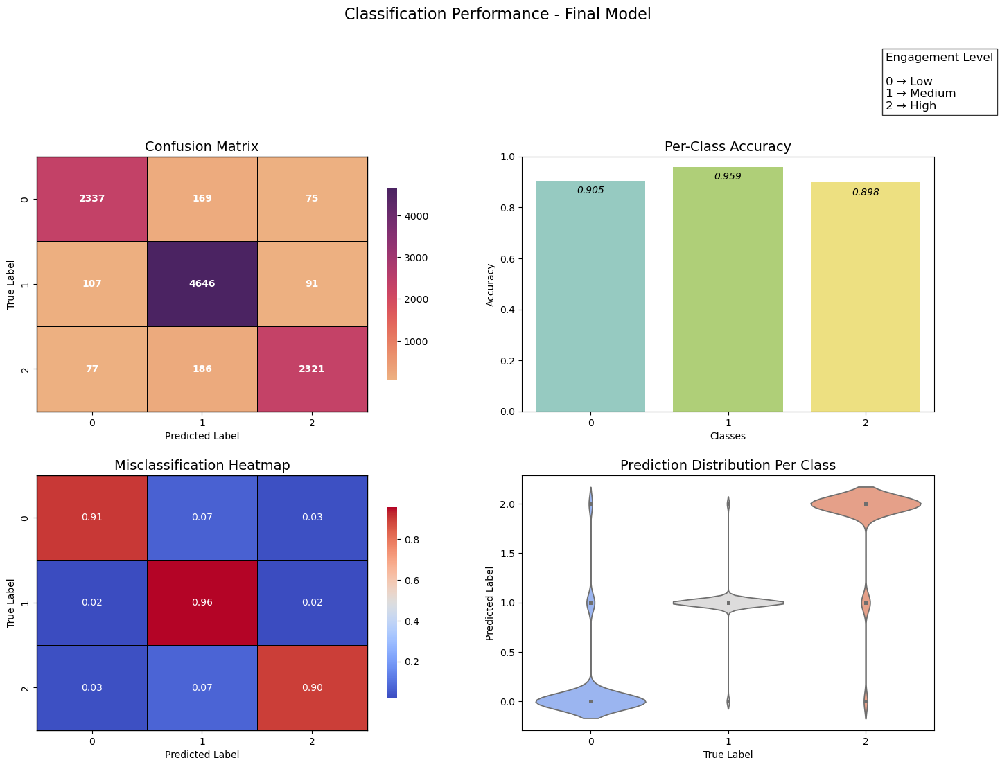

In [14]:
# Model Performance - Final
visualize_model_performance(y_test, y_pred_final, "Final Model")

## Summary of Plots showing Final Model Performance

#### Confusion Matrix:
- **Class 0 *(low)* :**
  - The model correctly classified *2337* *(**baseline** - 2327)* samples out of *2581* total samples.
  - The model incorrectly predicted *169* *(**baseline** - 180)* samples as *medium* and *75* *(**baseline** - 74)* samples as *high*.
- **Class 1 *(medium)* :**
  - The model correctly classified *4646* *(**baseline** - 4640)* samples out of *4844* total samples.
  - The model incorrectly predicted *107* *(**baseline** - 106)* samples as *low* and *91* *(**baseline** - 98)* samples as *high*.
- **Class 2 *(high)* :**
  - The model correctly classified *2321* *(**baseline** - 2322)* samples out of *2584* total samples.
  - The model incorrectly predicted *77* *(**baseline** - 77)* samples as *low* and *186* *(**baseline** - 185)* samples as *medium*.

#### Per-Class Accuracy:
- **Class 0 *(low)* : *(0.905)***
  - The model correctly classifies *90.5%* *(**baseline** - 90.2%)* of players with *low* Engagement.
- **Class 1 *(medium)* :*(0.959)***
  - The model correctly classifies *95.9%* *(**baseline** - 95.8%)* of players with *medium* Engagement.
- **Class 2 *(high)* :*(0.898)***
  - The model correctly classifies *89.8%* *(**baseline** - 89.9%)* of players with *high* Engagement.
 
#### Misclassification Heatmap:
- Here, the classification performance of Class 0 *(low)* is shown to be slightly better than baseline at 91% *(**baseline** - 90%)*, however the percentages of the other classes have remained the same as baseline.

#### Prediction Distribution Per Class:
- Across all three classes, similar trends as to the one observed with the baseline model can be observed here as well with no visually perceivable differences.

#### Comparison with Baseline Model:
- The final model performs slightly better than the baseline model in predicting Class 0 *(low)* & Class 1 *(medium)* samples.
- A minute decrease in prediction performance can be observed with classifying Class 2 *(high)* samples but the difference is negligible.
- Overall, the final model performs better than the baseline.

In [15]:
print("Unique predicted classes", np.unique(y_pred_final))

Unique predicted classes [0. 1. 2.]


In [16]:
# Compute SHAP Values
import shap

shap_values_path = 'data/shap_values.pkl'
dtest = xgb.DMatrix(X_test)

explainer = shap.TreeExplainer(final_model)

if os.path.exists(shap_values_path):
    print("Loading previously saved SHAP values...")
    with open(shap_values_path, 'rb') as file:
        shap_values = pickle.load(file)
else:
    print("Calculating new SHAP values...")
    # Generate SHAP values for the test set
    shap_values = explainer(dtest)

    # Save SHAP values
    with open(shap_values_path, 'wb') as file:
        pickle.dump(shap_values, file)
    print(f"\nSHAP values stored at {shap_values_path}")

Loading previously saved SHAP values...


In [17]:
# Inspect SHAP values

print(f"SHAP values type: {type(shap_values)}")
print(f"SHAP values shape: {shap_values.values.shape}")

SHAP values type: <class 'shap._explanation.Explanation'>
SHAP values shape: (10009, 17, 3)


In [19]:
# We have SHAP values all classes
# Let's split for each class
indices_high = np.where(y_test == 2)[0]
indices_medium = np.where(y_test == 1)[0]
indices_low = np.where(y_test == 0)[0]

shap_values_high = shap_values.values[indices_high, :, 2]
shap_values_medium = shap_values.values[indices_medium, :, 1]
shap_values_low = shap_values.values[indices_low, :, 0]

x_test_high = X_test[indices_high]
x_test_medium = X_test[indices_medium]
x_test_low = X_test[indices_low]

print(shap_values_high.shape, x_test_high.shape)
print(shap_values_medium.shape, x_test_medium.shape)
print(shap_values_low.shape, x_test_low.shape)

(2584, 17) (2584, 17)
(4844, 17) (4844, 17)
(2581, 17) (2581, 17)


In [20]:
short_column_names = {
    "Age": "Age",
    "Gender": "Gen",
    "InGamePurchases": "IGP",
    "GameDifficulty": "GDif",
    "SessionsPerWeek": "SesWk",
    "AvgSessionDurationMinutes": "ASMin",
    "PlayerLevel": "PyLvl",
    "AchievementsUnlocked": "AsUnl",
    "AvgPlayTimePerWeek": "APWk",
    "isAddicted": "Adctd",
    "Location_Europe": "LoEU",
    "Location_Other": "LoOTH",
    "Location_USA": "LoUSA",
    "Genre_RPG": "RPG",
    "Genre_Simulation": "Sim",
    "Genre_Sports": "Sport",
    "Genre_Strategy": "Strat"
}

# Function to generate legend using abbreviations for SHAP plots
def show_custom_legend(short_column_names, class_label):
    fig, ax = plt.subplots(figsize=(12, 1))
    ax.axis("off")
    fig.suptitle(f'SHAP Force Plots for {"High" if class_label==2 else "Low"} Predictions', fontsize=16, x=0.525, y=4)

    legend_text = [f"{short_name} – {full_name}" for full_name, short_name in short_column_names.items()]
    
    ax.text(0.99, 0.5, "\n".join(legend_text), ha="right", fontsize=10, fontweight="bold")
    plt.subplots_adjust(right=1.0)
    plt.show()

# Function to create SHAP force plots
def create_force_plot(explainer, shap_values, x_test, idx, class_label, feature_names):
    shap_values_array = np.round(np.array(shap_values[idx]), 2)
    feature_values = np.round(x_test[idx], 2)

    shap.force_plot(
        explainer.expected_value[class_label], 
        shap_values_array,  
        feature_values,
        feature_names=[short_column_names.get(col, col) for col in feature_names],
        text_rotation=15,
        matplotlib=True,
        show=False
    )
    
    plt.grid(False)
    plt.gca().set_axisbelow(True)
    plt.show()

# Function to generate SHAP force plots for correctly classified samples
def generate_force_plots(explainer, shap_values, x_test, short_column_names, feature_names, num_samples=3, class_label=2):
    show_custom_legend(short_column_names, class_label)

    for idx in range(num_samples):
        create_force_plot(explainer, shap_values, x_test, idx, class_label, feature_names)

def generate_summary_plot(shap_values, x_test, class_label):
    plt.title(f'Feature Importance for {"High" if class_label==2 else "Low"} Predictions', fontsize=14)
    if isinstance(x_test, np.ndarray):
        x_test = pd.DataFrame(x_test, columns=short_column_names.keys())
    
    shap.summary_plot(shap_values, x_test, plot_type="bar", show=True, max_display=10)

def generate_dependence_plots(shap_values, x_test, y_test, y_pred, feature_names, class_label):
    x_test = scaler.inverse_transform(x_test)
    
    if isinstance(x_test, np.ndarray):
        x_test = pd.DataFrame(x_test, columns=feature_names)
    
    # Compute the mean absolute SHAP values to determine feature importance
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    top_features = x_test.columns[np.argsort(mean_abs_shap)[::-1]]  

    most_important_feature = top_features[0]  
    other_top_features = top_features[1:9]    

    fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(16, 24))
    plt.subplots_adjust(hspace=0.8, wspace=0.7)  

    fig.suptitle(f'SHAP Dependence Plots for {"High" if class_label==2 else "Low"} Predictions - {most_important_feature} vs Other Features', fontsize=18)

    for idx, feature in enumerate(other_top_features):
        row_idx = idx // 2
        col_idx = idx % 2
    
        shap.dependence_plot(feature, shap_values, x_test, interaction_index=most_important_feature, ax=axs[row_idx, col_idx], show=False)
    
    fig.delaxes(axs[4, 0])
    fig.delaxes(axs[4, 1])
    plt.tight_layout(rect=[0, 0, 1, 1], pad=3.0)
    plt.show()

feature_names = df.drop(columns=["EngagementLevel", "PlayerID"]).columns.to_list()

## Analyze Features Driving “High” predictions for EngagementLevel

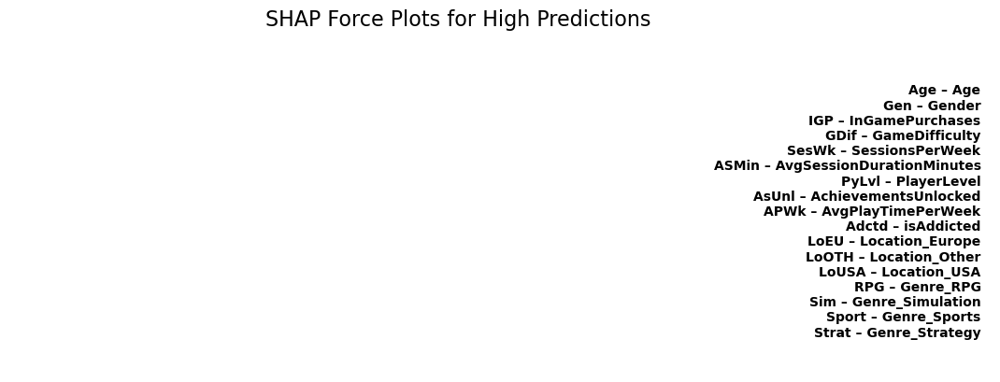

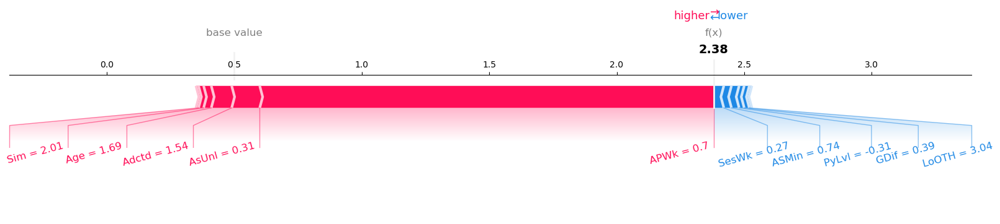

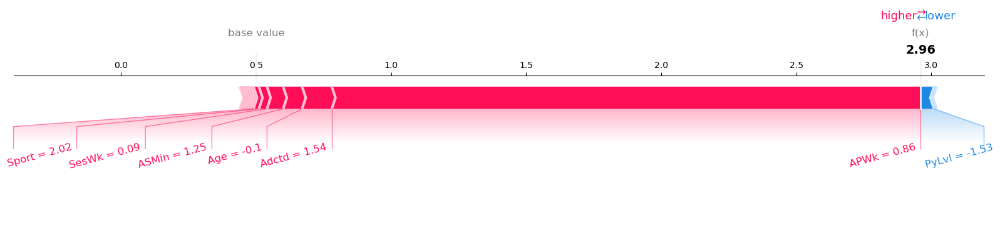

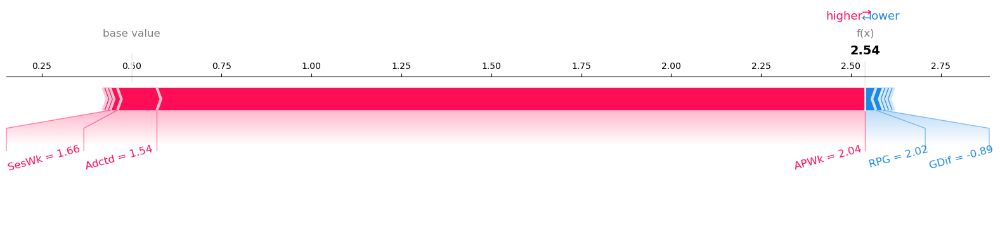

In [21]:
generate_force_plots(explainer, shap_values_high, x_test_high, short_column_names, feature_names, num_samples=3, class_label=2)

## Interpretation of SHAP Force plots for High Predictions

#### Plot-1 *(f(x)=2.38)*:
- The **f(x)** value, i.e., the model's prediction for the the first sample is *2.38*.
- The feature *Location_Other* seems to make the highest positive contribution (*3.04*) to f(x), followed by *Genre_Simulation*, *Age*, *isAddicted*, *AvgSessionDurationMinutes*, *AvgPlayTimePerWeek*, *GameDifficulty*, *AchievementsUnlocked* and *SessionsPerWeek*.
- The feature *PlayerLevel (-0.31)* is the only feature that contributes negatively to the prediction, pushing it closer to the base value just a little.
- Overall, as indicated by the red and blue colors, relative to the dataset distribution, higher feature values of *AvgPlayTimePerWeek*, *AchievementsUnlocked*, *isAddicted*,  *Age*, & *Genre_Simulation* and lower feature values of *SessionsPerWeek*, *AvgSessionDurationMinutes*, *PlayerLevel*, *GameDifficulty*, and *Location_Other* caused this sample to be predicted **high**.

#### Plot-2 *(f(x)=2.96)*:
- The model prediction for the data sample represented by the 2nd force plot is *2.96*, which is the highest among the three samples.
- *Genre_Sports* leads the contribution ranking with a value of *2.02*, followed by *isAddicted*, *AvgSessionDurationMinutes*, *AvgPlayTimePerWeek*, and *SessionsPerWeek*.
- Similar to prior sample, *PlayerLevel (-1.53)* contributes the most negatively against model prediction with *Age* slightly adding to it as well.
- Relative to the dataset distribution, higher feature values of *AvgPlayTimePerWeek*, *isAddicted*,  *Age*, *AvgSessionDurationMinutes*, *SessionsPerWeek*, & *Genre_Sports* and lower feature values of *PlayerLevel* caused this sample to be predicted **high**.

#### Plot-3 *(f(x)=2.54)*:
- Model prediction value, **f(x)** for the last plot is *2.54*.
- The most important feature this time is *AvgPlayTimePerWeek (2.04)*, closely followed by *Genre_RPG (2.02)*, *SessionPerWeek* and *isAddicted*.
- *GameDifficulty (-0.89)* is the sole feature pushing the prediction towards baseline.
- Thus, relative to the dataset distribution, higher feature values of *AvgPlayTimePerWeek*, *isAddicted*, & *SessionsPerWeek* and lower feature values of *Genre_RPG* & *GameDifficulty* caused this sample to be predicted **high**.

### Conclusion from the plots:
#### Positive Contribution to High Engagement:
- **Observation:** Across all three plots, the following features consistently contributed positively, pushing the prediction towards a high engagement level:
  - **isAddicted** *(f(x) contribution: 1.54 across all three)*
  - **AvgPlayTimePerWeek** *(f(x) contribution: 2.04, 0.86, 0.7)*
  - **Genre_Type (Genre_Simulation, Genre_Sports)** *(f(x) contribution: 2.01, 2.02)*
- **Interpretation:** This suggests the following players are most likely to be highly engaged:
  - Players who are addicted
  - Players with a higher than average play time per week
  - Players who play Simulation and Sports games
- **Recommendation:**
  - Game companies may aim to get their player base addicted to their games by implementing a dopaminergic reward system that consistently provides positive reinforcement for players who play their games for longer.
  - Game companies may aim to identify what components in any given genre type makes players play for longer, i.e., gets them addicted to the game and replicate these traits in their games, or try & integrate them seamlessly into other genres. 
#### Negative Contribution to High Engagement:
- **Observation:** Similarly, these features consistently contributed negatively, pushing the prediction towards baseline, i.e., relative to the dataset, lower than average values of these features resulted in a prediction of a **high** engagement level:
  - **PlayerLevel** *(f(x) contribution: -0.31, -1.53 across plots 1 & 2)*
  - **GameDifficulty** *(f(x) contribution: 0.39, -0.89 across plots 1 & 3)*
- **Interpretation:** This suggests the following players are less likely to be highly engaged:
  - Players who have reached a certain threshold level, after which point, engagement peaks and higher levels offer diminishing returns.
  - Players who play harder games are more prone to losing engagement.
- **Recommendation:**
  - It may be worth monitoring the engagement drop-off of high-level players, identify what factors are causing them to lose engagement, and tweak/minimize those factors.
  - Game companies may aim to tweak the difficulty of their games such that even the hardest difficulties feel fair, because players likely lose engagement when they believe the game to be unfair but players may accept, and even enjoy a tough-but-fair experience.

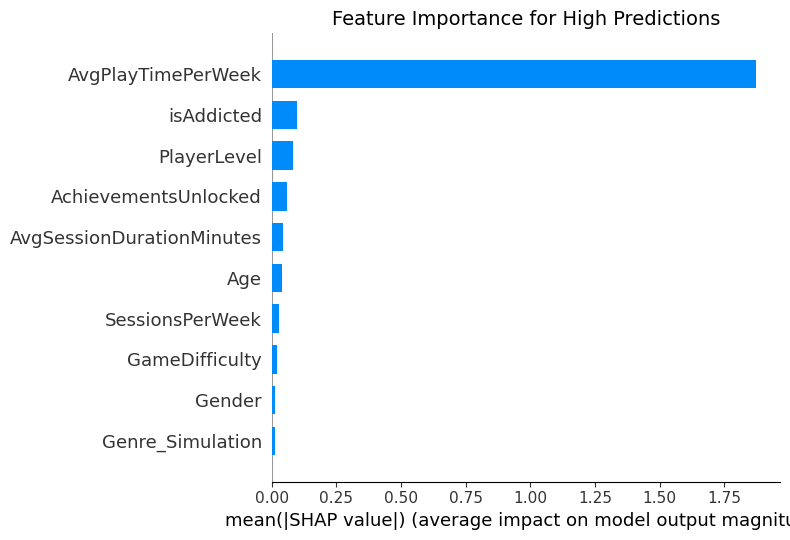

In [22]:
generate_summary_plot(shap_values_high, x_test_high, class_label=2)

## Interpretation of SHAP Summary Plot for High Predictions

#### Most important feature: *AvgPlayTimePerWeek*
- *AvgPlayTimePerWeek* easily has the highest impact on *high* prediction compared to every other feature.
- This suggests that the amount of time a player spends per week playing videogames is single-handedly the most influential factor in determining *high* engagement levels.

#### 2nd Most important feature: *isAddicted*
- Players who are addicted to their games can also influence *high* engagement predictions strongly.
- This observation aligns with the pattern found in the force plots where *isAddicted* consistently demonstrated a positive contribution towards a *high* prediction.

#### Less important but Noticable features: *PlayerLevel*, *AchievementsUnlocked*, & *AvgSessionDurationMinutes*
- These features have much less impact on model output than *AvgPlayTimePerWeek*, however they still do contribute to the prediction of *high* engagement.
- This suggest that players who,
  - engage in the leveling system of the game that they play
  - unlock achievements in the games they play
  - spend more time on games they play<br>
are  more likely to be highly engaged

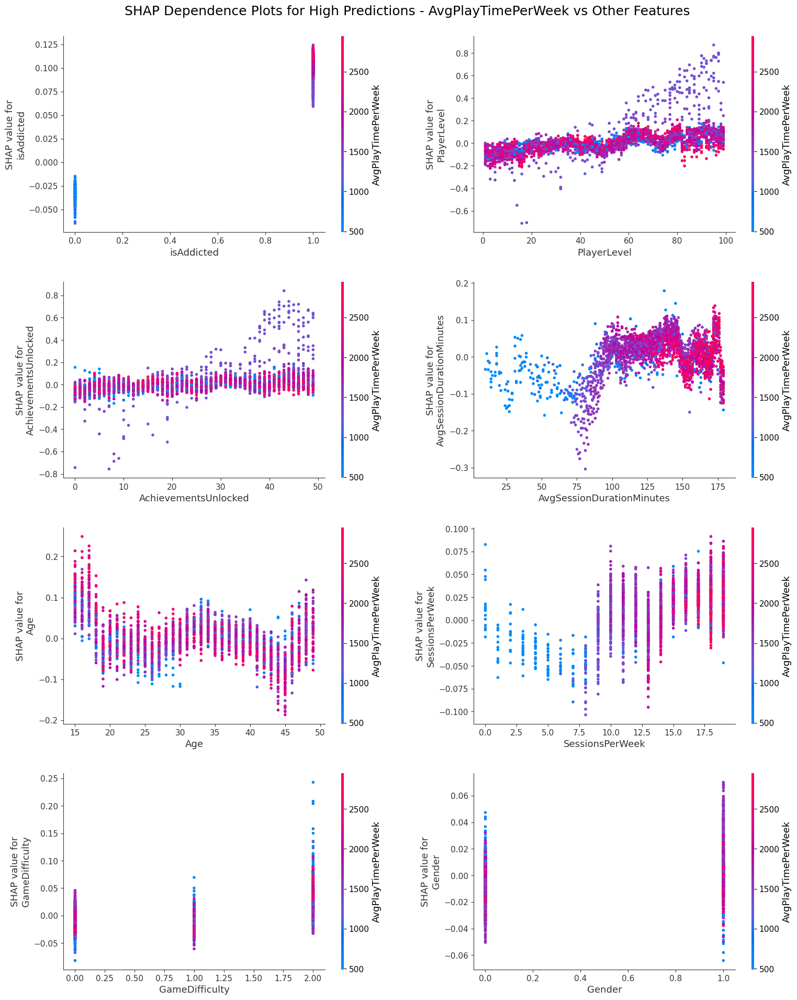

In [23]:
generate_dependence_plots(shap_values_high, x_test_high, y_test, y_pred_final, feature_names, class_label=2)

## Interpretation of SHAP Dependence Plots for High Predicitons - AvgPlayTimePerWeek vs Other features

#### AvgPlayTimePerWeek vs isAddicted:
- **Observation:**
  - It can be observed that both the feature value (F) and the SHAP values (S) for *isAddicted* are low *(F:0, S:~(-0.050)-(-0.0125))* when the *AvgPlayTimePerWeek* values are low *~(500-1250)*
  - We can also see that when *AvgPlayTimePerWeek* values are high *~(1500-2500+)*, the feature value (F) and SHAP values (S) of *isAddicted* are high *(F:1, S:~(0.050)-(0.125))*.
- **Interpretation:**
  - It is evident that players with high average play time per week are highly likely to be classified as addicted.
  - This suggests a strong positive correlation between player addiction and average playtime per week, and consequently with higher engagement as AvgPlayTimePerWeek is the most impactful feature for high engagement.
  - Thus, addicted players *(isAddicted = 1)* are highly likely to contribute positively to high engagement predictions, while non-addicted players *(isAddicted = 0)* generally contribute negatively to high engagement.
  - So we can conclude that high engagement predictions are largely driven by addicted players who play frequently.

#### AvgPlayTimePerWeek vs PlayerLevel:
- **Observation:**
  - There's a slight upward trend in the curve for SHAP values as we move from left to right in the plot with many outliers with higher levels having high SHAP values, indicating that as PlayLevel increases, the SHAP values tend to increase as well which suggests that generally, higher player levels contribute more positively to high engagement predictions.
  - There is a higher concentration of red dots *(AvgPlayTimePerWeek - 2500+)* and violet dots *(AvgPlayTimePerWeek - 1500+)* in the higher levels *(60 - 100)*, indicating that higher level players usually spend more time *(1500+ minutes)* playing videogames per week.
- **Interpretation:**
  - Both higher average play time per week and higher SHAP values are more common among higher-level players indicating a positive correlation between higher *PlayerLevel* and engagement.
  - This suggests that dedicated, high-level players who spend more time playing are key drivers of high engagement predictions.

#### AvgPlayTimePerWeek vs AchievementsUnlocked:
- **Observation:**
  - As *AchievementsUnlocked* increases, it can be observed that the SHAP values also increase, albeit slightly for a majority of the samples around 0, with a small contingent exhibiting much higher SHAP values.
  - Similar to *PlayerLevel*, we also notice much higher concentrations of red and violet dots among higher counts of achievements unlocked *(30 - 50)*.
- **Interpretation:**
  - *AchievementsUnlocked* has a positive impact on engagement, especially beyond 20 achievements, with a direct correlation between higher counts and higher *AvgPlayTimePerWeek (1500+ minutes)*.
  - The interaction suggests that unlocking achievements is both a consequence and a driver of high engagement, making it useful in predicting player behavior.

#### AvgPlayTimePerWeek vs AvgSessionDurationMinutes:
- **Observation:**
  - The SHAP values for lower durations are mostly below zero, while the higher duration ranges *(100 - 175 minutes)* are mostly around or above zero, indicating higher *AvgSessionDurationMinutes* impacts the model's predictions more.
  - The majority of the points are clustered in the *(75 to 175 minutes)* range, with the violet and red dots increasing drastically, with higher averages, indicating a one-to-one correlation between *AvgSessionDurationMinutes* and *AvgPlayTimePerWeek*.
- **Interpretation:**
  - Short session durations negatively contribute towards high engagement predictions, while longer durations enhance them , particularly when combined with higher average play times per week.
  - Therefore, players who on average, play for the most amount of time, both on a session-basis and on a weekly-basis tend to be the most engaged.  

#### AvgPlayTimePerWeek vs Age:
- **Observation:**
  - The SHAP values follow a wave-like pattern with peaks around ages *(15-20)*, *(30-35)*, *(45-50)* suggesting that some age groups have a more discernable impact on the model's predictions.
  - The *AvgPlayTimePerWeek* is higher (violet and red dots) for higher SHAP values across all ages and is more noticably higher for those ages where SHAP values peak.
- **Interpretation:**
  - This suggests that certain age groups are more likely to contribute to higher engagement predictions while other age groups result in lower engagement.
  - However, across all ages, the players who play the most in a week, are the ones who are most likely to be highly engaged. 

#### AvgPlayTimePerWeek vs SessionsPerWeek:
- **Observation:**
  - The sessions per week that are low *(0 - 7.5 sessions)* consistently exhibit lower SHAP values that are below 0 and negative while higher no. of sessions *(10 - 17.5 sessions)* exhibit SHAP values above 0.
  - Almost all the samples with higher number of sessions are overwhelmingly violet or red dots, meaning *SessionsPerWeek* also has a one-to-one correlation with *AvgPlayTimePerWeek*.
- **Interpretation:**
  - It is evident that higher number of sessions per week are a clear predictor of high engagement while the lack there of leads to model to not predict a high engagement.
  - Additionally, from the relationship between *AvgPlayTimePerWeek* and *SessionsPerWeek*, we can conclude that players who engage in the most number of sessions per week while also playing for longer times in a week are highly engaged.

#### AvgPlayTimePerWeek vs GameDifficulty:
- **Observation:**
  - The *GameDifficulty* of *low (0)* and *medium (1)* have most of their SHAP values under 0 while most *high (2)* difficulty samples exhibit higher SHAP values above 0.
  - When the GameDifficulty is *low*, the *AvgPlayTimePerWeek* is *high* for those samples that contribute to high engagement, however for *medium* and *high* difficulty levels, while a cluster of samples with SHAP values greater than 0 do have high *AvgPlayTimePerWeek* values (red & violet dots), the samples with the highest SHAP values have low *AvgPlayTimePerWeek* (blue dots).
- **Interpretation:**
  - Progressively higher *GameDifficulty* modes (*medium* and *high*) seem to correlate positively with higher engagement prediction by the model.
  - This combined with the trends noticed with *AvgPlayTimePerWeek*, it can be observed that players who play for longer on lower difficulty modes and the players who play for less time on higher difficulty modes are the groups most likely to be highly engaged.
     
#### AvgPlayTimePerWeek vs Gender:
- **Observation:**
  - The *Gender* of *1 (Female)* exhibit higher SHAP values than *0 (Male)* for higher engagement.
  - The samples with high SHAP values for *Male* are colored blue *(AvgPlayTimePerWeek < 1000)* while those values for *Female* are violet *(AvgPlayTimePerWeek:1500-2000)* 
- **Interpretation:**
  - Female players, generally speaking are more likely to be highly engaged compared to Male.
  - Male players are likely to be highly engaged when they play for lesser time per week while Female players tend to be more engaged when they play for longer.

## Analyze Features Driving “Low” predictions for EngagementLevel

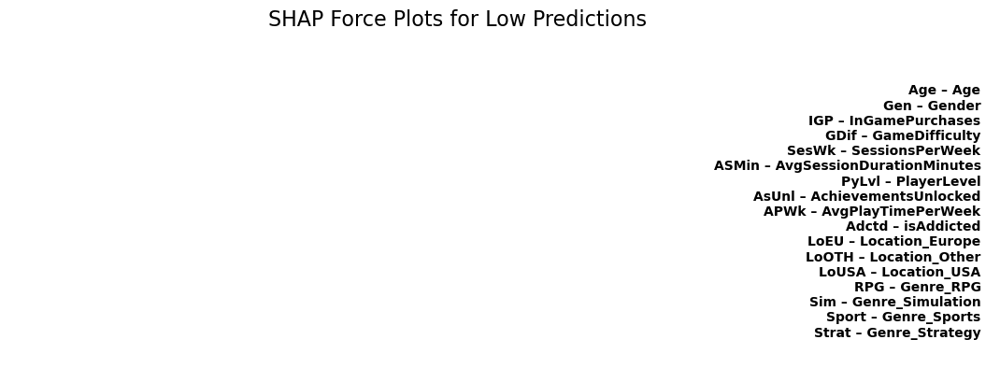

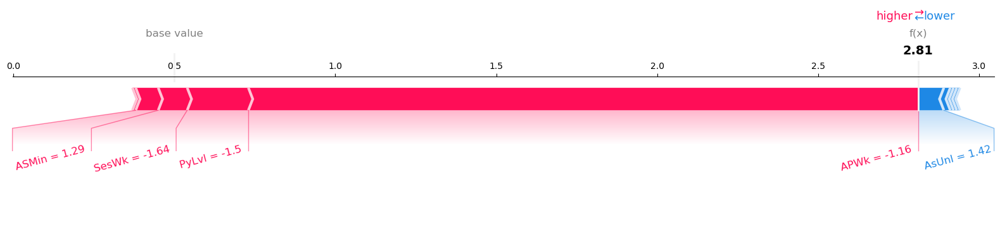

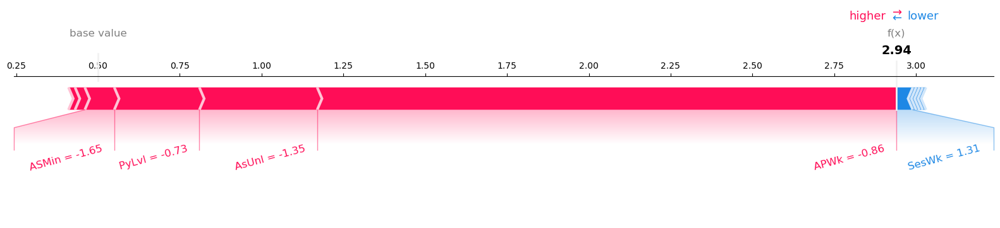

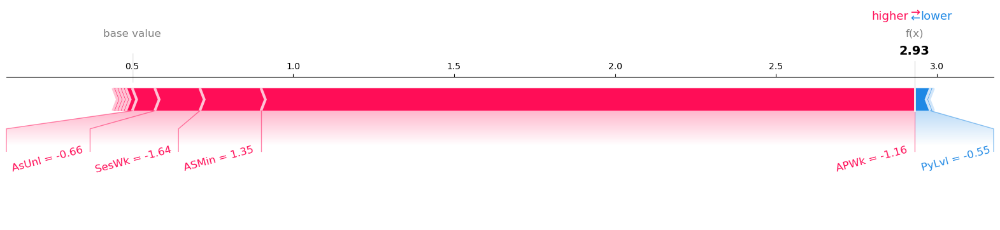

In [25]:
generate_force_plots(explainer, shap_values_low, x_test_low, short_column_names, feature_names, num_samples=3, class_label=0)

## Interpretation of SHAP Force plots for Low Predictions

#### Plot-1 *(f(x)=2.81)*:
- The **f(x)** value, i.e., the model's prediction for the the first sample is *2.81*.
- The feature *AchievementsUnlocked* seems to make the highest positive contribution *(1.42)* to f(x), followed by *AvgSessionDurationMinutes*.
- The features *SessionsPerWeek*, *PlayerLevel*, and *AvgPlayTimePerWeek* contribute negatively to the prediction, pushing it closer to the base value.
- Overall, as indicated by the red and blue colors, relative to the dataset distribution, higher feature values of *AvgPlayTimePerWeek*, *AchievementsUnlocked*, *PlayerLevel*, *SessionsPerWeek*, & *AvgSessionDurationMinutes* and lower feature values of  caused this sample to be predicted **low**

#### Plot-2 *(f(x)=2.94)*:
- The model prediction for the data sample represented by the 2nd force plot is *2.94*, which is the highest among the three samples.
- *SessionsPerWeek* seems to be the only feature contributing positively toward f(x) with a value of *1.31*
- The features *AvgSessionDurationMinutes*, *AchievementsUnlocked*, *AvgPlayTimePerWeek*, & *PlayerLevel* all contribute negatively against the model prediction.
- Relative to the dataset distribution, higher feature values of *AvgPlayTimePerWeek*, *AchievementsUnlocked*, *PlayerLevel* & *AvgSessionDurationMinutes* and lower feature values of *SessionsPerWeek* caused this sample to be predicted **low**.

#### Plot-3 *(f(x)=2.93)*:
- Model prediction value, **f(x)** for the last plot is *2.93*.
- The only positively contributing feature is *AvgSessionDurationMinutes (1.35)*.
- The features *SessionsPerWeek*, *AvgPlayTimePerWeek*, *AchievementsUnlocked*, & *PlayerLevel* are all pushing the prediction towards baseline.
- Thus, relative to the dataset distribution, higher feature values of *AvgPlayTimePerWeek*, *AvgSessionDurationMinutes*, *SessionsPerWeek*, & *AchievementsUnlocked* and lower feature values of *PlayerLevel* caused this sample to be predicted **low**.

### Conclusion from the plots:
#### Positive Contribution to Low Engagement:
- **Observation:** Across all three plots, the following features consistently contributed positively, pushing the prediction towards a **low** engagement level:
  - **AvgSessionDurationMinutes** *(f(x) contribution: 1.29, 1.35 across plots 1 & 3)*
- **Interpretation:**
  - This suggests that the players who play for more time on average during gaming sessions are more likely to have a low engagement.
- **Recommendation:**
  - Game companies may aim to identify the factors leading to low engagement across long time frames of gaming and tweak their games to minimize those factors.
#### Negative Contribution to Low Engagement:
- **Observation:** Similarly, these features consistently contributed negatively, pushing the prediction towards baseline, i.e., relative to the dataset, lower than average values of these features resulted in a prediction of a **low** engagement level:
  - **SessionsPerWeek** *(f(x) contribution: -1.64, -1.5 across plots 1 & 3)*
  - **PlayerLevel** *(f(x) contribution: -1.5, -0.73, -0.55)*
  - **AchievementsUnlocked** *(f(x) contribution: -1.35, -0.66 across plots 2 & 3)*
- **Interpretation:** This suggests the following players are less likely to have a low engagement:
  - Players who are engaged in more number of sessions per week
  - Players who are leveling up consistently and have reached an average to above-average level
  - Players who have unlocked average to an high count of achievements
- **Recommendation:**
  - Game companies may aim to maximize the number of sessions their player-base engage in per week using progression systems and reward mechanisms such as daily quests, weekly challenges, and so on with unique rewards each day to incentivize players.
  - Effective progression systems that feel rewarding while also being tough but fair could be employed by Game companies to encourage players to engage in the leveling system.
  - Tying unique and rewarding achievements with the aforementioned mechanisms could increase the odds of higher engagement for players.

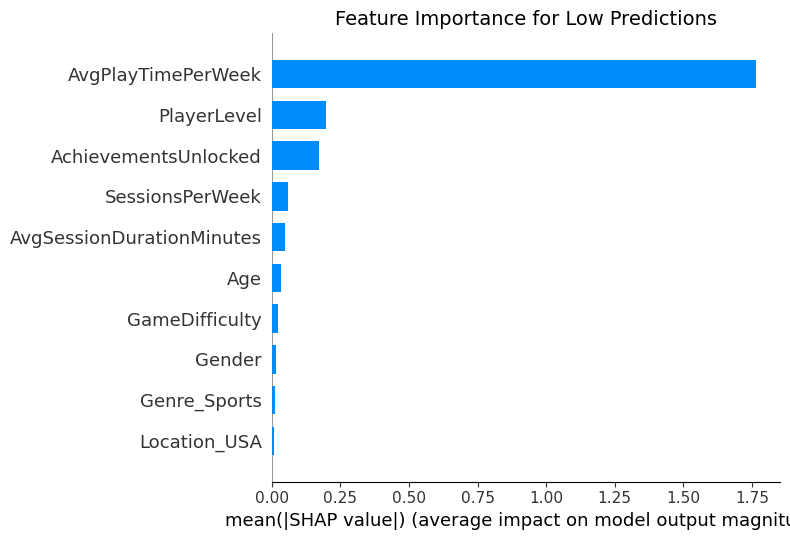

In [26]:
generate_summary_plot(shap_values_low, x_test_low, 0)

## Interpretation of SHAP Summary Plot for Low Predictions

#### Most important feature: *AvgPlayTimePerWeek*
- *AvgPlayTimePerWeek* easily has the highest impact on *low* prediction compared to every other feature.
- This suggests that the amount of time a player spends per week playing videogames is single-handedly the most influential factor in determining *low* engagement levels as well.

#### 2nd Most important feature: *PlayerLevel*
- Players' levels in the games that they play can influence *low* engagement predictions strongly.
- This observation aligns with the pattern found in the force plots where *PlayerLevel* consistently demonstrated a negative contribution towards a *low* prediction, indicating that lower player levels are a strong indicator of low engagement.

#### Less important but Noticable features: *AchievementsUnlocked*, *SessionsPerWeek*, *AvgSessionDurationMinutes*
- These features have much less impact on model output than *AvgPlayTimePerWeek*, however they still do contribute to the prediction of *low* engagement.
- This suggests that players who,
  - unlock lower number of achievements in the games they play
  - play less frequently
  - spend more time playing each session<br>
are  more likely to have a low engagement.

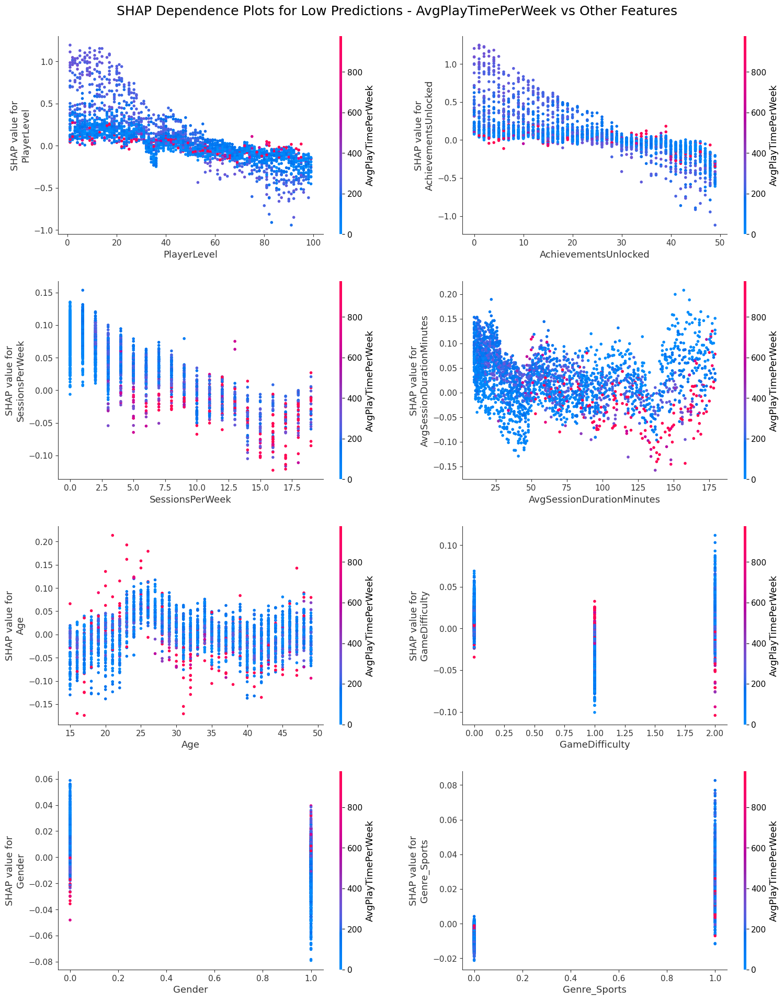

In [27]:
generate_dependence_plots(shap_values_low, x_test_low, y_test, y_pred_final, feature_names, class_label=0)

## Interpretation of SHAP Dependence Plots for Low Predicitons - AvgPlayTimePerWeek vs Other features

#### AvgPlayTimePerWeek vs PlayerLevel:
- **Observation:**
  - There is an observable drop from positive to negative in the pattern of the distribution of SHAP values as the *PlayerLevel* increases.
  - The *PlayerLevel* samples with the highest SHAP values are colored violet *(AvgPlayTimePerWeek: ~(300-500))* while the ones with lower SHAP are overwhelmingly blue *(AvgPlayTimePerWeek < 200)*  with some red dots *(AvgPlayTimePerWeek: 800+)* clustered around a SHAP of zero
- **Interpretation:**
  - It is evident that a lower level is indicative of a *low* engagement prediction by the model while higher levels reduce the likelihood of a low prediction.
  - From the colors of the samples with the highest SHAP values (violet for lower player levels), we can conclude that players who fail to level up despite spending more time playing the game in a given week are the most likely to have a *low* engagement. 

#### AvgPlayTimePerWeek vs AchievementsUnlocked:
- **Observation:**
  - We see a pattern that's quite similar to *PlayerLevel*, the SHAP values drop as the count of *AchievementsUnlocked* go up.
  - Similarly, the high SHAP sample dots are violet *(AvgPlayTimePerWeek: ~(300-500))* while some red dots *(AvgPlayTimePerWeek > 800)* can be spotted around 0, with majority being blue dots *(AvgPlayTimePerWeek < 200)*.
- **Interpretation:**
  - A lower count of achievements unlocked by players is interpreted as *low* engagement by the model while the opposite is true for higher counts.
  - Again, low counts with high SHAP exhibit violet colors, therefore players who fail to unlock more achievements despite spending more time playing the game in a given week are the most likely to have a *low* engagement.

#### AvgPlayTimePerWeek vs SessionsPerWeek:
- **Observation:**
  - The SHAP values are higher for lower number of sessions per week while they get progressively lower for higher number of sessions
  - The highest SHAP values, i.e., of low *SessionsPerWeek* seem to have a low *AvgPlayTimePerWeek (< 400)*, as shown by their blue and pale violet dots while the red dots *(AvgPlayTimePerWeek: 800+)* seem to be concentrated around higher number of sessions per week with low SHAP.
- **Interpretation:**
  - The lower the number of sessions played per week by a player, higher the chances of the model predicting a *low* engagement and vice-versa.
  - Based on the hue of the high SHAP samples (blue), we can conclude that players who engage in lower number of sessions per week for a shorter overall play time are the most likely to have a *low* engagement.

#### AvgPlayTimePerWeek vs AvgSessionDurationMinutes:
- **Observation:**
  - The SHAP values that are high seem to be clustered around both lower ranges *(< 25 minutes)* and higher ranges *~(150-200 minutes)* of *AvgSessionDurationMinutes*.
  - The colors of these values are disproportionately blue *(AvgPlayTimePerWeek < 200)* and the red dots *(AvgPlayTimePerWeek: 800+)* are scattered across the durations with few having relatively higher shap but these are mostly outliers, not clusters 
- **Interpretation:**
  - Both the players who play for longer on average per session but lesser on a weekly basis, and the ones who play for less time on average both per session & on a weekly basis have high chances of being predicted to have a *low* engagement.
  - These could be players who do not play the game much and so their engagement is *low* or they could be players who do try to play the game for longer in one session but ultimately stop after that one, dropping their engagement.

#### AvgPlayTimePerWeek vs Age:
- **Observation:**
  - The curve appears to be jagged, with the higher SHAP samples emerging in the *Age* range *~(23-27)* while the other age ranges are largely in the negative with some outliers reaching a SHAP of *0.05*.
  - While the samples between the aforementioned range do have relatively high SHAP with blue dots *(AvgPlayTimePerWeek < 200)*, the highest SHAP are all red dots *(AvgPlayTimePerWeek: 800+)*.
- **Interpretation:**
  - This pattern suggests that across all age groups, there are outliers who have a high chance of being predicted as *low*.
  - However, the age range *~(23-27)* seem to have higher chances relative to all other age groups.
  - The red hues *(AvgPlayTimePerWeek > 800)* of the highest SHAP outliers in the age range *~(20-27)* suggest that the players in this range who play for the most time in any given week are the most likely to have a *low* engagement.

#### AvgPlayTimePerWeek vs GameDifficulty:
- **Observation:**
  - The *medium* difficulty samples are largely negative with some positive outliers when it comes to SHAP, *low* samples are mostly higher and positive, but the highest SHAP samples belong to *high* difficulty which seems to have the most number of positive SHAP samples as well.
  - Across both *low* and *high* difficulty, the highest SHAP values seem to be colored blue *(AvgPlayTimePerWeek: 200-)* while the lower points of these difficulty modes are colored red *(AvgPlayTimePerWeek > 800)*. The opposite pattern can be observed with the *medium* difficulty.
- **Interpretation:**
  - This pattern of the samples across the difficulty modes suggests that the players who play on *high* difficulty are the most likely to be predicted to have a *low* engagement, followed by the ones who play on *low* difficulty, and the least likely are the ones who play on *medium*.
  - For the players who play on *medium* difficulty, the ones who play for longer average duration per week *(AvgPlayTimePerWeek > 800)* are most likely to have a *low* engagement.
  - For the players who play on *low* & *high* difficulties, the ones who play for lesser average duration per week *(AvgPlayTimePerWeek < 200)* are most likely to have a *low* engagement.

#### AvgPlayTimePerWeek vs Gender:
- **Observation:**
  - Across both genders, males *(0)* have higher SHAP with most in the category being positive and females *(1)* largely have negative SHAP.
  - Interestingly, male samples with lower SHAP and female samples with higher SHAP are red dots *(AvgPlayTimePerWeek > 800)* while male samples with higher SHAP and female samples with lower SHAP *(AvgPlayTimePerWeek < 200)*.
- **Interpretation:**
  - Generally, males are more likely to be predicted by the model as having a *low* engagement, while females are less likely.
  - Judging from the colors of the samples, males who play games for lesser duration per week and females who play for longer in a week are the most likely to have a *low* engagement.

 #### AvgPlayTimePerWeek vs Genre_Sports:
- **Observation:**
  - The players who do not play sports games *(Genre_Sports = 0)* largely have negative SHAP with a few above 0, while the ones who play sports games *(Genre_Sports = 1)* have overwhelmingly positive SHAP values.
  - The higher SHAP values for player samples who play sports games are all blue *(AvgPlayTimePerWeek < 200)* while the red dots *(AvgPlayTimePerWeek: 800+)* are closer to 0 and for those who don't, their higher SHAP samples (closer to 0) are red and lower ones are blue.
- **Interpretation:**
  - A player playing sports games seems to be a high predictor of *low* engagement by the model.
  - Among those that play sports games, the ones who engage in gaming for lesser time in a given week are the most likely to have a *low* engagement. 

## Compare Features Across "High" and "Low" Predictions

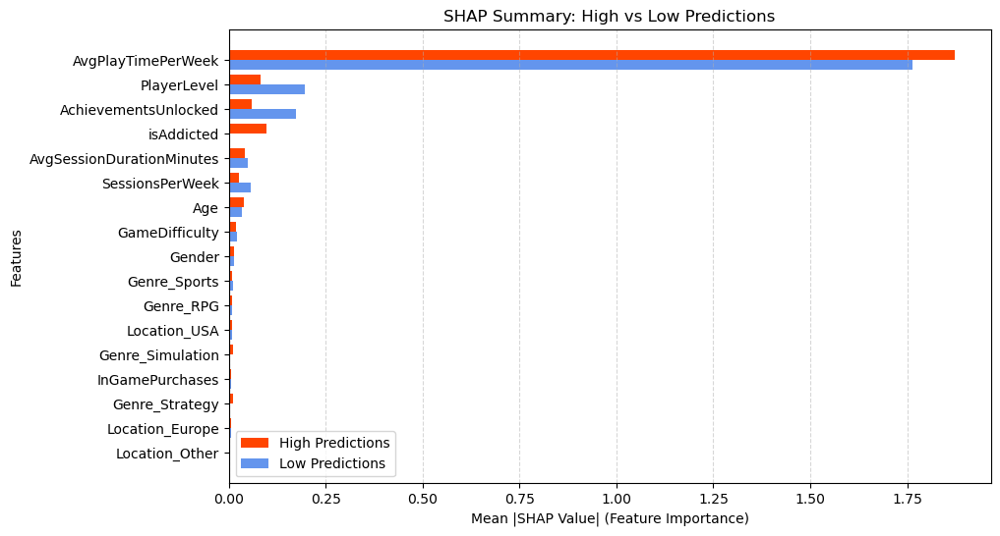

In [28]:
plt.figure(figsize=(10, 6))

mean_abs_shap_high = np.abs(shap_values_high).mean(axis=0)
mean_abs_shap_low = np.abs(shap_values_low).mean(axis=0)

combined_shap = mean_abs_shap_high + mean_abs_shap_low
sorted_indices = np.argsort(combined_shap)[::-1]

sorted_features = [feature_names[i] for i in sorted_indices]
sorted_shap_high = mean_abs_shap_high[sorted_indices]
sorted_shap_low = mean_abs_shap_low[sorted_indices]

bar_width = 0.4
x_pos = np.arange(len(sorted_features))

plt.barh(x_pos - bar_width/2, sorted_shap_high, height=bar_width, color="orangered", label="High Predictions")
plt.barh(x_pos + bar_width/2, sorted_shap_low, height=bar_width, color="cornflowerblue", label="Low Predictions")

plt.xlabel("Mean |SHAP Value| (Feature Importance)")
plt.ylabel("Features")
plt.title("SHAP Summary: High vs Low Predictions")
plt.yticks(x_pos, sorted_features)
plt.legend()
plt.gca().invert_yaxis()
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

## SHAP Summary Plot - High vs Low Predictions

#### AvgPlayTimePerWeek - Most important feature
- **Observation:**
  - Across both *high* and *low* predictions, this feature has the highest importance in determining the model's prediction.
  - However, it is slightly more important for *high* than it is for *low* predictions (orange bar).
- **Interpretation:**
  - This means that total playtime of a player significantly impacts whether the player is classified as high or low engagement.
  - Since its important for both classes, it suggests that it differentiates engagement levels effectively by itself.

#### PlayerLevel & AchievementsUnlocked - Most important feature for Low predictions
- **Observation:**
  - While the orange bar is noticable for these features, their blue bars are much larger in comparison.
  - This means that these features are more important for *low* predictions than they are for *high* predictions.
- **Interpretation:**
  - This suggests that certain player levels and certain number of achievements unlocked have a stronger influence on *low* engagement predictions.
  - These could be lower levels and achievement counts that results in the players not becoming sufficiently engaged.

#### isAddicted - Conclusively only important for High predictions
- **Observation:**
  - The orange bar while not the largest, still exists suggesting some importance for *high* predictions.
  - However, the blue bar is non-existent, meaning this feature does not contribute at all toward *low* predictions.
- **Interpretation:**
  - This confirms that the *isAddicted* feature is solely important for *high* predictions and has no impact on *low* predictions.
 
#### Conclusion
- The goal of this analysis is to find out the features that result in *high* engagement and understand those features better to offer suggestions to potentially maximize them.
- It is evident that other than *AvgPlayTimePerWeek*, isAddicted is the only feature that strongly favors *high* engagement predictions.
- It could be worthwhile to understand how *isAddicted* interacts with other features of the dataset.

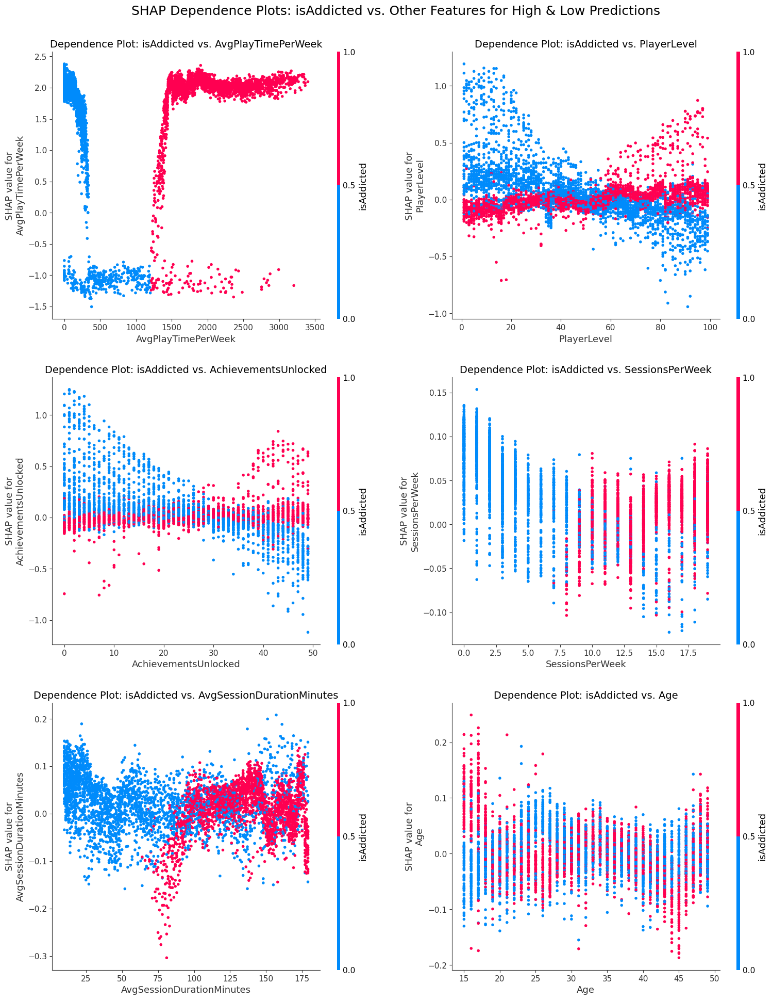

In [29]:
def visualize_isAddicted_interactions(shap_values_high, shap_values_low, x_test_high, x_test_low, feature_names):
    x_test_high = scaler.inverse_transform(x_test_high)
    x_test_low = scaler.inverse_transform(x_test_low)
    
    important_features = [
        "AvgPlayTimePerWeek",
        "PlayerLevel",
        "AchievementsUnlocked",
        "SessionsPerWeek",
        "AvgSessionDurationMinutes",
        "Age"  
    ]

    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(16, 20))
    plt.subplots_adjust(hspace=0.6, wspace=0.5)

    fig.suptitle("SHAP Dependence Plots: isAddicted vs. Other Features for High & Low Predictions", fontsize=18)

    x_test_high = pd.DataFrame(x_test_high, columns=feature_names)
    x_test_low = pd.DataFrame(x_test_low, columns=feature_names)

    combined_shap_values = np.vstack((shap_values_high, shap_values_low))
    combined_x_test = pd.concat([x_test_high, x_test_low])

    for idx, feature in enumerate(important_features):
        row_idx = idx // 2
        col_idx = idx % 2

        shap.dependence_plot(
            feature, combined_shap_values, combined_x_test,
            interaction_index="isAddicted",
            ax=axs[row_idx, col_idx],
            show=False
        )

        axs[row_idx, col_idx].set_title(f"Dependence Plot: isAddicted vs. {feature}", fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 1], pad=3.0)
    plt.show()

visualize_isAddicted_interactions(shap_values_high, shap_values_low, x_test_high, x_test_low, feature_names)

## Interpretation of SHAP Dependence Plots: isAddicted vs. Other Features for High & Low Predictions

#### isAddicted vs AvgPlayTimePerWeek:
- **Observation:**
  - A clear distinction among the samples can be observed across all SHAP value ranges.
  - The blue samples *(isAddicted-0)* are all players with less than *~1200* minutes of *AvgPlayTimePerWeek*.
  - The red samples *(isAddicted-1)* are all players with greater than *~1200* minutes of *AvgPlayTimePerWeek*.
- **Interpretation:**
  - There is a direct correlation between *isAddicted* and *AvgPlayTimePerWeek*.
  - The players who spend more than *~1200* minutes per week on average playing games are all addicted to the game while those that spend lesser time than that are not addicted.

#### isAddicted vs PlayerLevel:
- **Observation:**
  - The blue samples with the highest SHAP values are clustered in the lower ranges of *PlayerLevel* between levels 0 and 25.
  - The red samples with higher SHAP values (but lower than those of blue samples), are clustered in the higher ranges of *PlayerLevel* between levels 70 and 100.
- **Interpretation:**
  - This suggests that players with lower levels who have a high-likelihood for a *low* engagement level exhibit a lack of addiction.
  - Consequently, the players with higher levels who have a high-likelihood for a *high* engagement level exhibit addiction to the games they're playing.  

#### isAddicted vs AchievementsUnlocked:
- **Observation:**
  - We observe a similar pattern here as well.
  - The blue samples with the highest SHAP are concentrated around the lower counts of *AchievementsUnlocked* between 0 and 20, while the red samples with the highest SHAP can be found in the higher counts between 35 and 50. 
- **Interpretation:**
  - Similarly, this suggests that the players with lower counts of achievements unlocked who have a high-likelihood for a *low* engagement level exhibit a lack of addiction.
  - And the players with higher counts of achievements unlocked who have a high-likelihood for a *high* engagement level exhibit addiction to the games they're playing.  

#### isAddicted vs SessionsPerWeek:
- **Observation:**
  - The blue samples with higher SHAP are largely located in the left side of the plot between a range of 0 and 7.5 sessions per week.
  - The red samples with higher SHAP are in the right half of the plot between a range of 7.5 and 17.5 sessions per week.
  - This pattern is quite similar to the one seen with *AvgPlayTimePerWeek*.
- **Interpretation:**
  - There does seem to be a direct correlation between *isAddicted* and *SessionsPerWeek*.
  - The players who engage in atleast 7.5 sessions per week if not more, are likely to be addicted while those that engage in lesser sessions than that are highly unlikely to be addicted.

#### isAddicted vs AvgSessionDurationMinutes:
- **Observation:**
- **Interpretation:**

#### isAddicted vs Age:
- **Observation:**
- **Interpretation:**